# Data visualization


In [1]:
import sys
from lightcurve_fitting import lightcurve, models, fitting, bolometric

from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np

import os
import sys
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter 
from scipy import interpolate as interp
from scipy.ndimage import gaussian_filter
from scipy.ndimage import gaussian_filter1d
from scipy.optimize import minimize, curve_fit
import importlib 
%matplotlib inline

In [ ]:
import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()

In [3]:

def absolutemag(mag, d=19, derr=2.9): #d in Mpc unit
    
    return mag - 5*(np.log10(d*1e6) - 1)

def extent_lightcurve_plot(lc, filter_spacing=0.5,
                           tmin=None, tmax=None, ycol=None,
                           textsize='medium', ax=None, mjd_offset=None,
                          filename=None, smooth=False):
    


    fig = plt.figure(figsize=(12, 6), dpi=200, frameon=True)
    gs = fig.add_gridspec(1, 2)
    labelsize=26
    gs = fig.add_gridspec(nrows=1, ncols=6, wspace=2.2)

    ax1 = fig.add_subplot(gs[0, :2])
    ax2 = fig.add_subplot(gs[0, 2:])
    
   
    if tmin is None:
        tmin = np.min(lc['MJD'])
    if tmax is None:
        tmax = np.max(lc['MJD'])
    if mjd_offset is None:
        mjd_offset = np.floor(tmin)
    xfit = np.arange(tmin, tmax, 0.1)
    ufilts = np.unique(lc['filter'])
    # y_fit = model(xfit, ufilts, *ps, **model_kwargs)
    
    # ---------------- apparent mag part
    ycol = 'mag'
    dycol = 'dmag'
    yscale = 1.
    ylabel = 'Apparent Magnitude + Offset'
    
    # ---------------- absolute mag part
    # lc['absmag'] = 
    ycol = 'mag'
    dycol = 'dmag'
    yscale = 1.
    
    marker_list = ['o', 'v', '^', '<', '>']

    offset = -len(ufilts) // 2 * filter_spacing
    split_mjd=20
    
    max_aux1 = 0
    max_aux2 = 0
    min_aux1 = 100
    min_aux2 = 100
    
    previous_filt = 'ç'
    for i, filt in enumerate(ufilts[::-1]):
        
        midx = lambda x: x if x<len(marker_list) else x%len(marker_list)
        # print(list(str(filt))[0].capitalize())
        if list(str(filt))[0].capitalize() in list(str(previous_filt).capitalize()):
            previous_filt = filt
            offset += filter_spacing
            pass
        else:
            previous_filt = filt
            offset += filter_spacing
        
        
        lc_filt = lc.where(filter=filt)
        if filt.name == "w":
            # filt.name = "open"

            txt = f'${"open"}{offset:+g}$' if filt.italics else rf'$\mathrm{{{filt.name}}}{offset:+g}$'
        else:
            txt = f'${filt.name}{offset:+g}$' if filt.italics else rf'$\mathrm{{{filt.name}}}{offset:+g}$'
        
        
        criteria = smooth & (len(lc_filt)>30)
        if criteria:
            xtoplot = lc_filt['MJD'] - mjd_offset
            xunique = np.unique(xtoplot, return_index=True)
            xtoplot = xunique[0]
            sort_idx = xunique[1]
            ytoplot = gaussian_filter1d((lc_filt[ycol] / yscale + offset)[sort_idx], sigma=2)
            yerrtoplot = (lc_filt[dycol] / yscale)[sort_idx]
            
        else:
            xtoplot = lc_filt['MJD'] - mjd_offset
            ytoplot = lc_filt[ycol] / yscale + offset 
            yerrtoplot = (lc_filt[dycol] / yscale)


        ax1cut = xtoplot<=split_mjd
        
        filtstyle = filt.plotstyle.copy()
        filtstyle['mec'] = 'black'



        ax1.errorbar(xtoplot[ax1cut], ytoplot[ax1cut] , yerrtoplot[ax1cut],
                    ls='none', marker=marker_list[midx(i)],
                     label=txt, markeredgewidth=.5, ms=6, **filtstyle)
        
        ax2.errorbar(xtoplot[~ax1cut], ytoplot[~ax1cut] , yerrtoplot[~ax1cut],
                    ls='none', marker=marker_list[midx(i)],
                     label=txt, markeredgewidth=.5, ms=6, **filtstyle)
        if np.sum(ax1cut):
            max_aux1 = np.max([max_aux1, np.max(ytoplot[ax1cut])])
            min_aux1 = np.min([min_aux1, np.min(ytoplot[ax1cut])])
        # else:
        #     max_aux1 = 0
        #     min_aux1 = 100
        # if filt.name=="y":
            
        
        if sum(~ax1cut)>0:
            max_aux2 = np.max([max_aux2, np.max(ytoplot[~ax1cut])])
            min_aux2 = np.min([min_aux2, np.min(ytoplot[~ax1cut])])
        print(min_aux1)
    

    # print(min_aux1)
    # aaaa
    ax1.xaxis.set_major_locator(MaxNLocator(nbins=5))
    ax1.yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax2.xaxis.set_major_locator(MaxNLocator(nbins=5))
    ax2.yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax1cut = lc['MJD'] - mjd_offset<=split_mjd
    ytoscale = lc['mag'] / yscale + offset


    ax1.set_ylim(min_aux1-.5, max_aux1+.5)

    ax2.set_ylim(min_aux2-.5, max_aux2+.5)

    ax1ab = ax1.twinx()  
    ax1ab.set_ylim(absolutemag(*ax1.get_ylim()))

    ax2ab = ax2.twinx()  
    ax2ab.set_ylim(absolutemag(*ax2.get_ylim()))
       
        
    
    ax1.set_xlabel('MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.'), size=textsize)
    ax2.set_xlabel('MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.'), size=textsize)
    
    
    ax1.set_ylabel(ylabel, size=textsize)
    ax2ab.set_ylabel('Absolut Magnitude + Offset', size=textsize) 
    handles, labels = ax2.get_legend_handles_labels()
    fig.legend(handles, labels, loc='center right', fontsize=10, bbox_to_anchor=(1.1, 0.5),)#, nrow=len(labels))
    ax1.invert_yaxis()
    ax2.invert_yaxis()
    ax1ab.invert_yaxis()
    ax2ab.invert_yaxis()


    # set_plot_style()
    
    if filename:
        plt.savefig(filename, bbox_inches='tight')
    plt.show()

    return 

59918.933279 60272.372
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41
7.41


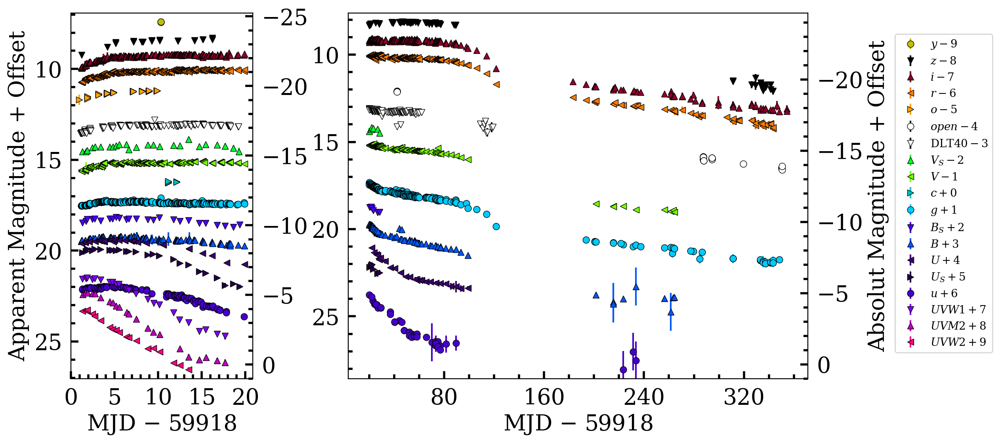

In [10]:
result_dir = '/tf/ProjectGabriel/SUPERNOVAE/outputs/images/'
data_dir = os.path.join('/tf/ProjectGabriel/SUPERNOVAE/data/','2022acko')

filename = os.path.join(data_dir,'2022acko_total.dat')
lc = lightcurve.LC.read(filename)

minmjd = min(lc['MJD'])
maxmjd = max(lc['MJD'])
print(minmjd, maxmjd)
lc.meta['dm'] = 30.81
lc.meta['extinction'] = {
    'U_S': 0.125,
    'B_S':0.103,
    'V_S':0.082,
    'U': 0.131,
    'B': 0.109,
    'V': 0.083,
    'R': 0.065,
    'I': 0.045,
    'u': 0.128,
    'g': 0.100,
    'c': 0.085,
    'r': 0.069,
    'o': 0.060,
    'i': 0.051,
    'z': 0.038,
    'w': 0.071,
    'y': 0.033,
    'UVW2': 0.234,
    'UVM2': 0.211,
    'UVW1': 0.166,
    'DLT40': 0.083,
    }
    # Based on no Na I D detection in spectrum
lc.meta['hostext'] = {
    'U': 0.,
    'B': 0.,
    'V': 0.,
    'R': 0.,
    'I': 0.,
    'u': 0.,
    'g': 0.,
    'r': 0.,
    'i': 0.,
    'z': 0.,
    'UVW2': 0.,
    'UVM2': 0.,
    'UVW1': 0.,
    'o': 0.,
    'c': 0.,
    'U_S': 0.,
    'B_S': 0.,
    'V_S': 0.,
    'DLT40': 0.,
    'w': 0.,
    'y': 0.,
    }
z = 0.00526
lc.meta['redshift'] = z  # redshift
lc.calcAbsMag()
# lc['absmag'] = absolutemag(lc['mag'] )
reset_plot_style()

extent_lightcurve_plot(lc, filter_spacing=1, filename=result_dir+'paper2025/data_displacement.pdf', smooth=False)
# extent_lightcurve_plot(lc, filter_spacing=1, filename=result_dir+'data_displacement.pdf', smooth=True)

In [75]:
print(min(lc["MJD"]))

59918.933279


# Analysing Flatchains

In [4]:
import sys
from lightcurve_fitting import lightcurve, models, fitting, bolometric
from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
result_dir = '/tf/ProjectGabriel/SUPERNOVAE/outputs/images/'
data_dir = os.path.join('/tf/ProjectGabriel/SUPERNOVAE/data/','2022acko')

filename = os.path.join(data_dir,'2022acko_total.dat')
lc = lightcurve.LC.read(filename)

minmjd = min(lc['MJD'])
maxmjd = max(lc['MJD'])
print(minmjd, maxmjd)
lc.meta['dm'] = 30.81
lc.meta['extinction'] = {
  'U_S': 0.125,
  'B_S':0.103,
  'V_S':0.082,
  'U': 0.131,
  'B': 0.109,
  'V': 0.083,
  'R': 0.065,
  'I': 0.045,
  'u': 0.128,
  'g': 0.100,
  'c': 0.085,
  
  'r': 0.069,
  'o': 0.060,
  'i': 0.051,
  'z': 0.038,
  'UVW2': 0.234,
  'UVM2': 0.211,
  'UVW1': 0.166,
  'DLT40': 0.083,
}
# Based on no Na I D detection in spectrum
lc.meta['hostext'] = {
  'U': 0.,
  'B': 0.,
  'V': 0.,
  'R': 0.,
  'I': 0.,
  'u': 0.,
  'g': 0.,
  'r': 0.,
  'i': 0.,
  'z': 0.,
  'UVW2': 0.,
  'UVM2': 0.,
  'UVW1': 0.,
  'o': 0.,
  'c': 0.,
  'U_S': 0.,
  'B_S': 0.,
  'V_S': 0.,
  'DLT40': 0.,
}
z = 0.00526
lc.meta['redshift'] = z  # redshift
lc.calcAbsMag()

59918.933279 60272.372
MW extinction not applied to filter y
host extinction not applied to filter y
MW extinction not applied to filter w
host extinction not applied to filter w


 used in the paper sc3_flattchain_prior_informed.npy

In [ ]:
ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5

units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)

sc4_flatchain = np.load('outputs/sc4_flattchain_DYNAMICAL_fpm.npy')*units_array#'outputs/flatchain_sc4_full_lc_neuripsprior.npy')*units_array#[:,:]
sc3_flatchain = np.load('outputs/sc3_flattchain_DYNAMICAL_fpm_newtmax.npy')*units_array#[:, np.array([True,True,True,True,False,False ,True,True])]#'outputs/flatchain_sc3_full_lc_neuripsprior.npy')*units_array#[:,:]

nwalkers = 40
nsteps = 10000
nparams = sc3_flatchain.shape[-1]
sc4_walker_chain = np.zeros((nwalkers, nsteps, nparams)).astype('float32')
sc3_walker_chain = np.zeros((nwalkers, nsteps, nparams)).astype('float32')

for i in range(nwalkers):

    sc4_walker_aux = sc4_flatchain[i::nwalkers]
    sc3_walker_aux = sc3_flatchain[i::nwalkers]
    
    sc4_walker_chain[i] = sc4_walker_aux
    sc3_walker_chain[i] = sc3_walker_aux    

nburnin =  5000
sc4_walker_chain = sc4_walker_chain[:,nburnin:,:]

sc3_walker_chain = sc3_walker_chain[:,nburnin:,:]

In [8]:
def outside_bound_idx(arr, plow=16, pupp=84, get_complement=False):

    lowerlim = np.percentile(arr, plow)
    upperlim = np.percentile(arr, pupp)
    
    mask = (arr>=lowerlim)*(arr<=upperlim)
    idxs_in = np.arange(len(arr))[mask]
    idxs_out = np.arange(len(arr))[~mask]
    if get_complement:
        return idxs_out, idxs_in
    else:
        return idxs_out

In [9]:
import astropy.units as u
use_sigma = True

model = models.ShockCooling4(lc)
if use_sigma and model.input_names[-1] != '\\sigma':
    model.input_names.append('\\sigma')
    model.units.append(u.dimensionless_unscaled)

model.units[3] = u.Rsun
model.units[0] = 10**3*u.km/u.s
axis_labels_corner = model.axis_labels
axis_labels_corner.append('$\\sigma$')

Text(0.5, 0, 'steps')

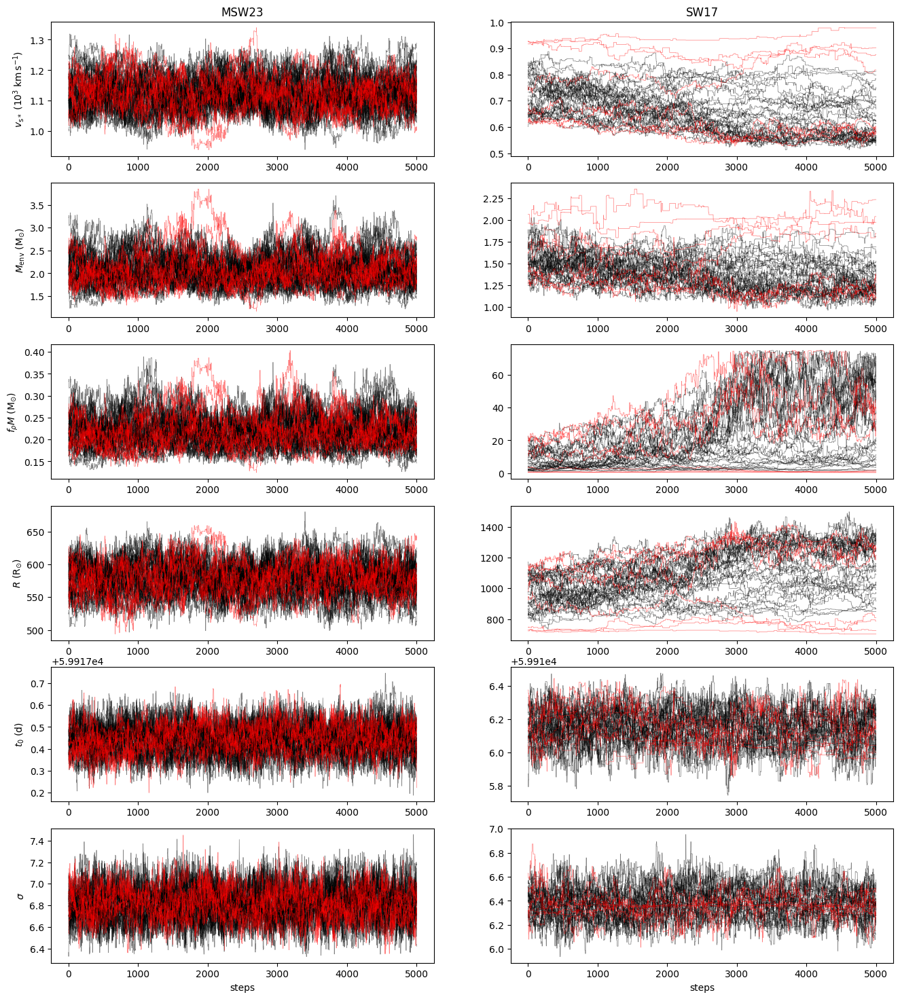

In [10]:

plt.rcdefaults()
fig, axes = plt.subplots(figsize=(16, 3*nparams), nrows=nparams, ncols=2)


iterations = np.arange(nsteps-nburnin)

axes[0,0].set_title('MSW23')
axes[0,1].set_title('SW17')



pfit_sc4_param = sc4_walker_chain[:,:,2].T
last_points_param_sc4 = np.mean(pfit_sc4_param[:], axis=0)

idxs_out_sc4, idxs_in_sc4 = outside_bound_idx(last_points_param_sc4, plow=10, pupp=90, get_complement=True)

pfit_sc3_param = sc3_walker_chain[:,:,1].T
last_points_param_sc3 = np.mean(pfit_sc3_param[:], axis=0)

idxs_out_sc3, idxs_in_sc3 = outside_bound_idx(last_points_param_sc3, plow=10, pupp=90, get_complement=True)

for i in range(nparams):
    ax_sc4 = axes[i, 0]
    ax_sc3 = axes[i, 1]
    
    pfit_sc4 = sc4_walker_chain[:,:,i].T
    pfit_sc3 = sc3_walker_chain[:,:,i].T
    
    ax_sc4.plot(iterations, pfit_sc4[:, idxs_in_sc4], c='black', lw=.5, alpha=.5)
    ax_sc4.plot(iterations, pfit_sc4[:, idxs_out_sc4], c='red', lw=.5, alpha=.5)
    
    ax_sc3.plot(iterations, pfit_sc3[:, idxs_in_sc3], c='black', lw=.5, alpha=.5)
    ax_sc3.plot(iterations, pfit_sc3[:, idxs_out_sc3], c='red', lw=.5, alpha=.5)

    ax_sc4.set_ylabel(axis_labels_corner[i])
ax_sc4.set_xlabel('steps')
ax_sc3.set_xlabel('steps')

In [15]:
# selecting the same number of walkers
minimum_nwalk = np.min([len(idxs_in_sc4),len(idxs_in_sc3),32])
print(minimum_nwalk)
np.save('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL_v2_newtmax.npy', sc3_walker_chain[idxs_in_sc3, :, :][:minimum_nwalk])
# np.save('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL_v2.npy', sc4_walker_chain[idxs_in_sc4, :, :][:minimum_nwalk])

32


# Model Lightcurves

In [23]:
import sys
sys.path.insert(0, '../')

from lightcurve_fitting import lightcurve, models, fitting, bolometric, filters

from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patheffects as pe
import copy
from scipy.interpolate import interp1d
import corner
import importlib 


%matplotlib inline

In [24]:
import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    plt.rcdefaults()
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()

In [25]:
def get_fits(model, flatchain,lc, num_models_to_plot=100, ycol='absmag',xfit=None, yscale=None):


    choices = np.random.choice(flatchain.shape[0], num_models_to_plot, replace=False)
    ps = flatchain[choices].T
    
    if type(xfit)==type(None):
        xfit = np.arange(lc['MJD'].min()-.1, lc['MJD'].max()+.1, 0.1)
        
    ufilts = np.unique(lc['filter'])
    
    y_fit = model(xfit, ufilts, *ps)
    
    # if mjd_offset is None:
    #     mjd_offset = np.floor(tmin)
    
    if ycol == 'lum':
        dycol = 'dlum'
        
        if yscale==None:
            yscale = 10. ** np.round(np.log10(y_fit.max()))
        # yscale2 = 10. ** np.round(np.log10(y_fit2.max()))
        ylabel = 'Luminosity $L_\\nu$ (10$^{{{:.0f}}}$ erg s$^{{-1}}$ Hz$^{{-1}}$) + Offset'.format(
            np.log10(yscale) + 7)  # W --> erg / s  
        
    elif ycol == 'absmag':
        dycol = 'dmag'
                                 
        if yscale==None:
            yscale = 1.
        ylabel = 'Absolute Magnitude + Offset'
        y_fit =  - 2.5 * np.log10(y_fit) + np.array([filt.M0 for filt in ufilts]).reshape((-1,)+(1,)*len(y_fit.shape[1:]))
        # print(y_fit.shape)
        # aaa
        # ax.invert_yaxis()
                                 
    elif ycol == 'flux':
        dycol = 'dflux'
                                 
        if yscale==None:
            yscale = 10. ** np.round(np.log10( y_fit.max()))
        ylabel = 'Flux $F_\\nu$ (10$^{{{:.0f}}}$ erg s$^{{-1}}$ m$^{{-2}}$ Hz$^{{-1}}$) + Offset'.format(
            np.log10(yscale) + 7)
                                 
    else:
        raise ValueError(f'ycol="{ycol}" is not recognized. Use "lum", "absmag", "flux".')
        
                                 
    return y_fit, yscale, ylabel, xfit
                                 
                     

def plt_style():
    plt.rcParams.update({
                        'lines.linewidth':1.0,
                        'lines.linestyle':'-',
                        'lines.color':'black',
                        'font.family':'serif',
                        'font.weight':'normal',
                        'font.size':22.0,
                        'text.color':'black',
                        # 'text.usetex':False,
                        'axes.edgecolor':'black',
                        'axes.linewidth':1.0,
                        'axes.grid':False,
                        'axes.titlesize':'x-large',
                        'axes.labelsize':'x-large',
                        'axes.labelweight':'normal',
                        'axes.labelcolor':'black',
                        'axes.formatter.limits':[-4,4],
                        'xtick.major.size':7,
                        'xtick.minor.size':4,
                        'xtick.major.pad':8,
                        'xtick.minor.pad':8,
                        'xtick.labelsize':'medium',
                        'xtick.minor.width':1.0,
                        'xtick.major.width':1.0,
                        'ytick.major.size':7,
                        'ytick.minor.size':4,
                        'ytick.major.pad':8,
                        'ytick.minor.pad':8,
                        'ytick.labelsize':'medium',
                        'ytick.minor.width':1.0,
                        'ytick.major.width':1.0,
                        'legend.numpoints':1,
                        #'legend.fontsize':'x-large',
                        'legend.shadow':False,
                        'legend.frameon':False})
    
# These are the "Tableau 20" colors as RGB.
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]

# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.
for i in range(len(tableau20)):
    r, g, b = tableau20[i]
    tableau20[i] = (r / 255., g / 255., b / 255.)    

def binnarize(x, y, nbins=5, bins_ref=None):
    
    
    minimum = np.min(x)
    maximum = np.max(x)

    if bins_ref is not None:
        minimum = np.min(bins_ref)
        maximum = np.max(bins_ref)
    
    width = (maximum-minimum)/nbins
    newx = []
    newy = []
    for i in range(nbins):
        inbetween = (x<minimum+(i+1)*width) & (x>=minimum+(i)*width)
        if np.sum(inbetween)==0:
            continue
        
        newx.append(np.mean(x[inbetween]))
        newy.append(np.mean(y[inbetween]))
    # print(newx, newy)
    return np.array(newx), np.array(newy)

In [26]:
# result_dir = '/tf/ProjectGabriel/STEP/2022acko-main/results/'
# data_dir = '/tf/ProjectGabriel/STEP/2022acko-main/data/'

filename = os.path.join('data/2022acko','2022acko_total.dat')
lc = lightcurve.LC.read(filename, format='ascii')


minmjd = min(lc['MJD'])
maxmjd = max(lc['MJD'])
print(minmjd, maxmjd)
lc.meta['dm'] = 30.81
lc.meta['extinction'] = {
    'U_S': 0.125,
    'B_S':0.103,
    'V_S':0.082,
    'U': 0.131,
    'B': 0.109,
    'V': 0.083,
    'R': 0.065,
    'I': 0.045,
    'u': 0.128,
    'g': 0.100,
    'c': 0.085,
    'r': 0.069,
    'o': 0.060,
    'i': 0.051,
    'z': 0.038,
    'w': 0.071,
    'y': 0.033,
    'UVW2': 0.234,
    'UVM2': 0.211,
    'UVW1': 0.166,
    'DLT40': 0.083,
    }
    # Based on no Na I D detection in spectrum
lc.meta['hostext'] = {
    'U': 0.,
    'B': 0.,
    'V': 0.,
    'R': 0.,
    'I': 0.,
    'u': 0.,
    'g': 0.,
    'r': 0.,
    'i': 0.,
    'z': 0.,
    'UVW2': 0.,
    'UVM2': 0.,
    'UVW1': 0.,
    'o': 0.,
    'c': 0.,
    'U_S': 0.,
    'B_S': 0.,
    'V_S': 0.,
    'DLT40': 0.,
    'w': 0.,
    'y': 0.,
    }
z = 0.005264
lc.meta['redshift'] = z  # redshift

T_MAX_5 = 59930.22490293351
T_MAX_3 = 59928.9187728182
T_max = 59935.92


lc_early = lc.where(MJD_min=lc['MJD'].min()-10, MJD_max=T_max)
lc_early.calcAbsMag()
lc_early.calcLum()

59918.933279 60272.372


## comparing two models


In [27]:
# in case of a specific filter selection
filters_to_plot =[str(f) for f in np.unique(lc['filter'])]#['U', 'u_s', 'U_S','UVW1', 'UVW2', 'UVM2']#'UVW1', 'UVM1', 'UVW2', 'UVM2']

fmask=np.full(len(lc_early), False)

for i, filt in enumerate(filters_to_plot):
    
    # print(np.array(lc_early['filter']).astype('str'))
    fmask += (np.array(lc_early['filter']).astype('str') == filt)
    
lc_masked = lc_early[fmask]

In [59]:
np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL.npy')/units_array

array([[[3.04754446e-01, 2.15297222e+00, 6.64076984e-01, 4.41626383e+00,
         5.99178281e+04, 6.86862707e+00],
        [3.04754446e-01, 2.15297222e+00, 6.64076984e-01, 4.41626383e+00,
         5.99178281e+04, 6.86862707e+00],
        [3.04754446e-01, 2.15297222e+00, 6.64076984e-01, 4.41626383e+00,
         5.99178281e+04, 6.86862707e+00],
        ...,
        [3.55844298e-01, 1.19596481e+00, 4.08685803e-01, 3.99833648e+00,
         5.99179219e+04, 7.18559980e+00],
        [3.50483781e-01, 1.25256753e+00, 4.10381705e-01, 4.06216141e+00,
         5.99178672e+04, 7.11578369e+00],
        [3.50483781e-01, 1.25256753e+00, 4.10381705e-01, 4.06216141e+00,
         5.99178672e+04, 7.11578369e+00]],

       [[3.18309636e-01, 1.78543830e+00, 5.60930133e-01, 4.34540419e+00,
         5.99179414e+04, 6.88825178e+00],
        [3.18092312e-01, 1.87589693e+00, 5.79741657e-01, 4.29923802e+00,
         5.99179258e+04, 6.89743280e+00],
        [3.18092312e-01, 1.87589693e+00, 5.79741657e-01, 4.299238

In [62]:
ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5
ycol = "absmag"
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)

sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL.npy')/units_array#[:,1000:, :]#/units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL.npy')/units_array#/units_array#[:,:, :]#[1000*32:]#/units_array
model_sc3 = models.ModifiedShockCooling3(lc_masked)


nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]


squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)[:,:-1]
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)[:,:-1]

median_sc4_flatchain = np.median(squeezed_sc4_flatchain, axis=0).reshape(1,-1)
median_sc3_flatchain = np.median(squeezed_sc3_flatchain, axis=0).reshape(1,-1)

median_yfit_sc4, yscale, ylabel, xfit = get_fits(model=model_sc4,
                                       flatchain=median_sc4_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=1,
                                       ycol=ycol,#"absmag",#model_sc4.output_quantity,
                                       xfit=None,
                                       yscale=None,)
median_yfit_sc3, yscale, ylabel, xfit = get_fits(model=model_sc3,
                                       flatchain=median_sc3_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=1,
                                       ycol=ycol,#"absmag",#model_sc3.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)

num_models_to_plot=100

yfit_sc4_samples, _, _, _ = get_fits(model=model_sc4,
                                       flatchain=squeezed_sc4_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=num_models_to_plot,
                                       ycol=ycol,#"absmag",#model_sc4.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)
yfit_sc3_samples, _, _, _ = get_fits(model=model_sc3,
                                       flatchain=squeezed_sc3_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=num_models_to_plot,
                                       ycol=ycol,#"absmag",#model_sc3.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)

std_yfit_sc4 = np.zeros((median_yfit_sc4.shape)).astype('float64')
std_yfit_sc3 = np.zeros((median_yfit_sc3.shape)).astype('float64')

for i_filt in range(len(median_yfit_sc4)):
    std_yfit_sc4[i_filt] = np.std(yfit_sc4_samples[i_filt], axis=1)
    std_yfit_sc3[i_filt] = np.std(yfit_sc3_samples[i_filt], axis=1)


print(median_yfit_sc4.shape)

(18, 172)


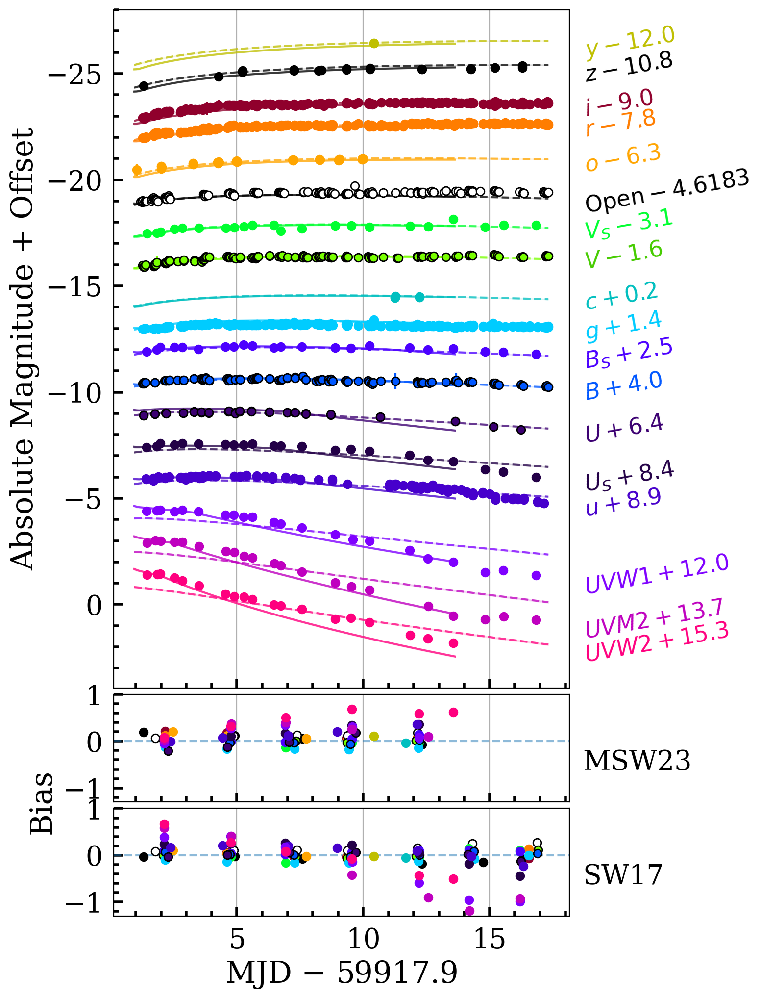

In [93]:
import matplotlib.patheffects as pe

ufilts = np.unique(lc_early['filter'])
ycol = 'absmag'
dycol = 'dmag'

reset_plot_style()

# plt_style()
# Create a figure with size 8x16
fig = plt.figure(figsize=(6, 12), dpi=200)


nrows=8
gs = fig.add_gridspec(nrows=nrows, ncols=1, hspace=.06)


main_ax = fig.add_subplot(gs[:-2])
sc4_bias_ax = fig.add_subplot(gs[-2:-1], sharex=main_ax)
sc3_bias_ax = fig.add_subplot(gs[-1:], sharex=main_ax)

main_ax.tick_params('x', labelbottom=False)
main_ax.invert_yaxis()
# bias_ax.tick_params('x', labelbottom=False)

# main_ax.tick_params(axis='x', length=2, width=1)
#mcmcbias_ax.tick_params(axis='x', length=2, width=1)

# main_ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
main_ax.grid(True, axis='x')
sc4_bias_ax.grid(True, axis='x')
sc3_bias_ax.grid(True, axis='x')
#mcmcbias_ax.grid(True, axis='x')
#bayebias_ax.grid(True, axis='x')


x_position_xlabel = .28
y_position_xlabel = .057
# x_label.set_position((0.5, -0.1))  # Move the x-label down by 0.1 of the axes height
# y_label.set_position((x_position_ylabe, 0.5))
mjd_offset = round(np.squeeze(median_sc4_flatchain)[-1], 1)#59916.9

xlabel = 'MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.')
# fig.text(x_position_xlabel, y_position_xlabel ,
#          xlabel,
#          va='center', rotation=180,
#          fontsize=plt.rcParams['axes.labelsize'])


#np.mean([to_plots_baye_flat_chain.mean(axis=0)[-1], to_plots_baye_flat_chain.mean(axis=0)[-1]])#lc['MJD'].min()
sc3_bias_ax.set_xlabel('MJD $-$ {:.2f}'.format(mjd_offset).rstrip('0').rstrip('.'))  # Move the x-label down by 0.1 of the axes height
main_ax.set_ylabel(ylabel,)#.set_position((x_position_ylabel, 0.5))

# bias_ax.set_ylim(-0.2, 0.07)
#bayebias_ax.set_ylim(-0.2, 0.07)
sc4_bias_ax.axhline(0, ls='--', alpha=.5)
sc3_bias_ax.axhline(0, ls='--', alpha=.5)



sc4_bias_ax.annotate('MSW23', xy=(1.03,.3), xycoords='axes fraction')
sc3_bias_ax.annotate('SW17', xy=(1.03,.3), xycoords='axes fraction')

#bayebias_ax.axhline(0, ls='--', alpha=.5)

#mcmcbias_ax.annotate('MSW23', xy=(.8,.1), xycoords='axes fraction')
#bayebias_ax.annotate('LSTM-BNN', xy=(.8,.1), xycoords='axes fraction')


filter_spacing = 1.5
offset_0 = -len(ufilts) // 2 * filter_spacing
offset = offset_0
# for filt, f_yfit_median, std_filt_mcmc in zip(ufilts,
#                                                    median_yfit, 
#                                  
#                   std_yfit):

prev_filt = ufilts[-1]
for n in range(len(ufilts))[::-1]:   

    filt = ufilts[n]
    sc4_f_yfit_median = median_yfit_sc4[n]
    sc4_std_filt_mcmc = std_yfit_sc4[n]
    sc3_f_yfit_median = median_yfit_sc3[n]
    sc3_std_filt_mcmc = std_yfit_sc3[n]
    
    sc4_interp_filt = interp1d(xfit, sc4_f_yfit_median, kind='linear')
    sc3_interp_filt = interp1d(xfit, sc3_f_yfit_median, kind='linear')
    # baye_interp_filt = interp1d(xfit, f_yfit_baye_median, kind='linear')

    alpha=.75
    alpha_fill=.1
    validity_time_sc4 = 59931.54
    validity_time_sc3 = 59935.27#59935.27
    max_mjd = np.max([validity_time_sc4, validity_time_sc3])
    lc_filt = lc_early.where(filter=filt, MJD_max=max_mjd )
    lc_filt.sort("MJD")
    if len(lc_filt)==0:
        continue
    first_point = lc_filt[ycol][0]
    if filt.name == "z":
        first_point = lc_filt[ycol][0]-.5
    

    offset += filter_spacing + (lc_early.where(filter=prev_filt)[ycol][0]-first_point)
    # print()/
    prev_filt = filt
    # offset_0 = offset

    if len(lc_filt)==0:
        continue
    


    xfit_cut_sc4 = xfit < validity_time_sc4
    xfit_cut_sc3 = xfit < validity_time_sc3

    main_ax.errorbar(lc_filt['MJD'] - mjd_offset, lc_filt[ycol] / yscale + offset, lc_filt[dycol] / yscale,
                ls='none', marker='o', **filt.plotstyle)

    main_ax.plot((xfit - mjd_offset)[xfit_cut_sc4], sc4_f_yfit_median[xfit_cut_sc4] / yscale + offset, color=filt.linecolor, alpha=alpha)
    main_ax.fill_between((xfit - mjd_offset)[xfit_cut_sc4], (sc4_f_yfit_median-sc4_std_filt_mcmc)[xfit_cut_sc4] / yscale + offset,
                 (sc4_f_yfit_median+sc4_std_filt_mcmc)[xfit_cut_sc4] / yscale + offset,
                 color=filt.linecolor, alpha=alpha_fill)
    
    main_ax.plot((xfit - mjd_offset)[xfit_cut_sc3], sc3_f_yfit_median[xfit_cut_sc3] / yscale + offset, color=filt.linecolor, alpha=alpha, ls='--')
    main_ax.fill_between((xfit - mjd_offset)[xfit_cut_sc3], (sc3_f_yfit_median-sc3_std_filt_mcmc)[xfit_cut_sc3] / yscale + offset,
                 (sc3_f_yfit_median+sc3_std_filt_mcmc)[xfit_cut_sc3] / yscale + offset,
                 color=filt.linecolor, alpha=alpha_fill)

    
    # main_ax.plot(xfit - mjd_offset, f_yfit_baye_median / yscale + offset, color=filt.linecolor, alpha=alpha, ls='--')
    # main_ax.fill_between(xfit - mjd_offset, (f_yfit_baye_median-std_filt_baye) / yscale + offset,
    #                      (f_yfit_baye_median+std_filt_baye) / yscale + offset,
    #                      color=filt.linecolor, alpha=alpha_fill,
    #                      path_effects=[pe.PathPatchEffect(offset=(0, 0),
    #                                                                    hatch='xxx',
    #                                                                    facecolor=filt.plotstyle['color'],
    #                                                                    edgecolor=filt.plotstyle['color'],
    #                                                                    alpha=.15)])


    
    residual_sc4 = sc4_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    residual_sc3 = sc3_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # residual_baye = baye_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # print(len(residual_mcmc), len(lc_filt['MJD']))
    # print(len())


    reduced_reldiff_x_sc4, reduced_reldiff_y_sc4= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual_sc4/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)

    reduced_reldiff_x_sc3, reduced_reldiff_y_sc3= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual_sc3/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)
    

    reduced_xfit_cut_sc4 = reduced_reldiff_x_sc4 < validity_time_sc4 - mjd_offset
    reduced_xfit_cut_sc3 = reduced_reldiff_x_sc3 < validity_time_sc3 - mjd_offset
    
    # reduced_reldiff_x_baye, reduced_reldiff_y_baye= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            # residual_baye/yscale,
                                                            # nbins=7,
                                                           # bins_ref=lc_early['MJD']-mjd_offset)
    plotstyle = copy.copy(filt.plotstyle)
    # plotstyle['mfc'] = 'none'
    sc4_bias_ax.plot(reduced_reldiff_x_sc4[reduced_xfit_cut_sc4], reduced_reldiff_y_sc4[reduced_xfit_cut_sc4],
                      ls='',marker='o', **plotstyle)
    # for other_ax in sc4_bias_ax.get_shared_x_axes().get_siblings(sc4_bias_ax):
    #     if other_ax is not sc4_bias_ax:
    #         sc4_bias_ax.get_shared_x_axes().remove(sc4_bias_ax, other_ax)
    # sc4_bias_ax.set_xticklabels([])
    for label in sc4_bias_ax.get_xticklabels():
        label.set_visible(False)
    sc3_bias_ax.plot(reduced_reldiff_x_sc3[reduced_xfit_cut_sc3], reduced_reldiff_y_sc3[reduced_xfit_cut_sc3],
                      ls='',marker='o', **plotstyle)

    #bayebias_ax.plot(reduced_reldiff_x_baye, reduced_reldiff_y_baye,
                      # ls='',marker='o', **plotstyle)
    
    filtname = [key for key, value in filters.filtdict.items() if value == filt]

    # print(filtname)
    # print(filtname)
    i=0
    while ('SPLUS' in filtname[i].upper()) or ('SWOPE' in filtname[i].upper()) \
    or ('PAN' in filtname[i].upper()) or ('DLT' in filtname[i].upper()):
        i+=1
    
    
    txt = f'${filtname[i]}{offset:+.1f}$' if filt.italics else rf'$\mathrm{{{filtname[i]}}}{offset:+g}$'
    main_ax.text(1.03, lc_filt[ycol][-1] / yscale + offset, txt, color=filt.textcolor, fontdict={'size': 'small'},
            ha='left', va='center', transform=main_ax.get_yaxis_transform(), rotation=10)
    

y0_ax1 = sc4_bias_ax.get_position().y0
y1_ax1 = sc4_bias_ax.get_position().y1
y0_ax2 = sc3_bias_ax.get_position().y0
y1_ax2 = sc3_bias_ax.get_position().y1
mid_y = (y0_ax2 + y1_ax1) / 2

# Optional: compute average x-position (left) to place the label closer to the y-axis
x_pos =  -0.07# tweak this to align as needed

# Add shared y-axis label

ylab = sc4_bias_ax.set_ylabel("Bias")
ylab.set_position((-0.2, 0))  

sc4_bias_ax.set_ylim(-1.3, 1)
sc3_bias_ax.set_ylim(-1.3, 1)
plt.savefig("outputs/images/paper2025/two_models_fit_absmag.pdf", bbox_inches="tight")

## undersampling lc

In [36]:
# print(np.unique(lc_early['filter']))
ufilts = np.unique(lc_early['filter'])
filt_ref = ufilts[0]
nsamples_ref = np.sum(lc_early['filter']==filt_ref)
nsamples_ref
undersampled_lc = lc_early.copy()
for filt in ufilts:
    if np.sum(undersampled_lc['filter']==filt) > nsamples_ref:
        filt_idxs = np.arange(len(undersampled_lc))[undersampled_lc['filter']==filt]
        to_drop_idxs = np.random.choice(filt_idxs, len(filt_idxs)-nsamples_ref, replace=False)
        undersampled_lc.remove_rows(to_drop_idxs)
undersampled_lc        # print(to_drop_idxs)

MJD,filter,mag,dmag,absmag,lum,dlum
float64,object,float64,float64,float64,float64,float64
59919.20607,B,16.4321,0.008,-14.4869,3.0172189196825522e+19,2.223169058163406e+17
59919.27694,B,16.424,0.0719,-14.495,3.039812680576821e+19,2.0130353098261358e+18
59920.1854,B,16.3408,0.0527,-14.578199999999997,3.2819111722812297e+19,1.5929902495767885e+18
59920.23555,B,16.3263,0.126,-14.592699999999999,3.326035056064485e+19,3.859873284390328e+18
59920.78358,B,16.3108,0.0177,-14.608199999999998,3.373858174108468e+19,5.500165640605414e+17
59921.21242,B,16.2518,0.007,-14.6672,3.5622699087584657e+19,2.2966802849559808e+17
59922.57524,B,16.2422,0.0076,-14.676799999999998,3.5939068982387765e+19,2.5156840406458947e+17
59922.57787,B,16.2419,0.0074,-14.677099999999998,3.5949000686179475e+19,2.4501587394056755e+17
59922.61214,B,16.2874,0.1013,-14.631599999999997,3.4473614618389844e+19,3.2164140290604447e+18


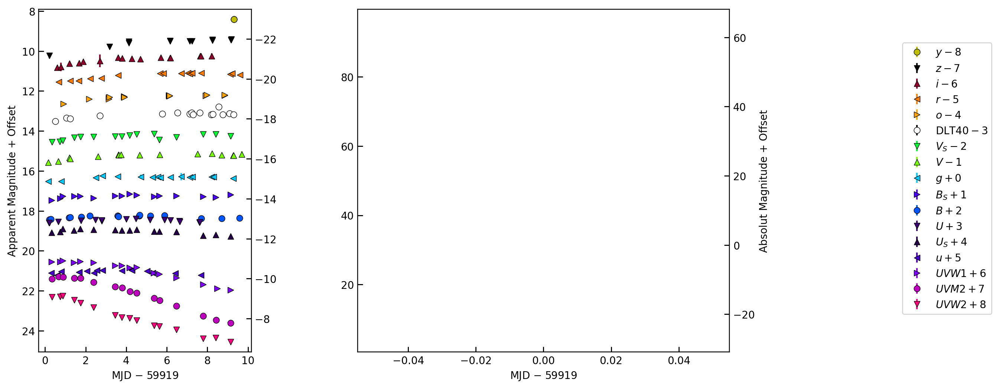

In [60]:
extent_lightcurve_plot(undersampled_lc, filter_spacing=1, filename=result_dir+'data_displacement_under.pdf', smooth=False)

## balancing lc - under and over sampling relative to the mean

In [13]:
from scipy.interpolate import interp1d

# print(np.unique(lc_early['filter']))
ufilts = np.unique(lc_early['filter'])

nsamples_ref = len(lc_early)//len(ufilts)

filt_ref = ufilts[0]

# nsamples_ref = np.sum(lc_early['filter']==filt_ref)
# nsamples_ref
balanced_lc = lc_early.copy()
for filt in ufilts:
    if np.sum(balanced_lc['filter']==filt) > nsamples_ref:
        filt_idxs = np.arange(len(balanced_lc))[balanced_lc['filter']==filt]
        to_drop_idxs = np.random.choice(filt_idxs, len(filt_idxs)-nsamples_ref, replace=False)
        balanced_lc.remove_rows(to_drop_idxs)
    elif np.sum(balanced_lc['filter']==filt)<3:
        pass
    else:
        lc_filt = balanced_lc.copy()[balanced_lc['filter']==filt]
        x = lc_filt['MJD']
        y = lc_filt['mag']
        yerr = np.mean(lc_filt['dmag'])
        interp_flux_function = interp1d(x, y, kind='linear')

        mjd_new = np.random.uniform(np.min(x), np.max(x), nsamples_ref-len(x))
        flux_new = interp_flux_function(mjd_new)
        for i in range(len(mjd_new)):
            row = {
                "MJD": float(mjd_new[i]),  # Example MJD values (Modified Julian Date)
                "mag": float(flux_new[i]),  # Example flux values
                "dmag": float(yerr),
                "filter":filt  # Example dflux values
            }
            balanced_lc.add_row(row) 

        # lc_filt.where(MJD_min=lc['MJD'].min()-10, MJD_max=T_max)

balanced_lc.calcAbsMag() 
balanced_lc.calcLum()       # print(to_drop_idxs)

MW extinction not applied to filter y
host extinction not applied to filter y


In [58]:
balanced_lc

MJD,filter,mag,dmag,absmag,lum,dlum
float64,object,float64,float64,float64,float64,float64
59919.1579,B,16.4799,0.0729,-14.439099999999998,2.8872661703658734e+19,1.93860813425266e+18
59919.20607,B,16.4321,0.008,-14.4869,3.0172189196825522e+19,2.223169058163406e+17
59919.65051,B,16.4324,0.0078,-14.486599999999997,3.0163853464534487e+19,2.16699098724245e+17
59919.65316,B,16.439,0.0095,-14.479999999999999,2.9981048870145364e+19,2.623288815627462e+17
59920.03219,B,16.3526,0.1065,-14.5664,3.246435825698276e+19,3.184432958223848e+18
59920.09397,B,16.3455,0.0092,-14.573499999999997,3.2677349439576797e+19,2.7689194992910685e+17
59920.09659,B,16.3459,0.0084,-14.573099999999998,3.2665312876498285e+19,2.5272126595770227e+17
59920.1854,B,16.3408,0.0527,-14.578199999999997,3.2819111722812297e+19,1.5929902495767885e+18
59920.19439,B,16.3482,0.0729,-14.5708,3.2596188628512522e+19,2.1886183223925235e+18


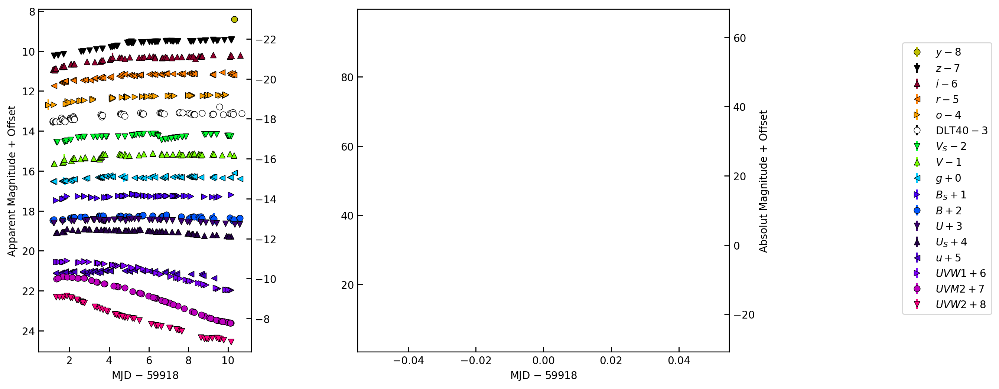

In [59]:
extent_lightcurve_plot(balanced_lc, filter_spacing=1, filename=result_dir+'data_displacement_balanced.pdf', smooth=False)

In [39]:
# in case of a specific filter selection
filters_to_plot =[str(f) for f in np.unique(lc['filter'])]#['U', 'u_s', 'U_S','UVW1', 'UVW2', 'UVM2']#'UVW1', 'UVM1', 'UVW2', 'UVM2']

fmask=np.full(len(lc_early), False)

for i, filt in enumerate(filters_to_plot):
    
    # print(np.array(lc_early['filter']).astype('str'))
    fmask += (np.array(lc_early['filter']).astype('str') == filt)
    
lc_masked = lc_early[fmask]

## Single model plot

In [88]:
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)

sc_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w.npy')#/units_array
model = models.ShockCooling4(lc_masked)



nsteps = sc_flatchain.shape[1]
nwalkers = sc_flatchain.shape[0]
nparams = sc_flatchain.shape[2]

squeezed_sc_flatchain = sc_flatchain.reshape(nwalkers*nsteps, nparams)[:,:-1]

median_sc_flatchain = np.median(squeezed_sc_flatchain, axis=0).reshape(1,-1)

median_yfit, yscale, ylabel, xfit = get_fits(model=model,
                                       flatchain=median_sc_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=1,
                                       ycol=model.output_quantity,
                                       xfit=None,
                                       yscale=None,)

num_models_to_plot=100

y_fit_samples, _, _, _ = get_fits(model=model,
                                       flatchain=squeezed_sc_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=num_models_to_plot,
                                       ycol=model.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)

std_yfit = np.zeros((median_yfit.shape)).astype('float64')
for i_filt in range(len(median_yfit)):
    std_yfit[i_filt] = np.std(y_fit_samples[i_filt], axis=1)


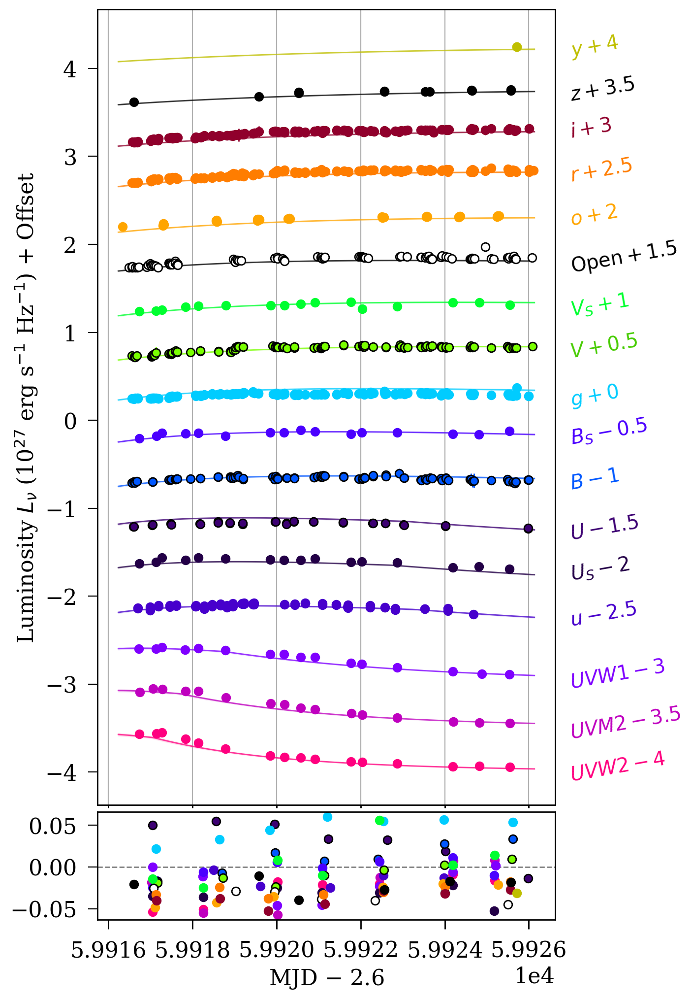

In [89]:
import matplotlib.patheffects as pe

ufilts = np.unique(lc_early['filter'])
ycol = 'lum'
dycol = 'dlum'

plt.rcdefaults()

plt.rcParams.update({
                    'lines.linewidth':1.0,
                    'lines.linestyle':'-',
                    'lines.color':'black',
                    'font.family':'serif',
                    'font.weight':'normal',
                    # 'font.size':22.0,
                    'text.color':'black',
                    'axes.edgecolor':'black',
                    'axes.linewidth':1.0,
                    'axes.grid':False,
                    'axes.titlesize':16,
                    'axes.labelsize':16,
                    'axes.labelweight':'normal',
                    'axes.labelcolor':'black',
                    'axes.formatter.limits':[-4,4],
                    'xtick.major.size':7,
                    'xtick.minor.size':4,
                    'xtick.major.pad':8,
                    'xtick.minor.pad':8,
                    'xtick.labelsize':16,
                    'xtick.minor.width':1.0,
                    'xtick.major.width':1.0,
                    'ytick.major.size':7,
                    'ytick.minor.size':4,
                    'ytick.major.pad':8,
                    'ytick.minor.pad':8,
                    'ytick.labelsize':16,
                    'ytick.minor.width':1.0,
                #    'ytick.major.width':1.0,
                    'legend.numpoints':1,
                    #'legend.fontsize':'x-large',
                    'legend.shadow':False,
                    'legend.frameon':False})
# plt_style()
# Create a figure with size 8x16
fig = plt.figure(figsize=(6, 12), dpi=200)


nrows=8
gs = fig.add_gridspec(nrows=nrows, ncols=1, hspace=.06)


main_ax = fig.add_subplot(gs[:-1])
bias_ax = fig.add_subplot(gs[-1:], sharex=main_ax)

main_ax.tick_params('x', labelbottom=False)
# bias_ax.tick_params('x', labelbottom=False)

main_ax.tick_params(axis='x', length=2, width=1)
#mcmcbias_ax.tick_params(axis='x', length=2, width=1)

main_ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
main_ax.grid(True, axis='x')
#mcmcbias_ax.grid(True, axis='x')
#bayebias_ax.grid(True, axis='x')


x_position_xlabel = .28
y_position_xlabel = .057
# x_label.set_position((0.5, -0.1))  # Move the x-label down by 0.1 of the axes height
# y_label.set_position((x_position_ylabe, 0.5))
mjd_offset = round(np.squeeze(median_sc_flatchain)[-2], 1)#59916.9

xlabel = 'MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.')
# fig.text(x_position_xlabel, y_position_xlabel ,
#          xlabel,
#          va='center', rotation=180,
#          fontsize=plt.rcParams['axes.labelsize'])


#np.mean([to_plots_baye_flat_chain.mean(axis=0)[-1], to_plots_baye_flat_chain.mean(axis=0)[-1]])#lc['MJD'].min()
bias_ax.set_xlabel('MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.'))  # Move the x-label down by 0.1 of the axes height
main_ax.set_ylabel(ylabel,)#.set_position((x_position_ylabel, 0.5))

# bias_ax.set_ylim(-0.2, 0.07)
#bayebias_ax.set_ylim(-0.2, 0.07)
bias_ax.axhline(0, ls='--', alpha=.5)
#bayebias_ax.axhline(0, ls='--', alpha=.5)

#mcmcbias_ax.annotate('MSW23', xy=(.8,.1), xycoords='axes fraction')
#bayebias_ax.annotate('LSTM-BNN', xy=(.8,.1), xycoords='axes fraction')


filter_spacing = .5
offset = -len(ufilts) // 2 * filter_spacing

for filt, f_yfit_median, std_filt_mcmc in zip(ufilts,
                                                   median_yfit, 
                                                   std_yfit):
    

    mcmc_interp_filt = interp1d(xfit, f_yfit_median, kind='linear')
    # baye_interp_filt = interp1d(xfit, f_yfit_baye_median, kind='linear')

    alpha=.75
    alpha_fill=.1
    offset += filter_spacing
    lc_filt = lc_early.where(filter=filt)
    
    if len(lc_filt)==0:
        continue
    
    main_ax.errorbar(lc_filt['MJD'] - mjd_offset, lc_filt[ycol] / yscale + offset, lc_filt[dycol] / yscale,
                ls='none', marker='o', **filt.plotstyle)

    main_ax.plot(xfit - mjd_offset, f_yfit_median / yscale + offset, color=filt.linecolor, alpha=alpha)
    main_ax.fill_between(xfit - mjd_offset, (f_yfit_median-std_filt_mcmc) / yscale + offset,
                 (f_yfit_median+std_filt_mcmc) / yscale + offset,
                 color=filt.linecolor, alpha=alpha_fill)


    
    # main_ax.plot(xfit - mjd_offset, f_yfit_baye_median / yscale + offset, color=filt.linecolor, alpha=alpha, ls='--')
    # main_ax.fill_between(xfit - mjd_offset, (f_yfit_baye_median-std_filt_baye) / yscale + offset,
    #                      (f_yfit_baye_median+std_filt_baye) / yscale + offset,
    #                      color=filt.linecolor, alpha=alpha_fill,
    #                      path_effects=[pe.PathPatchEffect(offset=(0, 0),
    #                                                                    hatch='xxx',
    #                                                                    facecolor=filt.plotstyle['color'],
    #                                                                    edgecolor=filt.plotstyle['color'],
    #                                                                    alpha=.15)])


    
    residual_mcmc = mcmc_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # residual_baye = baye_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # print(len(residual_mcmc), len(lc_filt['MJD']))
    # print(len())
    reduced_reldiff_x_mcmc, reduced_reldiff_y_mcmc= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual_mcmc/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)
    
    # reduced_reldiff_x_baye, reduced_reldiff_y_baye= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            # residual_baye/yscale,
                                                            # nbins=7,
                                                           # bins_ref=lc_early['MJD']-mjd_offset)
    plotstyle = copy.copy(filt.plotstyle)
    # plotstyle['mfc'] = 'none'
    bias_ax.plot(reduced_reldiff_x_mcmc, reduced_reldiff_y_mcmc,
                      ls='',marker='o', **plotstyle)
    #bayebias_ax.plot(reduced_reldiff_x_baye, reduced_reldiff_y_baye,
                      # ls='',marker='o', **plotstyle)
    
    filtname = [key for key, value in filters.filtdict.items() if value == filt]

    # print(filtname)
    # print(filtname)
    i=0
    while ('SPLUS' in filtname[i].upper()) or ('SWOPE' in filtname[i].upper()) \
    or ('PAN' in filtname[i].upper()) or ('DLT' in filtname[i].upper()):
        i+=1
    
    
    txt = f'${filtname[i]}{offset:+g}$' if filt.italics else rf'$\mathrm{{{filtname[i]}}}{offset:+g}$'
    main_ax.text(1.03, lc_filt[ycol][-1] / yscale + offset, txt, color=filt.textcolor, fontdict={'size': 'x-large'},
            ha='left', va='center', transform=main_ax.get_yaxis_transform(), rotation=10)

# plt.xticks(rotation=90)
# plt.yticks(rotation=90)

# main_ax.set_ytick( rotation=45, ha='right')


## comparing two models


In [5]:
# in case of a specific filter selection
filters_to_plot =[str(f) for f in np.unique(lc['filter'])]#['U', 'u_s', 'U_S','UVW1', 'UVW2', 'UVM2']#'UVW1', 'UVM1', 'UVW2', 'UVM2']

fmask=np.full(len(lc_early), False)

for i, filt in enumerate(filters_to_plot):
    
    # print(np.array(lc_early['filter']).astype('str'))
    fmask += (np.array(lc_early['filter']).astype('str') == filt)
    
lc_masked = lc_early[fmask]

In [21]:
sc3_flatchain.shape, sc4_flatchain.shape

((32, 4000, 6), (32, 4000, 6))

In [6]:
ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5

units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)

sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_observed.npy')[:,1000:, :]#/units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL.npy')/units_array#[:,:, :]#[1000*32:]#/units_array
model_sc3 = models.ShockCooling4(lc_masked)


nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]


squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)[:,:-1]
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)[:,:-1]

median_sc4_flatchain = np.median(squeezed_sc4_flatchain, axis=0).reshape(1,-1)
median_sc3_flatchain = np.median(squeezed_sc3_flatchain, axis=0).reshape(1,-1)

median_yfit_sc4, yscale, ylabel, xfit = get_fits(model=model_sc4,
                                       flatchain=median_sc4_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=1,
                                       ycol="absmag",#model_sc4.output_quantity,
                                       xfit=None,
                                       yscale=None,)
median_yfit_sc3, yscale, ylabel, xfit = get_fits(model=model_sc3,
                                       flatchain=median_sc3_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=1,
                                       ycol="absmag",#model_sc3.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)

num_models_to_plot=100

yfit_sc4_samples, _, _, _ = get_fits(model=model_sc4,
                                       flatchain=squeezed_sc4_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=num_models_to_plot,
                                       ycol="absmag",#model_sc4.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)
yfit_sc3_samples, _, _, _ = get_fits(model=model_sc3,
                                       flatchain=squeezed_sc3_flatchain[:,:5],
                                       lc=lc_masked,
                                       num_models_to_plot=num_models_to_plot,
                                       ycol="absmag",#model_sc3.output_quantity,
                                       xfit=xfit,
                                       yscale=yscale,)

std_yfit_sc4 = np.zeros((median_yfit_sc4.shape)).astype('float64')
std_yfit_sc3 = np.zeros((median_yfit_sc3.shape)).astype('float64')

for i_filt in range(len(median_yfit_sc4)):
    std_yfit_sc4[i_filt] = np.std(yfit_sc4_samples[i_filt], axis=1)
    std_yfit_sc3[i_filt] = np.std(yfit_sc3_samples[i_filt], axis=1)


print(median_yfit_sc4.shape)

(18, 172)


In [115]:
1

1

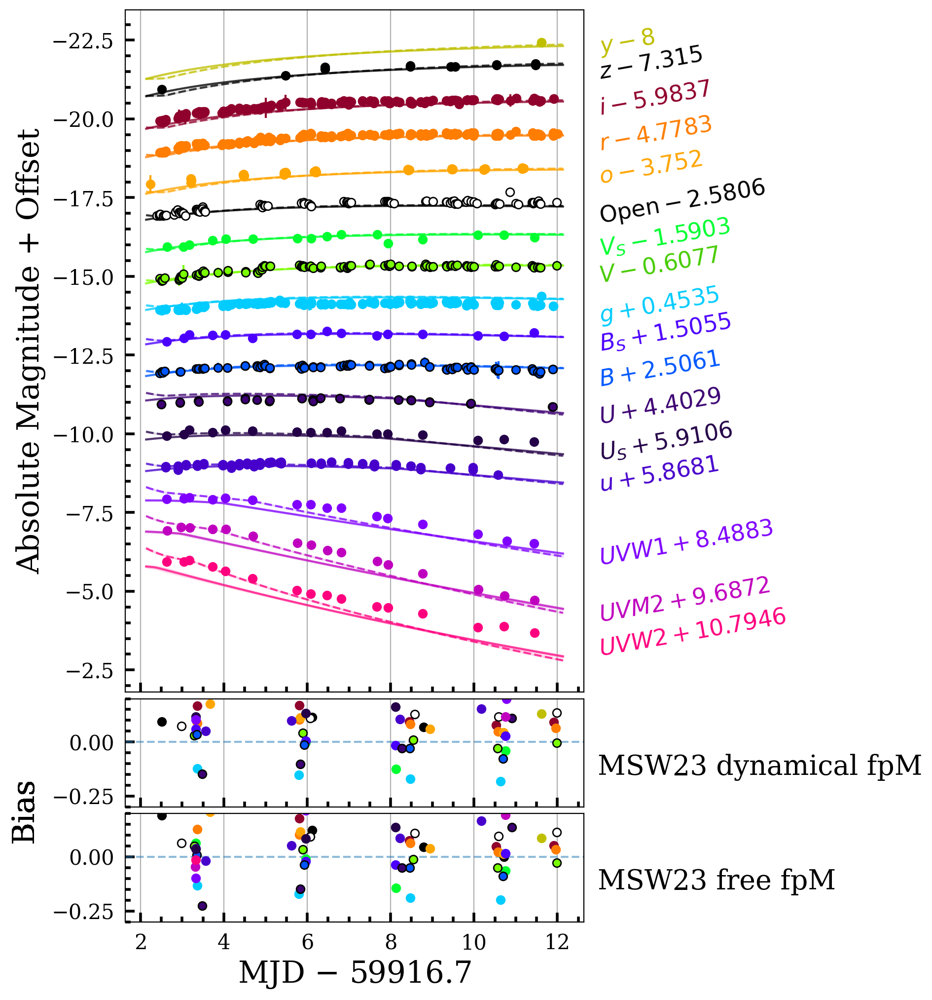

In [39]:
import matplotlib.patheffects as pe

ufilts = np.unique(lc_early['filter'])
ycol = 'absmag'
dycol = 'dmag'

reset_plot_style()

# plt_style()
# Create a figure with size 8x16
fig = plt.figure(figsize=(6, 12), dpi=200)


nrows=8
gs = fig.add_gridspec(nrows=nrows, ncols=1, hspace=.06)


main_ax = fig.add_subplot(gs[:-2])
sc4_bias_ax = fig.add_subplot(gs[-2:-1], sharex=main_ax)
sc3_bias_ax = fig.add_subplot(gs[-1:], sharex=main_ax)

main_ax.tick_params('x', labelbottom=False)
main_ax.invert_yaxis()
# bias_ax.tick_params('x', labelbottom=False)

# main_ax.tick_params(axis='x', length=2, width=1)
#mcmcbias_ax.tick_params(axis='x', length=2, width=1)

# main_ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
main_ax.grid(True, axis='x')
sc4_bias_ax.grid(True, axis='x')
sc3_bias_ax.grid(True, axis='x')
#mcmcbias_ax.grid(True, axis='x')
#bayebias_ax.grid(True, axis='x')


x_position_xlabel = .28
y_position_xlabel = .057
# x_label.set_position((0.5, -0.1))  # Move the x-label down by 0.1 of the axes height
# y_label.set_position((x_position_ylabe, 0.5))
mjd_offset = round(np.squeeze(median_sc4_flatchain)[-1], 1)#59916.9

xlabel = 'MJD $-$ {:f}'.format(mjd_offset).rstrip('0').rstrip('.')
# fig.text(x_position_xlabel, y_position_xlabel ,
#          xlabel,
#          va='center', rotation=180,
#          fontsize=plt.rcParams['axes.labelsize'])


#np.mean([to_plots_baye_flat_chain.mean(axis=0)[-1], to_plots_baye_flat_chain.mean(axis=0)[-1]])#lc['MJD'].min()
sc3_bias_ax.set_xlabel('MJD $-$ {:.2f}'.format(mjd_offset).rstrip('0').rstrip('.'))  # Move the x-label down by 0.1 of the axes height
main_ax.set_ylabel(ylabel,)#.set_position((x_position_ylabel, 0.5))

# bias_ax.set_ylim(-0.2, 0.07)
#bayebias_ax.set_ylim(-0.2, 0.07)
sc4_bias_ax.axhline(0, ls='--', alpha=.5)
sc3_bias_ax.axhline(0, ls='--', alpha=.5)

sc4_bias_ax.set_ylim(-0.3, 0.2)
sc3_bias_ax.set_ylim(-0.3, 0.2)

sc4_bias_ax.annotate('MSW23 dynamical fpM', xy=(1.03,.3), xycoords='axes fraction')
sc3_bias_ax.annotate('MSW23 free fpM', xy=(1.03,.3), xycoords='axes fraction')

#bayebias_ax.axhline(0, ls='--', alpha=.5)

#mcmcbias_ax.annotate('MSW23', xy=(.8,.1), xycoords='axes fraction')
#bayebias_ax.annotate('LSTM-BNN', xy=(.8,.1), xycoords='axes fraction')


filter_spacing = 1
offset_0 = -len(ufilts) // 2 * filter_spacing
offset = offset_0
# for filt, f_yfit_median, std_filt_mcmc in zip(ufilts,
#                                                    median_yfit, 
#                                  
#                   std_yfit):

prev_filt = ufilts[-1]
for n in range(len(ufilts))[::-1]:   

    filt = ufilts[n]
    sc4_f_yfit_median = median_yfit_sc4[n]
    sc4_std_filt_mcmc = std_yfit_sc4[n]
    sc3_f_yfit_median = median_yfit_sc3[n]
    sc3_std_filt_mcmc = std_yfit_sc3[n]
    
    sc4_interp_filt = interp1d(xfit, sc4_f_yfit_median, kind='linear')
    sc3_interp_filt = interp1d(xfit, sc3_f_yfit_median, kind='linear')
    # baye_interp_filt = interp1d(xfit, f_yfit_baye_median, kind='linear')

    alpha=.75
    alpha_fill=.1
    validity_time_sc4 = 59928.92
    validity_time_sc3 = 59928.92#59935.27
    max_mjd = np.max([validity_time_sc4, validity_time_sc3])
    lc_filt = lc_early.where(filter=filt, MJD_max=max_mjd )
    lc_filt.sort("MJD")
    if len(lc_filt)==0:
        continue
    first_point = lc_filt[ycol][0]
    if filt.name == "z":
        first_point = lc_filt[ycol][0]-.5
    

    offset += filter_spacing + (lc_early.where(filter=prev_filt)[ycol][0]-first_point)
    # print()/
    prev_filt = filt
    # offset_0 = offset

    if len(lc_filt)==0:
        continue
    


    xfit_cut_sc4 = xfit < validity_time_sc4
    xfit_cut_sc3 = xfit < validity_time_sc3

    main_ax.errorbar(lc_filt['MJD'] - mjd_offset, lc_filt[ycol] / yscale + offset, lc_filt[dycol] / yscale,
                ls='none', marker='o', **filt.plotstyle)

    main_ax.plot((xfit - mjd_offset)[xfit_cut_sc4], sc4_f_yfit_median[xfit_cut_sc4] / yscale + offset, color=filt.linecolor, alpha=alpha)
    main_ax.fill_between((xfit - mjd_offset)[xfit_cut_sc4], (sc4_f_yfit_median-sc4_std_filt_mcmc)[xfit_cut_sc4] / yscale + offset,
                 (sc4_f_yfit_median+sc4_std_filt_mcmc)[xfit_cut_sc4] / yscale + offset,
                 color=filt.linecolor, alpha=alpha_fill)
    
    main_ax.plot((xfit - mjd_offset)[xfit_cut_sc3], sc3_f_yfit_median[xfit_cut_sc3] / yscale + offset, color=filt.linecolor, alpha=alpha, ls='--')
    main_ax.fill_between((xfit - mjd_offset)[xfit_cut_sc3], (sc3_f_yfit_median-sc3_std_filt_mcmc)[xfit_cut_sc3] / yscale + offset,
                 (sc3_f_yfit_median+sc3_std_filt_mcmc)[xfit_cut_sc3] / yscale + offset,
                 color=filt.linecolor, alpha=alpha_fill)

    
    # main_ax.plot(xfit - mjd_offset, f_yfit_baye_median / yscale + offset, color=filt.linecolor, alpha=alpha, ls='--')
    # main_ax.fill_between(xfit - mjd_offset, (f_yfit_baye_median-std_filt_baye) / yscale + offset,
    #                      (f_yfit_baye_median+std_filt_baye) / yscale + offset,
    #                      color=filt.linecolor, alpha=alpha_fill,
    #                      path_effects=[pe.PathPatchEffect(offset=(0, 0),
    #                                                                    hatch='xxx',
    #                                                                    facecolor=filt.plotstyle['color'],
    #                                                                    edgecolor=filt.plotstyle['color'],
    #                                                                    alpha=.15)])


    
    residual_sc4 = sc4_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    residual_sc3 = sc3_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # residual_baye = baye_interp_filt(lc_filt['MJD']) - lc_filt[ycol]
    # print(len(residual_mcmc), len(lc_filt['MJD']))
    # print(len())


    reduced_reldiff_x_sc4, reduced_reldiff_y_sc4= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual_sc4/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)

    reduced_reldiff_x_sc3, reduced_reldiff_y_sc3= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual_sc3/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)
    

    reduced_xfit_cut_sc4 = reduced_reldiff_x_sc4 < validity_time_sc4 - mjd_offset
    reduced_xfit_cut_sc3 = reduced_reldiff_x_sc3 < validity_time_sc3 - mjd_offset
    
    # reduced_reldiff_x_baye, reduced_reldiff_y_baye= binnarize(lc_filt['MJD'] - mjd_offset,
                                                            # residual_baye/yscale,
                                                            # nbins=7,
                                                           # bins_ref=lc_early['MJD']-mjd_offset)
    plotstyle = copy.copy(filt.plotstyle)
    # plotstyle['mfc'] = 'none'
    sc4_bias_ax.plot(reduced_reldiff_x_sc4[reduced_xfit_cut_sc4], reduced_reldiff_y_sc4[reduced_xfit_cut_sc4],
                      ls='',marker='o', **plotstyle)
    # for other_ax in sc4_bias_ax.get_shared_x_axes().get_siblings(sc4_bias_ax):
    #     if other_ax is not sc4_bias_ax:
    #         sc4_bias_ax.get_shared_x_axes().remove(sc4_bias_ax, other_ax)
    # sc4_bias_ax.set_xticklabels([])
    for label in sc4_bias_ax.get_xticklabels():
        label.set_visible(False)
    sc3_bias_ax.plot(reduced_reldiff_x_sc3[reduced_xfit_cut_sc3], reduced_reldiff_y_sc3[reduced_xfit_cut_sc3],
                      ls='',marker='o', **plotstyle)

    #bayebias_ax.plot(reduced_reldiff_x_baye, reduced_reldiff_y_baye,
                      # ls='',marker='o', **plotstyle)
    
    filtname = [key for key, value in filters.filtdict.items() if value == filt]

    # print(filtname)
    # print(filtname)
    i=0
    while ('SPLUS' in filtname[i].upper()) or ('SWOPE' in filtname[i].upper()) \
    or ('PAN' in filtname[i].upper()) or ('DLT' in filtname[i].upper()):
        i+=1
    
    
    txt = f'${filtname[i]}{offset:+g}$' if filt.italics else rf'$\mathrm{{{filtname[i]}}}{offset:+g}$'
    main_ax.text(1.03, lc_filt[ycol][-1] / yscale + offset, txt, color=filt.textcolor, fontdict={'size': 'small'},
            ha='left', va='center', transform=main_ax.get_yaxis_transform(), rotation=10)
    

    y0_ax1 = sc4_bias_ax.get_position().y0
    y1_ax1 = sc4_bias_ax.get_position().y1
    y0_ax2 = sc3_bias_ax.get_position().y0
    y1_ax2 = sc3_bias_ax.get_position().y1
    mid_y = (y0_ax2 + y1_ax1) / 2

    # Optional: compute average x-position (left) to place the label closer to the y-axis
    x_pos =  -0.07# tweak this to align as needed

    # Add shared y-axis label
    fig.text(
        x_pos, mid_y, 'Bias',
        va='center', rotation='vertical', fontsize=main_ax.yaxis.label.get_size()
    )
    plt.rcParams.update({
    # ... existing parameters ...

    'xtick.labelsize': 15,  # Font size of x-axis tick numbers
    'ytick.labelsize': 15,  # Font size of y-axis tick numbers
    # 'xtick.major.visible': False,
})
# plt.xticks(rotation=90)
# plt.yticks(rotation=90)

# main_ax.set_ytick( rotation=45, ha='right')
# plt.savefig("outputs/images/paper2025/two_models_fit.pdf", bbox_inches="tight")

In [51]:
np.log10(610)

2.785329835010767

In [109]:
p_sc4 - p_sc3

array([ 0.32505044,  0.26862574, -3.98592011, -3.92681408,  0.52734375])

In [111]:
p_sc3 = np.median(squeezed_sc3_flatchain, axis=0) + np.array([0,0,0,5,0])
p_sc4 = np.median(squeezed_sc4_flatchain, axis=0)+ np.array([0,0,0,5,0])

t = np.array([59919])
f = [lc["filter"][0]]
model_sc4(t, f, *p_sc3)

array([1.06513209e+20])

In [ ]:
original_sc3 = 

## comparing trhee models


In [145]:
# in case of a specific filter selection
filters_to_plot =[str(f) for f in np.unique(lc['filter'])]#['U', 'u_s', 'U_S','UVW1', 'UVW2', 'UVM2']#'UVW1', 'UVM1', 'UVW2', 'UVM2']

fmask=np.full(len(lc_early), False)

for i, filt in enumerate(filters_to_plot):
    
    # print(np.array(lc_early['filter']).astype('str'))
    fmask += (np.array(lc_early['filter']).astype('str') == filt)
    
lc_masked = lc_early[fmask]

In [10]:
ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1, -1)

# Load different flatchains
flatchains = {
    "balanced": np.load("outputs/sc4_inner_prob_flatchain_32w_balanced.npy"),
    "undersampled": np.load("outputs/sc4_inner_prob_flatchain_32w_undersampled.npy"),
    "observed": np.load("outputs/sc4_inner_prob_flatchain_32w_observed.npy"),  # Corrected filename
}

# Define models
# model_sc3 = model_sc4  # Ensure correct model assignment
model_sc4 = models.ShockCooling4(lc)

# Initialize storage for results
squeezed_flatchains = {}
median_flatchains = {}
median_yfits = {}
yfit_samples = {}
std_yfits = {}

# Process each flatchain
for key, flatchain in flatchains.items():
    # Extract dimensions
    nsteps = flatchain.shape[1]
    nwalkers = flatchain.shape[0]
    nparams = flatchain.shape[2]

    # Reshape and remove last parameter
    squeezed_flatchains[key] = flatchain.reshape(nwalkers * nsteps, nparams)[:, :-1]

    # Compute median values
    median_flatchains[key] = np.median(squeezed_flatchains[key], axis=0).reshape(1, -1)

    # Fit median model
    median_yfits[key], yscale, ylabel, xfit = get_fits(
        model=model_sc4,
        flatchain=median_flatchains[key][:, :5],
        lc=lc_masked,
        num_models_to_plot=1,
        ycol=model_sc4.output_quantity,
        xfit=None if key == "balanced" else xfit,
        yscale=None if key == "balanced" else yscale,
    )

# Number of models for sample fitting
num_models_to_plot = 100

# Fit all sample models
for key, flatchain in squeezed_flatchains.items():
    yfit_samples[key], _, _, _ = get_fits(
        model=model_sc4,
        flatchain=flatchain[:, :5],
        lc=lc_masked,
        num_models_to_plot=num_models_to_plot,
        ycol=model_sc4.output_quantity,
        xfit=xfit,
        yscale=yscale,
    )

# Compute standard deviation for each fitted model
for key in flatchains.keys():
    std_yfits[key] = np.zeros((median_yfits[key].shape)).astype("float64")

    for i_filt in range(len(median_yfits[key])):
        std_yfits[key][i_filt] = np.std(yfit_samples[key][i_filt], axis=1)

NameError: name 'get_fits' is not defined

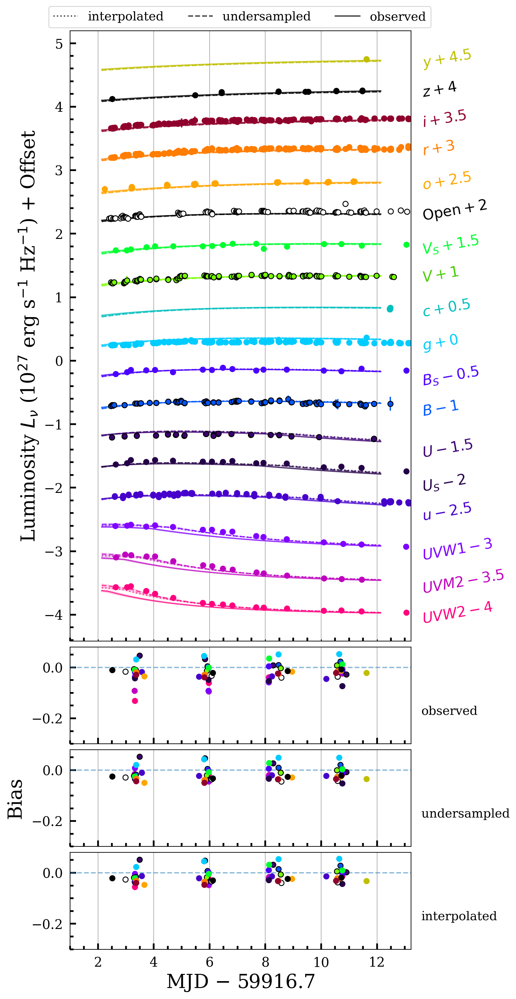

In [184]:
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
import numpy as np
import copy

reset_plot_style()
plt.rcParams.update({
# ... existing parameters ...

'xtick.labelsize': 15,  # Font size of x-axis tick numbers
'ytick.labelsize': 15,  # Font size of y-axis tick numbers
# 'xtick.major.visible': False,
})
ufilts = np.unique(lc_early['filter'])
ycol = 'lum'
dycol = 'dlum'

# plt.rcdefaults()
# plt.rcParams.update({
#     'lines.linewidth': 1.0,
#     'lines.linestyle': '-',
#     'lines.color': 'black',
#     'font.family': 'serif',
#     'font.weight': 'normal',
#     'text.color': 'black',
#     'axes.edgecolor': 'black',
#     'axes.linewidth': 1.0,
#     'axes.grid': False,
#     'axes.titlesize': 16,
#     'axes.labelsize': 16,
#     'axes.labelweight': 'normal',
#     'axes.labelcolor': 'black',
#     'axes.formatter.limits': [-4, 4],
#     'xtick.major.size': 7,
#     'xtick.minor.size': 4,
#     'xtick.labelsize': 16,
#     'ytick.major.size': 7,
#     'ytick.minor.size': 4,
#     'ytick.labelsize': 16,
#     'legend.numpoints': 1,
#     'legend.shadow': False,
#     'legend.frameon': False
# })


# Create figure with subplots for different flatchains
fig= plt.figure(figsize=(int(6*1.33), int(15*1.33)), dpi=200)

nrows=9
gs = fig.add_gridspec(nrows=nrows, ncols=1, hspace=.06)

main_ax = fig.add_subplot(gs[:-3])
validity_time_sc4 = 59928.92

delta_axes = {"observed":fig.add_subplot(gs[-3:-2], sharex=main_ax), 
              "undersampled":fig.add_subplot(gs[-2:-1], sharex=main_ax),
              "balanced":fig.add_subplot(gs[-1:], sharex=main_ax)}

mjd_offset = round(median_flatchains["observed"][0][-1], 1)

main_ax.tick_params('x', labelbottom=False)
main_ax.tick_params(axis='x', length=2, width=1)

main_ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=10))
main_ax.grid(True, axis='x')
for key, ax in delta_axes.items():

    ax.grid(True, axis='x')
    ax.axhline(0, ls='--', alpha=.5)
    ax.set_ylim(-0.3, 0.08)
# sc4_bias_ax.grid(True, axis='x')
# sc3_bias_ax.grid(True, axis='x')


xlabel = 'MJD $-$ {:.2f}'.format(mjd_offset).rstrip('0').rstrip('.')
delta_axes["balanced"].set_xlabel(xlabel)
main_ax.set_ylabel(ylabel)

# Titles for each bias axis
delta_axes["observed"].annotate('observed', xy=(1.03, .3), xycoords='axes fraction', fontsize=14)
delta_axes["undersampled"].annotate('undersampled', xy=(1.03, .3), xycoords='axes fraction', fontsize=14)
delta_axes["balanced"].annotate('interpolated', xy=(1.03, .3), xycoords='axes fraction', fontsize=14)


filter_spacing = .5
offset = -len(ufilts) // 2 * filter_spacing

#    std_yfit):
for n in range(len(ufilts)):   

    filt = ufilts[n]

    alpha=.75
    alpha_fill=.1
    offset += filter_spacing
    lc_filt = lc_early.where(filter=filt)
    if len(lc_filt)==0:
        continue
        
    main_ax.errorbar(lc_filt['MJD'] - mjd_offset, lc_filt[ycol] / yscale + offset, lc_filt[dycol] / yscale,
                ls='none', marker='o', **filt.plotstyle)
    
    plotstyle = copy.copy(filt.plotstyle)
    filtname = [key for key, value in filters.filtdict.items() if value == filt]
    i=0
    while ('SPLUS' in filtname[i].upper()) or ('SWOPE' in filtname[i].upper()) \
    or ('PAN' in filtname[i].upper()) or ('DLT' in filtname[i].upper()):
        i+=1

    txt = f'${filtname[i]}{offset:+g}$' if filt.italics else rf'$\mathrm{{{filtname[i]}}}{offset:+g}$'
    main_ax.text(1.03, lc_filt[ycol][-1] / yscale + offset, txt, color=filt.textcolor, fontdict={'size': 'small'},
            ha='left', va='center', transform=main_ax.get_yaxis_transform(), rotation=10)
    ls_styles = {"observed": "-",
                 "undersampled": "--",
                 "balanced": ":" }


    for key in flatchains:
        
        y_fit_median_f = median_yfits[key][n]
        std_f = std_yfits[key][n]
        interp = interp1d(xfit, y_fit_median_f, kind='linear')

        fit_cut_sc4 = xfit < validity_time_sc4
        main_ax.plot((xfit - mjd_offset)[fit_cut_sc4], y_fit_median_f[fit_cut_sc4] / yscale + offset, color=filt.linecolor, alpha=alpha, ls=ls_styles[key], label=key)
        main_ax.fill_between((xfit - mjd_offset)[fit_cut_sc4], (y_fit_median_f-std_f)[fit_cut_sc4] / yscale + offset,
                    (y_fit_median_f+std_f)[fit_cut_sc4] / yscale + offset,
                    color=filt.linecolor, alpha=alpha_fill)
        
        residual = interp(lc_filt['MJD']) - lc_filt[ycol]
        reduced_reldiff_x, reduced_reldiff_y = binnarize(lc_filt['MJD'] - mjd_offset,
                                                            residual/yscale,
                                                            nbins=7,
                                                           bins_ref=lc_early['MJD']-mjd_offset)
        reduced_xfit_cut_sc4 = reduced_reldiff_x < validity_time_sc4 - mjd_offset
        
        delta_axes[key].plot(reduced_reldiff_x[reduced_xfit_cut_sc4], reduced_reldiff_y[reduced_xfit_cut_sc4],
                      ls='',marker='o', **plotstyle)
mid_y = 0
for key in delta_axes:
    ax = delta_axes[key]
    mid_y+= (ax.get_position().y0 + ax.get_position().y1)/2/len(delta_axes)
# y0_ax1 = sc4_bias_ax.get_position().y0
# y1_ax1 = sc4_bias_ax.get_position().y1
# y0_ax2 = sc3_bias_ax.get_position().y0
# y1_ax2 = sc3_bias_ax.get_position().y1
# mid_y = (y0_ax2 + y1_ax1) / 2
x_pos =  -0.02# tweak this to align as needed
fig.text(
    x_pos, mid_y, 'Bias',
    va='center', rotation='vertical', fontsize=main_ax.yaxis.label.get_size()
)
handles, labels = main_ax.get_legend_handles_labels()
handles = [copy.copy(h) for h in handles[:3]]
labels = [h.replace("balanced", "interpolated") for h in labels[:3]]
for h in handles:
    h.set_color("k")
mid_x = (ax.get_position().x0 + ax.get_position().x1)*1.05#/len(delta_axes)
main_ax.legend(handles, labels, bbox_to_anchor=(mid_x, 1.05), ncols=3, fontsize=14)
# plt.savefig("outputs/images/three_approachs_fit.png", bbox_inches="tight")

main_ax.set_xlim(1,validity_time_sc4-mjd_offset+1)
plt.savefig("outputs/images/paper2025/three_approachs_fit.pdf", bbox_inches="tight")

## $\chi^2$ comparison

In [185]:
def chi_square_with_errors(observed, expected, errors):
    """
    Calculate the Chi-square statistic, accounting for errors.
    
    Parameters:
    observed (array-like): Observed data.
    expected (array-like): Expected (fit) data.
    errors (array-like): Errors or uncertainties associated with the observed data.
    
    Returns:
    float: Chi-square value.
    """
    # Convert inputs to numpy arrays
    observed = np.array(observed)
    expected = np.array(expected)
    errors = np.array(errors)
    
    # Check if the lengths match
    if len(observed) != len(expected) or len(observed) != len(errors):
        raise ValueError("Observed, expected, and errors must have the same length.")
    
    # Calculate the chi-square statistic with errors
    chi2 = np.sum((observed - expected) ** 2 / errors ** 2)#/len(observed)
    
    return chi2

### Versus Filters

In [224]:
chi2_dic = {"observed":[],
            "undersampled":[],
            "balanced":[] }

# chi2_list_mcmc_sc4 = []
# chi2_list_mcmc_sc3 = []
# validity_time_sc4
lc_validity = lc_masked.where(MJD_max=validity_time_sc4)
ufilts = np.unique(lc_validity['filter'])
filt_name_list = []
count_points = 0
for i, filt in enumerate(ufilts):

    lc_filt = lc_validity.where(filter=filt)
    obs_lum= lc_filt['lum']
    obs_err = lc_filt['dlum']
    count_points+=len(lc_filt)
    
    for key in flatchains:
        y_fit_median_f = median_yfits[key][i]
        interp = interp1d(xfit, y_fit_median_f, kind='linear')
        fit = interp(lc_filt['MJD'])
        chi2 = chi_square_with_errors(observed=obs_lum, expected=fit, errors=fit)
        chi2_dic[key].append(chi2)
        
    # fit_sc4 = interp_sc4(lc_filt['MJD'])
    # fit_sc3 = interp_sc3(lc_filt['MJD'])

    # chi2_list_mcmc_sc4.append(chi2_sc4)
    # chi2_list_mcmc_sc3.append(chi2_sc3)
    
    filtname = [key_ for key_, value in filters.filtdict.items() if value == filt]

    k=0
    while ('SPLUS' in filtname[k].upper()) or ('SWOPE' in filtname[k].upper()) \
    or ('PAN' in filtname[k].upper()) or ('DLT' in filtname[k].upper()):
        k+=1
    filt_name_list.append(filtname[k])
    
for key in chi2_dic:
    print(key, np.sum(chi2_dic[key]))

print(count_points, len(lc_validity))

observed 21.849852757779722
undersampled 18.563793605076548
balanced 17.169782837857234
1009 1009


/tmp/ipykernel_940/2168373694.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(filt_name_list, rotation=45, ha='right')


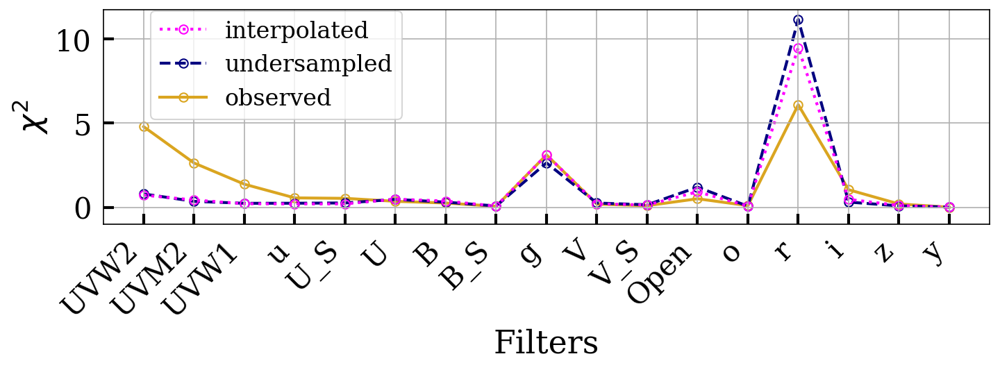

In [225]:
reset_plot_style()

plt.rcParams.update({
 'xtick.minor.visible': False,
 'ytick.minor.visible': False,})
color_list = ["magenta", "navy", "goldenrod"]
fig, ax = plt.subplots(figsize=(10,4), dpi=150)
ax.set_xlabel('Filters')
ax.set_ylabel('$\chi^2$')
i=0
for key in flatchains:
    ax.plot(filt_name_list, chi2_dic[key], ls=ls_styles[key], marker='o',
             mfc='none', label=key.replace("balanced", "interpolated"),
             lw=2, c=color_list[i], zorder=-i)
    i+=1
# ax.plot(filt_name_list, chi2_list_mcmc_sc4, ls='-', marker='o', mfc='none', label='MSW23')
# ax.plot(filt_name_list, chi2_list_mcmc_sc3, ls='-', marker='o', mfc='none', label='SW17')
ax.set_xticklabels(filt_name_list, rotation=45, ha='right')
# ax.set_yticklabels(minor=False)
ax.set_ylim(-1, ax.get_ylim()[1])
plt.legend(bbox_to_anchor=(.35,1.05))
ax.grid()

plt.tight_layout()

plt.savefig("outputs/images/paper2025/chi2perfilter.pdf")

### Versus time

In [ ]:
len(lc_masked.where(MJD_min=xfit.min(), MJD_max=xfit[(t+1)*step_size].max()))

1009

In [222]:
chi2_dic_time = {"observed":[],
            "undersampled":[],
            "balanced":[] }

ufilts = np.unique(lc_validity['filter'])
# filt_name_list = []
count_points = 0
n_stamp = 10
time_axis = []
for t in range(n_stamp):

    zero_point_time = min(xfit)
    # print(zero_point_time+t*step_size)
    # aaa
    # time_points = len(xfit)
    step_size = (xfit.max()-xfit.min())/n_stamp
    stamp_chi2 = 0
    # xfit_step = xfit[t*step_size:(t+1)*step_size]#np.in1d(xfit,xfit[t*step_size:(t+1)*step_size])
    # if t==n_stamp-1:
    #     xfit_step = xfit[t*step_size:]
    lc_dic_time = []
    filt_dic_time = {"observed":[],
                "undersampled":[],
                "balanced":[] }
    for i, filt in enumerate(ufilts):
        lc_filt = lc_validity.where(filter=filt, MJD_min=zero_point_time+t*step_size, MJD_max=zero_point_time+(t+1)*step_size)
        obs_lum= lc_filt['lum']
        obs_err = lc_filt['dlum']
        filt_aux_list = []
        # print(len(obs_lum)==0)
        # print(lc_filt["MJD"].max())
        count_points+=len(lc_filt)
        if len(obs_lum)==0:
            # print(obs_lum)
            # print("\n\nAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaaAaa")
            continue
        for key in flatchains:

            y_fit_median_f = median_yfits[key][i]
            interp = interp1d(xfit, y_fit_median_f, kind='linear')
            fit = interp(lc_filt['MJD'])
            filt_dic_time[key].append(fit)
            # print(type(fit))
        # print(obs_lum)
        lc_dic_time.append(obs_lum)
        # print("lfilmin",lc_filt["MJD"].min())
        # print(len(obs_lum))
            # filt_aux_list.append(fit)
    # print(lc_dic_time))
    # aaa
    if len(lc_dic_time)==0:
        continue
    obs_lum_concat = np.concatenate(lc_dic_time)
    for key in flatchains:
        fit_concat = np.concatenate(filt_dic_time[key])
        chi2 = chi_square_with_errors(observed=obs_lum_concat, expected=fit_concat, errors=fit_concat)
        chi2_dic_time[key].append(chi2)

    time_axis.append(np.mean([zero_point_time+t*step_size, zero_point_time+(t+1)*step_size]))
    # chi2_list_mcmc_sc4.append(sc4_stamp_chi2)
    # chi2_list_mcmc_sc3.append(sc3_stamp_chi2)
for key in chi2_dic_time:
    print(key, np.sum(chi2_dic_time[key]))

print(count_points, len(lc_validity))

observed 21.849852757779715
undersampled 18.563793605076548
balanced 17.169782837857237
1009 1009


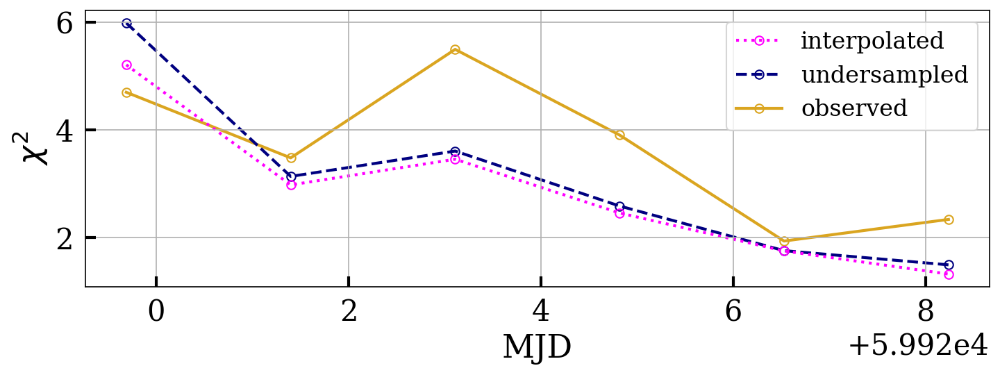

In [223]:
fig, ax = plt.subplots(figsize=(10,4), dpi=150)
ax.set_xlabel('MJD')
ax.set_ylabel('$\chi^2$')

i=0
for key in flatchains:
    ax.plot(time_axis, chi2_dic_time[key], ls=ls_styles[key], marker='o',
             mfc='none', label=key.replace("balanced", "interpolated"),
             lw=2, c=color_list[i], zorder=-i,)
    i+=1
# ax.plot(filt_name_list, chi2_list_mcmc_sc4, ls='-', marker='o', mfc='none', label='MSW23')
# ax.plot(filt_name_list, chi2_list_mcmc_sc3, ls='-', marker='o', mfc='none', label='SW17')
# ax.set_xticklabels(filt_name_list, rotation=45, ha='right')a

plt.legend()
ax.grid()

plt.tight_layout()

plt.savefig("outputs/images/paper2025/chi2pertime.pdf")

## total


In [220]:
chi2_dic_time = {"observed":[],
            "undersampled":[],
            "balanced":[] }

ufilts = np.unique(lc_validity['filter'])
# filt_name_list = []

n_stamp = 10
time_axis = []
for t in range(1):
    time_points = len(xfit)
    step_size = int(time_points/n_stamp)
    stamp_chi2 = 0
    time_mask = np.full(len(xfit), True)#np.in1d(xfit,xfit[t*step_size:(t+1)*step_size])

    lc_dic_time = []
    filt_dic_time = {"observed":[],
                "undersampled":[],
                "balanced":[] }
    for i, filt in enumerate(ufilts):
        lc_filt = lc_validity.where(filter=filt, MJD_min=xfit[time_mask].min(), MJD_max=xfit[time_mask].max())
        obs_lum= lc_filt['lum']
        obs_err = lc_filt['dlum']
        filt_aux_list = []

        if len(obs_lum)==0:
            print(filt)
            continue
        for key in flatchains:

            y_fit_median_f = median_yfits[key][i]
            interp = interp1d(xfit, y_fit_median_f, kind='linear')
            fit = interp(lc_filt['MJD'])
            filt_dic_time[key].append(fit)
            # print(type(fit))
        
        lc_dic_time.append(obs_lum)
        # print(len(obs_lum))
            # filt_aux_list.append(fit)
    # print(lc_dic_time))
    # aaa

    obs_lum_concat = np.concatenate(lc_dic_time)
    for key in flatchains:
        fit_concat = np.concatenate(filt_dic_time[key])
        chi2 = chi_square_with_errors(observed=obs_lum_concat, expected=fit_concat, errors=fit_concat)
        chi2_dic_time[key].append(chi2)

    time_axis.append(np.mean(xfit[t*step_size:(t+1)*step_size]))

print(chi2_dic_time)

{'observed': [21.849852757779715], 'undersampled': [18.563793605076548], 'balanced': [17.169782837857234]}


# Corner Plots

In [11]:
import sys
sys.path.insert(0, '../')
from lightcurve_fitting import lightcurve, models, fitting, bolometric
from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import copy
import importlib
%matplotlib inline

In [12]:
# result_dir = '/tf/ProjectGabriel/STEP/2022acko-main/results/'
# data_dir = '/tf/ProjectGabriel/STEP/2022acko-main/data/'

filename = os.path.join('data/2022acko','2022acko_total.dat')
lc = lightcurve.LC.read(filename, format='ascii')


minmjd = min(lc['MJD'])
maxmjd = max(lc['MJD'])
print(minmjd, maxmjd)
lc.meta['dm'] = 30.81
lc.meta['extinction'] = {
  'U_S': 0.125,
  'B_S':0.103,
  'V_S':0.082,
  'U': 0.131,
  'B': 0.109,
  'V': 0.083,
  'R': 0.065,
  'I': 0.045,
  'u': 0.128,
  'g': 0.100,
  'c': 0.085,
  'r': 0.069,
  'o': 0.060,
  'i': 0.051,
  'z': 0.038,
  'UVW2': 0.234,
  'UVM2': 0.211,
  'UVW1': 0.166,
  'DLT40': 0.083,
}
# Based on no Na I D detection in spectrum
lc.meta['hostext'] = {
  'U': 0.,
  'B': 0.,
  'V': 0.,
  'R': 0.,
  'I': 0.,
  'u': 0.,
  'g': 0.,
  'r': 0.,
  'i': 0.,
  'z': 0.,
  'UVW2': 0.,
  'UVM2': 0.,
  'UVW1': 0.,
  'o': 0.,
  'c': 0.,
  'U_S': 0.,
  'B_S': 0.,
  'V_S': 0.,
  'DLT40': 0.,
}
z = 0.005264
lc.meta['redshift'] = z  # redshift

T_MAX_5 = 59930.22490293351
T_MAX_3 = 59928.9187728182
 


lc_early = lc.where(MJD_min=lc['MJD'].min()-10, MJD_max=T_MAX_5)
lc_early.calcAbsMag()
lc_early.calcLum()

59918.933279 60272.372
MW extinction not applied to filter y
host extinction not applied to filter y


In [13]:
# in case of a specific filter selection
filters_to_plot =[str(f) for f in np.unique(lc['filter'])]#['U', 'u_s', 'U_S','UVW1', 'UVW2', 'UVM2']#'UVW1', 'UVM1', 'UVW2', 'UVM2']

fmask=np.full(len(lc_early), False)

for i, filt in enumerate(filters_to_plot):
    
    
    # print(np.array(lc_early['filter']).astype('str'))
    fmask += (np.array(lc_early['filter']).astype('str') == filt)
    
lc_masked = lc_early[fmask]

In [14]:
import corner
import astropy.units as u


def format_credible_interval(x, sigfigs=1, percentiles=(15.87, 50., 84.14), axis=0, varnames=None, units=None):
    """
    Use LaTeX to format an equal-tailed credible interval with a given number of significant figures in the uncertainty

    Parameters
    ----------
    x : array-like
        Data from which to calculate the credible interval
    sigfigs : int, optional
        Number of significant figures in the uncertainty. Default: 1
    percentiles : tuple, optional
        Percentiles for the (lower, center, upper) of the credible interval. Default: ``(15.87, 50., 84.14)``
        (median +/- 1σ)
    axis : int, optional
        Axis of ``x`` along which to calculate the credible intervals. Default: 0
    varnames : list, optional
        Variable names to be equated with the credible intervals. Default: no variable names
    units : list, optional
        Units to be applied to the credible intervals. Default: no units

    Returns
    -------
    paramtexts : str
        The formatted credible intervals
    """
    quantiles = np.percentile(x, percentiles, axis=axis).T
    uncertainties = np.diff(quantiles)
    smaller_unc = np.amin(uncertainties, axis=-1)
    log_unc = np.log10(smaller_unc)
    roundto = sigfigs - np.floor(log_unc).astype(int) - 1

    # catch numbers that will have more sigfigs after rounding
    smaller_unc_round = [np.round(unc, dec) for unc, dec in zip(smaller_unc, roundto)]
    log_unc_round = np.log10(smaller_unc_round)
    roundto = sigfigs - np.floor(log_unc_round).astype(int) - 1

    quantiles = np.atleast_2d(quantiles)
    uncertainties = np.atleast_2d(uncertainties)
    roundto = np.atleast_1d(roundto)
    texstrings = []
    for quant, unc, dec in zip(quantiles, uncertainties, roundto):
        center = np.round(quant[1], dec)
        lower, upper = np.round(unc, dec)
        if dec < 0:
            dec = 0
        if upper == lower:
            texstring = '{{:.{0:d}f}} \\pm {{:.{0:d}f}}'.format(dec).format(center, upper)
        else:
            texstring = '{{:.{0:d}f}}^{{{{+{{:.{0:d}f}}}}}}_{{{{-{{:.{0:d}f}}}}}}'.format(dec).format(center, upper,
                                                                                                      lower)
        texstrings.append(texstring)

    if varnames is None or units is None:
        paramtexts = texstrings
    else:
        paramtexts = []
        for var, value, unit in zip(varnames, texstrings, units):
            if isinstance(unit, u.quantity.Quantity):
                value = '({}) \\times 10^{{{:.1f}}}'.format(value, np.log10(unit.value)).replace('.0}', '}')
                unit = unit.unit
            paramtexts.append('${} = {}$ {:latex_inline}'.format(var, value, unit))

    return paramtexts


def lightcurve_corner(lc, model, sampler_flatchain,
                      style={'font.family': 'serif',
                             'mathtext.fontset'   : 'dejavuserif',
                             'xtick.minor.visible': True,
                             'ytick.minor.visible': True,
                             'image.origin'       : 'lower',
                             'hist.bins'          : 'auto'},
                      model_kwargs=None,
                      num_models_to_plot=100, lcaxis_posn=(0.7, 0.55, 0.2, 0.4),
                      filter_spacing=1., tmin=None, tmax=None, t0_offset=None, save_plot_as='', ycol=None,
                      textsize='medium', param_textsize='large', use_sigma=False, xscale='linear',
                      filters_to_model=None):
    """
    Plot the posterior distributions in a corner (pair) plot, with an inset showing the observed and model light curves.

    Parameters
    ----------
    lc : lightcurve_fitting.lightcurve.LC
        Table of broadband photometry including columns "MJD", "mag", "dmag", "filter"
    model : lightcurve_fitting.models.Model
        The model that was fit to the light curve.
    sampler_flatchain : array-like
        2D array containing the aggregated MCMC chain histories
    -------
    fig : matplotlib.pyplot.Figure
        Figure object containing the plot
    corner_ax : array-like
        Array of matplotlib.pyplot.Axes objects corresponding to the corner plot
    ax : matplotlib.pyplot.Axes
        Axes object for the light curve inset
    """
    if ycol is None:
        ycol = model.output_quantity
    plt.style.use(style)
    if use_sigma and model.input_names[-1] != '\\sigma':
        model.input_names.append('\\sigma')
        model.units.append(u.dimensionless_unscaled)

    sampler_flatchain_corner = sampler_flatchain.copy()
    axis_labels_corner = model.axis_labels
    for var in ['t_0', 't_\\mathrm{max}']:
        if var in model.input_names:
            i_t0 = model.input_names.index(var)
            if t0_offset is None:
                t0_offset = np.floor(sampler_flatchain_corner[:, i_t0].min())
            if t0_offset != 0.:
                sampler_flatchain_corner[:, i_t0] -= t0_offset
                t0_offset_formatted = '{:f}'.format(t0_offset).rstrip('0').rstrip('.')
                axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'

    fig = corner.corner(sampler_flatchain_corner, labels=axis_labels_corner, label_kwargs={'size': textsize}, color='navy')
    corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain.shape[-1], sampler_flatchain.shape[-1])
    
    paramtexts = format_credible_interval(sampler_flatchain, varnames=model.input_names, units=model.units)
    
    cmap = plt.cm.get_cmap('gist_rainbow', sampler_flatchain.shape[-1])
    colors = [cmap(i) for i in range(sampler_flatchain.shape[-1])]
#     auxfig=fig
#     for i in range(1,sampler_flatchain.shape[-1])[:1]:
#         sampler_flatchain_corner[:, 0] = np.nan
#         auxfig = corner.corner(sampler_flatchain_corner, labels=axis_labels_corner, label_kwargs={'size': textsize}, color=colors[i], fig=auxfig)
#         # corner_axes[:,i] = np.array(auxfig.get_axes()).reshape(sampler_flatchain.shape[-1], sampler_flatchain.shape[-1])[:,i]
        
    
    # fig.clear()
    
    colors = ['mediumseagreen', 'royalblue', 'goldenrod', 'dimgrey', 'black']#['lightcoral', 'olive', 'mediumpurple', 'teal','burlywood']

    
#     if not (i==0 or i==4):
#             print(i)
#             a=0
#             for child in np.array(corner_axes[-1, i].get_children())[[0,1,2,3,4]]:
#                 print(child.get_alpha())
#                 # child.set_facecolor('blue')
                
#                 if a:
#                     child.set_color(colors[i])
#                     child.set_facecolor(colors[i])
                    
#                 # print(child)
#                 # child.set_edgecolor('blue')
#                 child.set_alpha(0.2)
#                 a+=1

#             a=0
#             for child in np.array(corner_axes[i, 0].get_children())[[0,1,2,3,4]]:
#                 print(child.get_alpha())
                
#                 if a:
                    
#                     child.set_facecolor(colors[i])
#                     child.set_edgecolor(colors[i])
#                 child.set_color(colors[i])
#                 child.set_alpha(0.2)
#                 a+=1
#             else:
#                 pass
    
    
    
    for i in range(sampler_flatchain.shape[-1]):
        corner_axes[i, 0].tick_params(labelsize=textsize)
        corner_axes[-1, i].tick_params(labelsize=textsize)
        
        
        # corner_axes[i, 2].tick_params(labelsize=textsize)
        # corner_axes[-2, i].tick_params(labelsize=textsize)

    k=0
    for ax in np.diag(corner_axes):
        # for child in corner_axes[i, 0].get_children()[:-6]:
        #     child.set_color(colors[i])
        ax.spines['top'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('none')
        children = np.array(ax.get_children())
        children[0].set_color(colors[k])
        children[0].set_lw(2)
        k+=1
        
    for i in range(len(corner_axes)):
        for j in range(i):
            ax = corner_axes[i, j]
            
            children = np.array(ax.get_children())
            children[0].set_color(colors[j])
            
            
            
            children[1].set_edgecolor(colors[j])
            # children[2].set_edgecolor(colors[j]) #grid
            children[3].set_edgecolor(colors[j])
            children[4].set_edgecolor(colors[j])
            children[5].set_edgecolor(colors[j])
            children[6].set_edgecolor(colors[j])
    
            
            
            
            start_color = mpl.colors.to_rgba(colors[j])
            mesh = ax.collections[1]
            
             # Create a LinearSegmentedColormap from white to the specified color
            cmap_data = {
                'red':   ((0.0, start_color[0], start_color[0]), (1.0, 1.0, 1.0)),
                'green': ((0.0, start_color[1], start_color[1]), (1.0, 1.0, 1.0)),
                'blue':  ((0.0, start_color[2], start_color[2]), (1.0, 1.0, 1.0)),
            }
            cmap = mpl.colors.LinearSegmentedColormap('WhiteToColor', cmap_data)
            mesh.set_cmap(cmap)
            

    # ax = fig.add_axes(lcaxis_posn)
    # lightcurve_model_plot(lc, model, sampler_flatchain, model_kwargs, num_models_to_plot, filter_spacing,
    #                       tmin, tmax, ycol, textsize, ax, t0_offset)#, use_sigma, xscale, filters_to_model)

    
    fig.text(0.45, 0.95, '\n'.join(paramtexts), va='top', ha='center', fontdict={'size': param_textsize})
    # if save_plot_as:
    #     fig.savefig(save_plot_as)
    #     print('saving figure as ' + save_plot_as)

    return fig, corner_axes, ax

##  TO PAPER SC4 CORNER PLOT 

aa
0
1
2
3
4


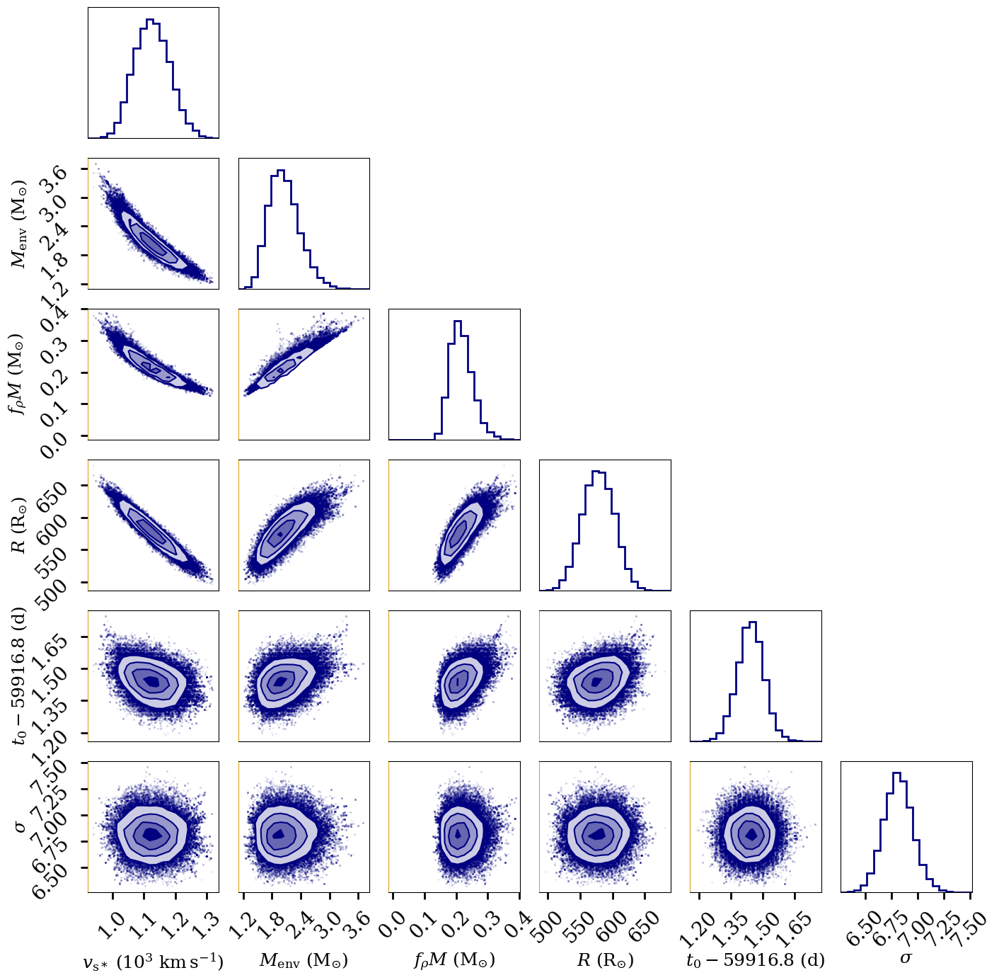

In [5]:
import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()
    

reset_plot_style()
plt.rcParams.update({'xtick.direction': 'out',
                     'ytick.direction': 'out',
                     'xtick.minor.visible': False,
                     'ytick.minor.visible': False,
                     'axes.labelsize': 18,
                     'axes.labelpad': 4,
                    #  "axes.grid":True 
                     })

ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5

use_sigma=True
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)
sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL_v2.npy')#*units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL_v2.npy')#[:,1000:,:]*units_array
model_sc3 = models.ModifiedShockCooling3(lc_masked)


# textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = np.mean([sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0), sampler_flatchain_corner_sc3[:,-1-int(use_sigma)].mean(axis=0)])#lc['MJD'].min()

# model_sc3 = models.ShockCooling4(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:.1f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc4, axis=0)
min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc4, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc4, axis=0)
max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc4, axis=0)

min_total = np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total = np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
# plt.rcdefaults()

# with plt.rc_context({'axes.labelsize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12,
#                      'lines.linewidth': 2, 'figure.figsize': [10, 10]}):
fig = corner.corner(sampler_flatchain_corner_sc4, labels=axis_labels_corner, color='navy',
                    range=bins_edges,fill_contours=True,dpi=150, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


# fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner, color='goldenrod',fill_contours=True,
#                     fig=fig, label_kwargs={"fontfamily":"serif"},
#                     hist_kwargs={"linewidth": 2})

fig.subplots_adjust(hspace=0.15, wspace=0.15)
# plt.rcParams['axes.grid'] = True 
n = sampler_flatchain_corner_sc4.shape[-1]
corner_axes =  np.array(fig.get_axes()).reshape(n, n)#np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        # ax.grid(True)
        children = np.array(ax.get_children())
        children[0].set_color('navy')
        children[11].set_color('goldenrod')
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        ax.set_xlim(bins_edges[j][0], bins_edges[j][1])
        ax.set_ylim(bins_edges[i][0], bins_edges[i][1])
        # Remove x ticks if not bottom row
        if i != n - 1:
            ax.set_xticks([])

        # Remove y ticks if not left column
        if j != 0:
            ax.set_yticks([])
    # ax.set_ylim(bins_edges[i][0], bins_edges[i][1])

# Remove x-ticks from diagonal axes
for k in range(n):
    if k==n-1:
        ax = corner_axes[k, k]
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
        # ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        continue
    ax = corner_axes[k, k]
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
    print(k)
    # if k == 0:
    #     ax.set_ylim(0,ax.get_ylim()[1]+1*ax.get_ylim()[1])
    # if k == 2:
    #     print(k, ax.get_ylim()[1])
    #     ax.set_ylim(0,ax.get_ylim()[1]+20*ax.get_ylim()[1])
    # if k == 3:
    #     ax.set_ylim(0,ax.get_ylim()[1]+25*ax.get_ylim()[1])
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle=''),
          plt.Line2D([0], [0], color='goldenrod', lw=2, marker='o', linestyle='')]
# plt.legend(handles, ['MSW23', 'SW17'], bbox_to_anchor=(-3.6, 6.3))
# plt.legend([handles[0]], [f'MSW23 - dynamical $f_{{rho}}M$'], bbox_to_anchor=(-3.6+1, 6.3))
# print(h)
# plt.savefig('outputs/images/paper2025/corner_plot_sc4only.pdf', bbox_inches='tight')

plt.show()

In [17]:
def first_significant_digit_position(num):
    num_str = str(num).lstrip('-0')  # Remove negative sign and leading zeros
    if '.' in num_str:
        
        decimal_pos = num_str.index('.')
        num_str = num_str.replace('.', '')
        first_digit_pos = next((i for i, digit in enumerate(num_str) if digit != '0'), -1)
        return first_digit_pos - decimal_pos + 1
    else:
        return next((i for i, digit in enumerate(num_str) if digit != '0'), -1)

def get_percentile(arr, p=.5):

    return np.percentile(arr, p, axis=0)
# sc3_flatchain[:, 3] = sc3_flatchain[:, 3]*ten13cm2Rsun
# sc4_flatchain[:, 3] = sc4_flatchain[:, 3]*ten13cm2Rsun
# squeezed_sc3_flatchain_physical_units

squeezed_sc3_flatchain_physical_units = squeezed_sc3_flatchain#*units_array[0,:-1]

squeezed_sc4_flatchain_physical_units = squeezed_sc4_flatchain#*units_array
# squeezed_sc4_flatchain_physical_units
medians_sc3 = get_percentile(squeezed_sc3_flatchain_physical_units, p=50)
err_sc3_upper = get_percentile(squeezed_sc3_flatchain_physical_units, p=84) - medians_sc3
err_sc3_lower = np.abs(get_percentile(squeezed_sc3_flatchain_physical_units, p=16) - medians_sc3)


medians_sc4 = get_percentile(squeezed_sc4_flatchain_physical_units, p=50)
err_sc4_upper = get_percentile(squeezed_sc4_flatchain_physical_units, p=84) - medians_sc4
err_sc4_lower = np.abs(get_percentile(squeezed_sc4_flatchain_physical_units, p=16) - medians_sc4)


for i in range(len(medians_sc4)):

    round_upper_sc4 = first_significant_digit_position(err_sc4_upper[i])
    round_lower_sc4 = first_significant_digit_position(err_sc4_lower[i])
    round_sc4 = min([round_upper_sc4,round_lower_sc4])

    round_upper_sc3 = first_significant_digit_position(err_sc3_upper[i])
    round_lower_sc3 = first_significant_digit_position(err_sc3_lower[i])
    round_sc3 = min([round_upper_sc3,round_lower_sc3])
    
    print(f'${round(medians_sc4[i], round_sc4)}^{{+{round(err_sc4_upper[i], round_sc4)}}}_{{-{round(err_sc4_lower[i], round_sc4)}}}$',
    
          f'& ${round(medians_sc3[i], round_sc3)}^{{+{round(err_sc3_upper[i], round_sc3)}}}_{{-{round(err_sc3_lower[i], round_sc3)}}}$')

$1.12^{+0.06}_{-0.06}$ & $0.7^{+0.1}_{-0.1}$
$2.0^{+0.4}_{-0.3}$ & $1.4^{+0.2}_{-0.2}$
$0.21^{+0.04}_{-0.03}$ & $10.0^{+30.0}_{-10.0}$
$580.0^{+20.0}_{-20.0}$ & $1100.0^{+200.0}_{-200.0}$
$59917.44^{+0.06}_{-0.06}$ & $59916.2^{+0.1}_{-0.1}$
$6.8^{+0.1}_{-0.1}$ & $6.4^{+0.1}_{-0.1}$


In [7]:
model_sc3



<ModifiedShockCooling3: z=0.005, n=1.5, RW=False>

In [19]:
from uncertainties import ufloat
import numpy as np


kappa = 1.
# aaaaa
# t_07eV_0 = .86
# t_tr_0 = 19.5
# a = 2.
def param_with_uncertainty(median, err_low, err_high, idx=3):
    return ufloat((median/units_array[0][idx]), ((err_low/units_array[0][idx])+ (err_high/units_array[0][idx])) / 2)

R_sc3 = param_with_uncertainty(medians_sc3[3], err_sc3_lower[3], err_sc3_upper[3], idx=3)
t_exp_sc3 = param_with_uncertainty(medians_sc3[4], err_sc3_lower[4], err_sc3_upper[4], idx=4)
t_max_sc3 = 7.4 * (R_sc3 / kappa)**0.55 + t_exp_sc3
print(f"SC3 t_max = {t_max_sc3:.2uP} days")

SC3 t_max = 59938.4±2.0 days


In [21]:
model_sc4.t_max(medians_sc4/units_array.squeeze())

59931.348281449784

In [22]:
from uncertainties import ufloat
import numpy as np

# Constants
t_07eV_0 = 6.86

t_tr_0 = 19.5
a = 2.0
kappa = 1.0  # default

# Create uncertain variables
v_s     = param_with_uncertainty(medians_sc4[0], err_sc4_lower[0], err_sc4_upper[0], idx=0)
M_env   = param_with_uncertainty(medians_sc4[1], err_sc4_lower[1], err_sc4_upper[1], idx=1)
f_rho_M = param_with_uncertainty(medians_sc4[2], err_sc4_lower[2], err_sc4_upper[2], idx=2)
R       = param_with_uncertainty(medians_sc4[3], err_sc4_lower[3], err_sc4_upper[3], idx=3)
t_exp   = param_with_uncertainty(medians_sc4[4], err_sc4_lower[4], err_sc4_upper[4], idx=4)

# Calculate t_peak
t_07eV = t_07eV_0 * R**0.56 * v_s**0.16 * kappa**-0.61 * f_rho_M**-0.06
t_tr = t_tr_0 **((kappa * M_env / v_s)**.5)


t_peak = min(t_07eV, t_tr / a) + t_exp

# Print with uncertainties
print(f"SC4 t_peak = {t_peak:.2uP} days")


SC4 t_peak = 59931.35±0.38 days


/tmp/ipykernel_86525/3074256180.py:23: FutureWarning: AffineScalarFunc.__lt__() is deprecated. It will be removed in a future release.
  t_peak = min(t_07eV, t_tr / a) + t_exp


In [20]:
t_exp + t_tr


61119.17251418598+/-707.5305813186991

## TO PAPER SC3 CORNER ONLY

0
1
2
3
4


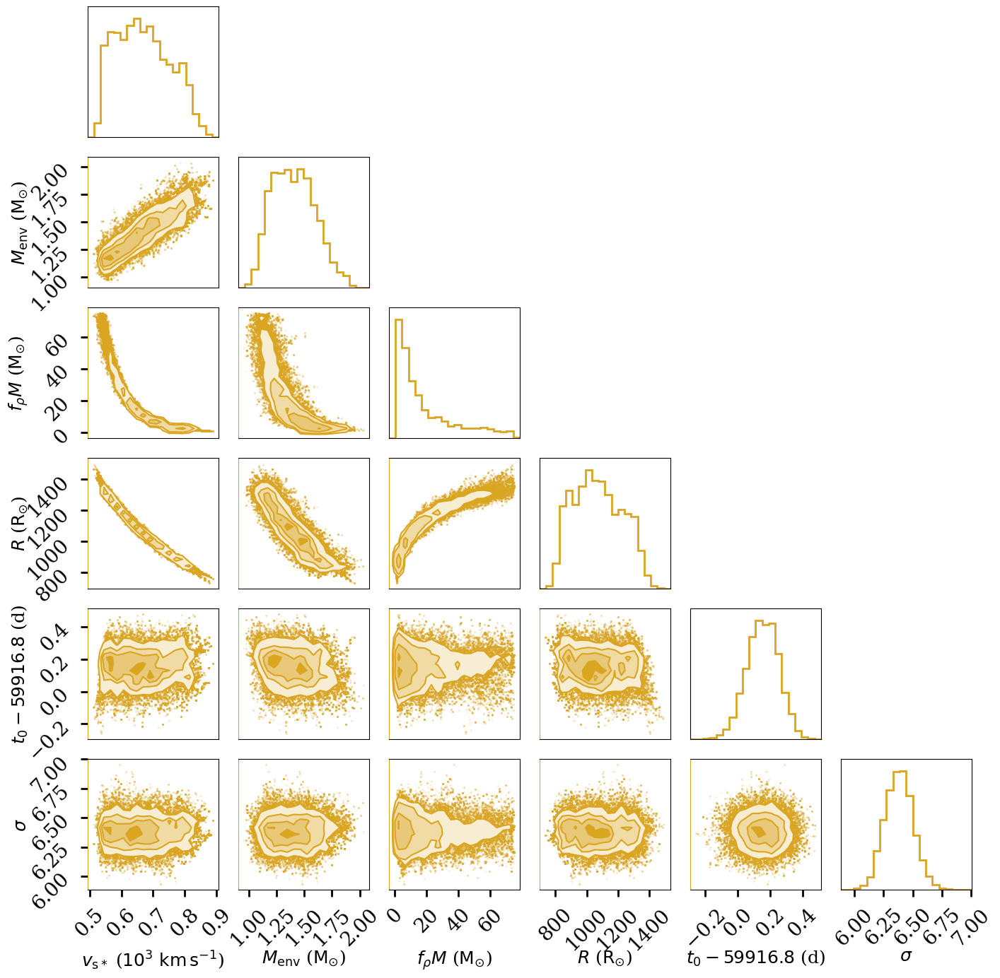

In [16]:
import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()
    

reset_plot_style()
plt.rcParams.update({'xtick.direction': 'out',
                     'ytick.direction': 'out',
                     'xtick.minor.visible': False,
                     'ytick.minor.visible': False,
                     'axes.labelsize': 18,
                     'axes.labelpad': 4,
                    #  "axes.grid":True 
                     })

ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5

use_sigma=True
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)
sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL_v2.npy')#*units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL_v2_newtmax.npy')#[:,1000:,:]*units_array
# model_sc3 = models.ShockCooling4(lc_masked)

# textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
# model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = np.mean([sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0), sampler_flatchain_corner_sc3[:,-1-int(use_sigma)].mean(axis=0)])#lc['MJD'].min()

model_sc3 = models.ShockCooling4(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:.1f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc3, axis=0)
min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc3, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc3, axis=0)
max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc3, axis=0)

min_total = np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total = np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
# plt.rcdefaults()

# with plt.rc_context({'axes.labelsize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12,
#                      'lines.linewidth': 2, 'figure.figsize': [10, 10]}):
fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner, color='goldenrod',
                    range=bins_edges,fill_contours=True,dpi=150, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


# fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner, color='goldenrod',fill_contours=True,
#                     fig=fig, label_kwargs={"fontfamily":"serif"},
#                     hist_kwargs={"linewidth": 2})

fig.subplots_adjust(hspace=0.15, wspace=0.15)
# plt.rcParams['axes.grid'] = True 
n = sampler_flatchain_corner_sc4.shape[-1]
corner_axes =  np.array(fig.get_axes()).reshape(n, n)#np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        # ax.grid(True)
        children = np.array(ax.get_children())
        children[0].set_color('goldenrod')
        children[11].set_color('goldenrod')
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        ax.set_xlim(bins_edges[j][0], bins_edges[j][1])
        ax.set_ylim(bins_edges[i][0], bins_edges[i][1])
        # Remove x ticks if not bottom row
        if i != n - 1:
            ax.set_xticks([])

        # Remove y ticks if not left column
        if j != 0:
            ax.set_yticks([])
    # ax.set_ylim(bins_edges[i][0], bins_edges[i][1])

# Remove x-ticks from diagonal axes
for k in range(n):
    if k==n-1:
        ax = corner_axes[k, k]
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
        # ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        continue
    ax = corner_axes[k, k]
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
    print(k)
    # if k == 0:
    #     ax.set_ylim(0,ax.get_ylim()[1]+1*ax.get_ylim()[1])
    # if k == 2:
    #     print(k, ax.get_ylim()[1])
    #     ax.set_ylim(0,ax.get_ylim()[1]+20*ax.get_ylim()[1])
    # if k == 3:
    #     ax.set_ylim(0,ax.get_ylim()[1]+25*ax.get_ylim()[1])
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle=''),
          plt.Line2D([0], [0], color='goldenrod', lw=2, marker='o', linestyle='')]
# plt.legend(handles, ['MSW23', 'SW17'], bbox_to_anchor=(-3.6, 6.3))
# plt.legend([handles[0]], [f'MSW23 - dynamical $f_{{rho}}M$'], bbox_to_anchor=(-3.6+1, 6.3))
# print(h)
plt.savefig('outputs/images/paper2025/corner_plot_sc3only.pdf', bbox_inches='tight')
plt.show()

In [22]:
def first_significant_digit_position(num):
    num_str = str(num).lstrip('-0')  # Remove negative sign and leading zeros
    if '.' in num_str:
        decimal_pos = num_str.index('.')
        num_str = num_str.replace('.', '')
        first_digit_pos = next((i for i, digit in enumerate(num_str) if digit != '0'), -1)
        return first_digit_pos - decimal_pos + 1
    else:
        return next((i for i, digit in enumerate(num_str) if digit != '0'), -1)

def get_percentile(arr, p=.5):

    return np.percentile(arr, p, axis=0)
# sc3_flatchain[:, 3] = sc3_flatchain[:, 3]*ten13cm2Rsun
# sc4_flatchain[:, 3] = sc4_flatchain[:, 3]*ten13cm2Rsun
# squeezed_sc3_flatchain_physical_units

squeezed_sc3_flatchain_physical_units = squeezed_sc3_flatchain#*units_array[0,:-1]

squeezed_sc4_flatchain_physical_units = squeezed_sc4_flatchain#*units_array
# squeezed_sc4_flatchain_physical_units
medians_sc3 = get_percentile(squeezed_sc3_flatchain_physical_units, p=50)
err_sc3_upper = get_percentile(squeezed_sc3_flatchain_physical_units, p=84) - medians_sc3
err_sc3_lower = np.abs(get_percentile(squeezed_sc3_flatchain_physical_units, p=16) - medians_sc3)


medians_sc4 = get_percentile(squeezed_sc4_flatchain_physical_units, p=50)
err_sc4_upper = get_percentile(squeezed_sc4_flatchain_physical_units, p=84) - medians_sc4
err_sc4_lower = np.abs(get_percentile(squeezed_sc4_flatchain_physical_units, p=16) - medians_sc4)


for i in range(len(medians_sc4)):

    round_upper_sc4 = first_significant_digit_position(err_sc4_upper[i])
    round_lower_sc4 = first_significant_digit_position(err_sc4_lower[i])
    round_sc4 = min([round_upper_sc4,round_lower_sc4])

    round_upper_sc3 = first_significant_digit_position(err_sc3_upper[i])
    round_lower_sc3 = first_significant_digit_position(err_sc3_lower[i])
    round_sc3 = min([round_upper_sc3,round_lower_sc3])
    
    print(f'${round(medians_sc4[i], round_sc4)}^{{+{round(err_sc4_upper[i], round_sc4)}}}_{{-{round(err_sc4_lower[i], round_sc4)}}}$',
          f'& ${round(medians_sc3[i], round_sc3)}^{{+{round(err_sc3_upper[i], round_sc3)}}}_{{-{round(err_sc3_lower[i], round_sc3)}}}$')
    

$1.12^{+0.06}_{-0.06}$ & $0.7^{+0.1}_{-0.1}$
$2.0^{+0.4}_{-0.3}$ & $1.3^{+0.2}_{-0.2}$
$0.21^{+0.04}_{-0.03}$ & $6.0^{+9.0}_{-5.0}$
$580.0^{+20.0}_{-20.0}$ & $1000.0^{+100.0}_{-200.0}$
$59917.44^{+0.06}_{-0.06}$ & $59916.22^{+0.1}_{-0.1}$
$6.8^{+0.1}_{-0.1}$ & $6.3^{+0.1}_{-0.1}$


## three models plot

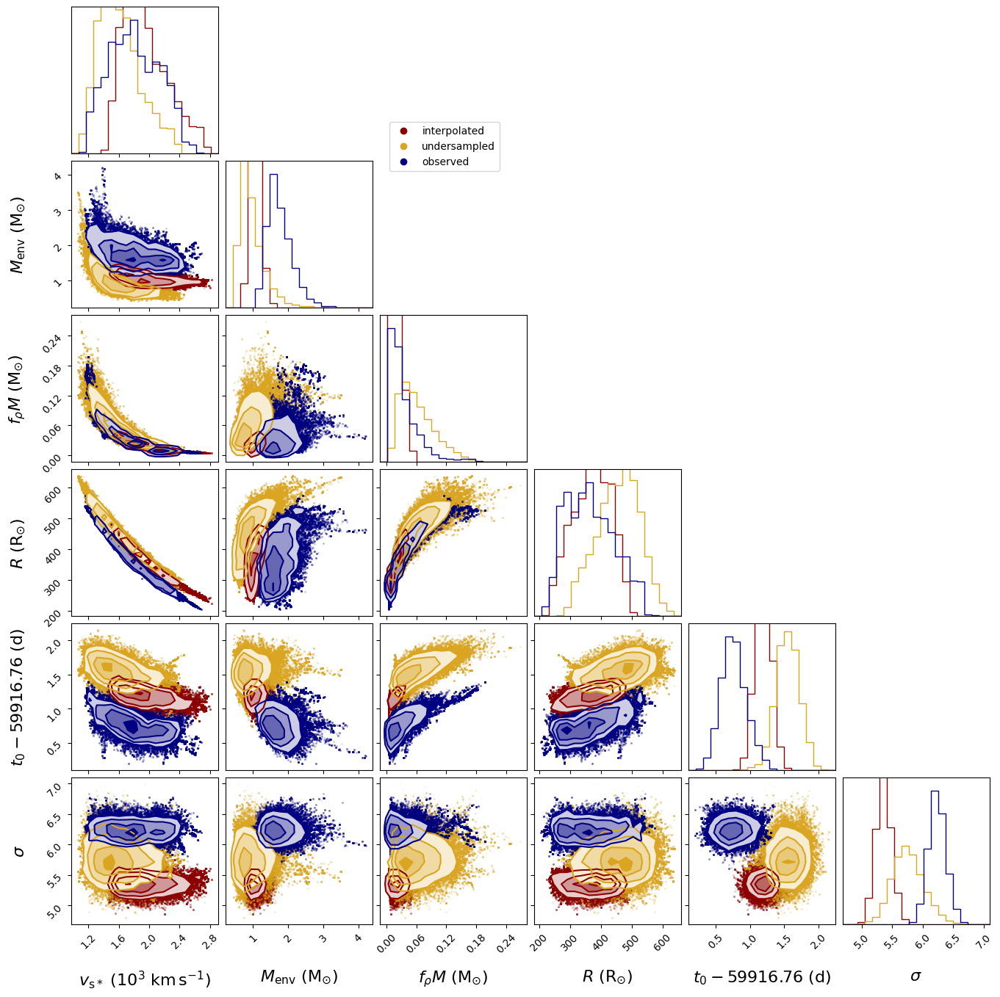

In [ ]:
ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1, -1)

# Load different flatchains
flatchains = {
    "balanced": np.load("outputs/sc4_inner_prob_flatchain_32w_balanced.npy")*units_array,
    "undersampled": np.load("outputs/sc4_inner_prob_flatchain_32w_undersampled.npy")*units_array,
    "observed": np.load("outputs/sc4_inner_prob_flatchain_32w_observed.npy")*units_array,  # Corrected filename
}

textsize=16
nsteps = flatchains["balanced"].shape[1]
nwalkers = flatchains["balanced"].shape[0]
nparams = flatchains["balanced"].shape[2]

squeezed_flatchains = {}
for key in flatchains:
    squeezed_flatchains[key] = flatchains[key].reshape(nwalkers*nsteps, nparams)
t0_offset = squeezed_flatchains[key][:,-1-int(use_sigma)].mean(axis=0)

model_shock4 = models.ShockCooling4(lc_early)
if use_sigma and model_shock4.input_names[-1] != '\\sigma':
    model_shock4.input_names.append('\\sigma')
    model_shock4.units.append(u.dimensionless_unscaled)
model_shock4.units[3] = u.Rsun
model_shock4.units[0] = 10**3*u.km/u.s

axis_labels_corner = model_shock4.axis_labels

for var in ['t_0', 't_\\mathrm{max}']:
    
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        for key in squeezed_flatchains:
            squeezed_flatchains[key][:, i_t0] -= np.floor(t0_offset)

        # sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        # sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:.2f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'

bins_edges = []
mins = [np.min(squeezed_flatchains[key], axis=0) for key in squeezed_flatchains]
maxs = [np.max(squeezed_flatchains[key], axis=0) for key in squeezed_flatchains]
min_total = np.min(np.vstack(mins), axis=0)
max_total = np.max(np.vstack(maxs), axis=0)
bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))

hist_kwargs = {'bins':bins_edges}
colors_list = ["darkred", "goldenrod", "navy"]

handles = []
legends = []
# plt_style()
plt.rcdefaults()
i=0
for key in squeezed_flatchains:
    if i==0:
        fig = corner.corner(squeezed_flatchains[key], labels=axis_labels_corner,
                            label_kwargs={'size': textsize}, color=colors_list[i],
                            range=bins_edges,fill_contours=True,dpi=150)
    else:
        fig = corner.corner(squeezed_flatchains[key], labels=axis_labels_corner,
                            label_kwargs={'size': textsize}, color=colors_list[i],
                            range=bins_edges,fill_contours=True,dpi=150, fig=fig)
    
    corner_axes = np.array(fig.get_axes()).reshape(squeezed_flatchains[key].shape[-1], squeezed_flatchains[key].shape[-1])
    handles.append(plt.Line2D([0], [0], color=colors_list[i], lw=2, marker='o', linestyle=''))
    legends.append(key.replace("balanced", "interpolated"))
    i+=1

plt.legend(handles, legends, bbox_to_anchor=(-2.3, 5.5))
plt.savefig("outputs/images/three_approaches_corner.png")

NameError: name 'h' is not defined

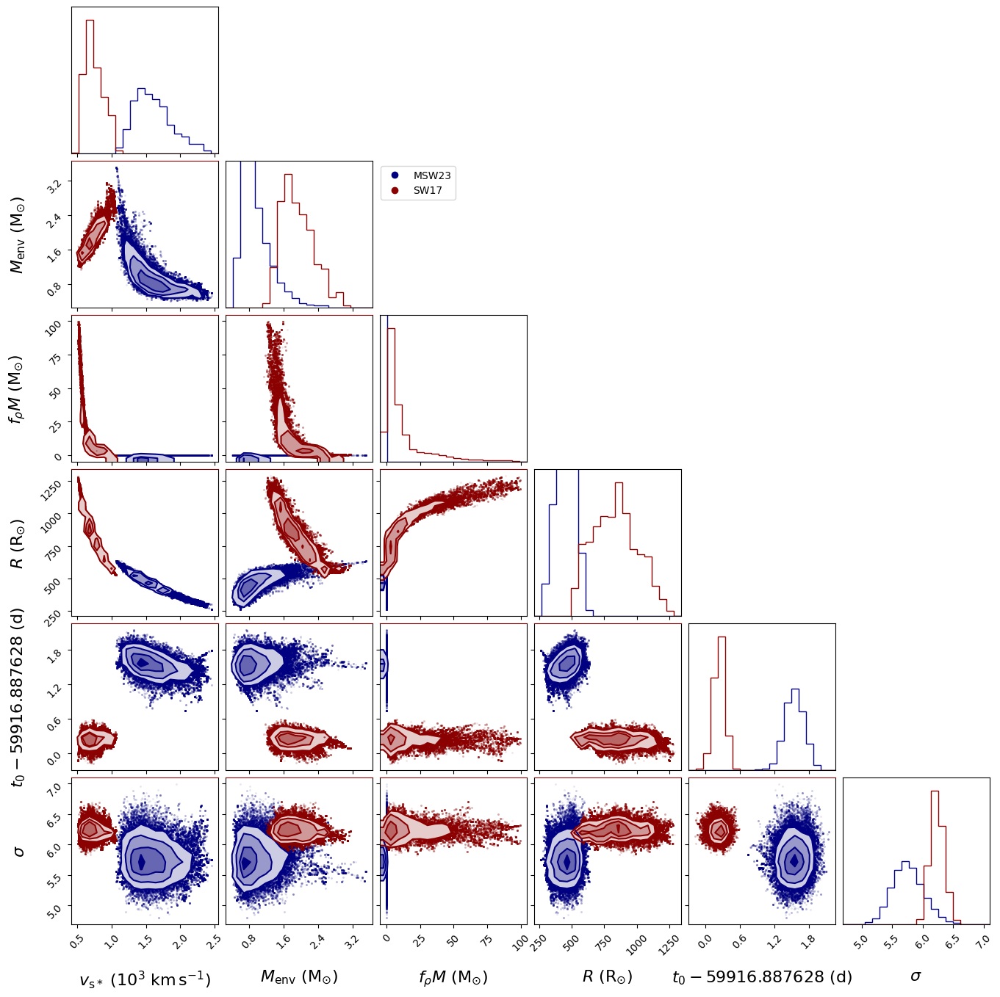

In [ ]:

sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w.npy')*units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w.npy')*units_array
# model_sc3 = models.ShockCooling4(lc_masked)

textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
# model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = np.mean([sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0), sampler_flatchain_corner_sc3[:,-1-int(use_sigma)].mean(axis=0)])#lc['MJD'].min()

model_sc3 = models.ShockCooling4(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc4, axis=0)
min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc3, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc4, axis=0)
max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc3, axis=0)

min_total = np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total = np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
plt.rcdefaults()
fig = corner.corner(sampler_flatchain_corner_sc4, labels=axis_labels_corner,
                    label_kwargs={'size': textsize}, color='navy',
                    range=bins_edges,fill_contours=True,dpi=150)

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner,
                    label_kwargs={'size': textsize}, color='darkred', range=bins_edges,fill_contours=True,
                    fig=fig)


corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        
        children = np.array(ax.get_children())
        children[0].set_color('navy')
        children[11].set_color('darkred')
        
        
        
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle=''),
          plt.Line2D([0], [0], color='darkred', lw=2, marker='o', linestyle='')]
plt.legend(handles, ['MSW23', 'SW17'], bbox_to_anchor=(-2.6, 5.2))
# print(h)
# plt.savefig('paper_images/corner_plot_sc4andsc3_withsigma.pdf')
plt.show()

## two models plot

0
1
2
3
4


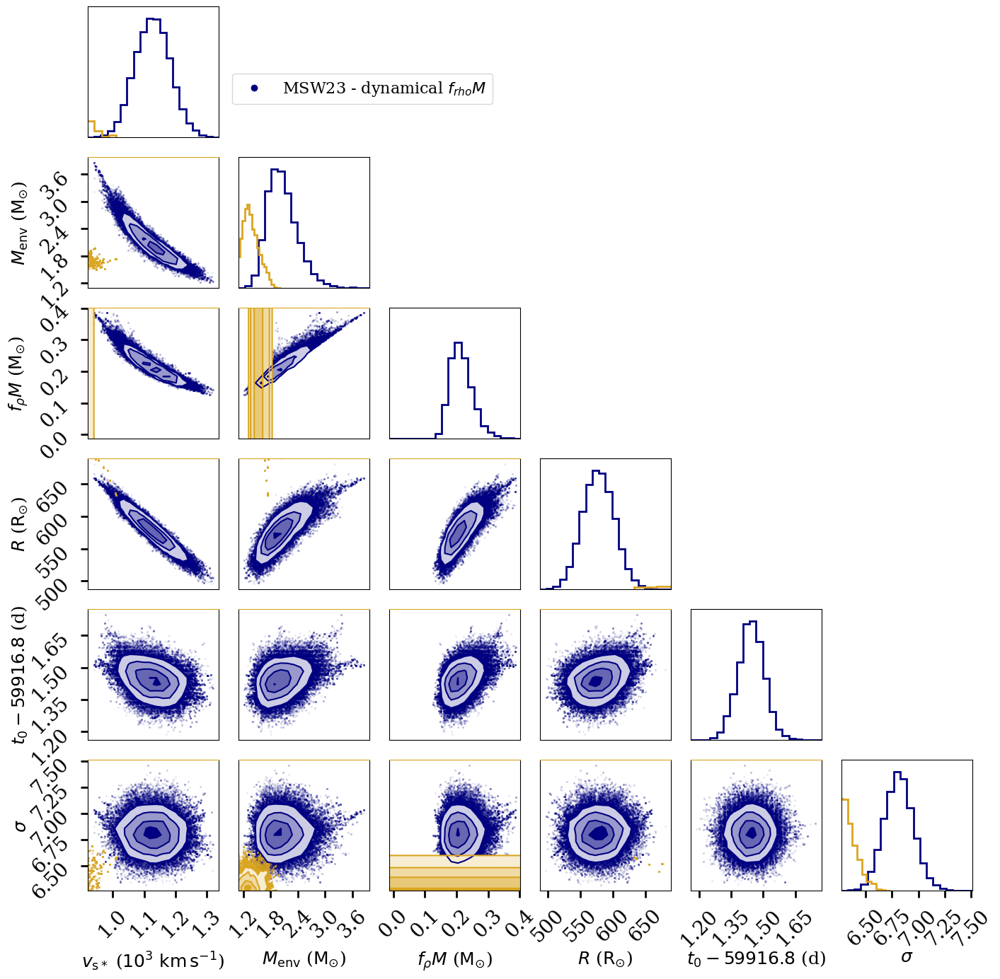

In [45]:
import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()
    

reset_plot_style()
plt.rcParams.update({'xtick.direction': 'out',
                     'ytick.direction': 'out',
                     'xtick.minor.visible': False,
                     'ytick.minor.visible': False,
                     'axes.labelsize': 18,
                     'axes.labelpad': 4,
                    #  "axes.grid":True 
                     })

ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5

use_sigma=True
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)
sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL_v2.npy')#*units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL_v2.npy')#[:,1000:,:]*units_array
# model_sc3 = models.ShockCooling4(lc_masked)

# textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
# model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = np.mean([sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0), sampler_flatchain_corner_sc3[:,-1-int(use_sigma)].mean(axis=0)])#lc['MJD'].min()

model_sc3 = models.ShockCooling4(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:.1f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc4, axis=0)
min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc4, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc4, axis=0)
max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc4, axis=0)

min_total = np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total = np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
# plt.rcdefaults()

# with plt.rc_context({'axes.labelsize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12,
#                      'lines.linewidth': 2, 'figure.figsize': [10, 10]}):
fig = corner.corner(sampler_flatchain_corner_sc4, labels=axis_labels_corner, color='navy',
                    range=bins_edges,fill_contours=True,dpi=150, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner, color='goldenrod',fill_contours=True,
                    fig=fig, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

fig.subplots_adjust(hspace=0.15, wspace=0.15)
# plt.rcParams['axes.grid'] = True 
n = sampler_flatchain_corner_sc4.shape[-1]
corner_axes =  np.array(fig.get_axes()).reshape(n, n)#np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        # ax.grid(True)
        children = np.array(ax.get_children())
        children[0].set_color('navy')
        children[11].set_color('goldenrod')
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        ax.set_xlim(bins_edges[j][0], bins_edges[j][1])
        ax.set_ylim(bins_edges[i][0], bins_edges[i][1])
        # Remove x ticks if not bottom row
        if i != n - 1:
            ax.set_xticks([])

        # Remove y ticks if not left column
        if j != 0:
            ax.set_yticks([])
    # ax.set_ylim(bins_edges[i][0], bins_edges[i][1])

# Remove x-ticks from diagonal axes
for k in range(n):
    if k==n-1:
        ax = corner_axes[k, k]
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
        # ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        continue
    ax = corner_axes[k, k]
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_xlim(np.min(bins_edges[k]), np.max(bins_edges[k]))
    print(k)
    # if k == 0:
    #     ax.set_ylim(0,ax.get_ylim()[1]+1*ax.get_ylim()[1])
    # if k == 2:
    #     print(k, ax.get_ylim()[1])
    #     ax.set_ylim(0,ax.get_ylim()[1]+20*ax.get_ylim()[1])
    # if k == 3:
    #     ax.set_ylim(0,ax.get_ylim()[1]+25*ax.get_ylim()[1])
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle=''),
          plt.Line2D([0], [0], color='goldenrod', lw=2, marker='o', linestyle='')]
# plt.legend(handles, ['MSW23', 'SW17'], bbox_to_anchor=(-3.6, 6.3))
plt.legend([handles[0]], [f'MSW23 - dynamical $f_{{rho}}M$'], bbox_to_anchor=(-3.6+1, 6.3))
# print(h)
# plt.savefig('outputs/images/paper2025/corner_plot_sc4andsc3_withsigma.pdf', bbox_inches='tight')
plt.show()

In [37]:
bins_edges

[(0.9197226226329803, 1.3379190504550933),
 (1.0878394365310669, 3.97738664150238),
 (-0.013103348016738892, 0.4017539441585541),
 (487.224853515625, 689.7674560546875),
 (1.1595703125, 1.7740234375),
 (6.266299438476563, 7.514224815368652)]

In [35]:
nsteps

5000

0
1
2
2 28042.300000000003
3
4


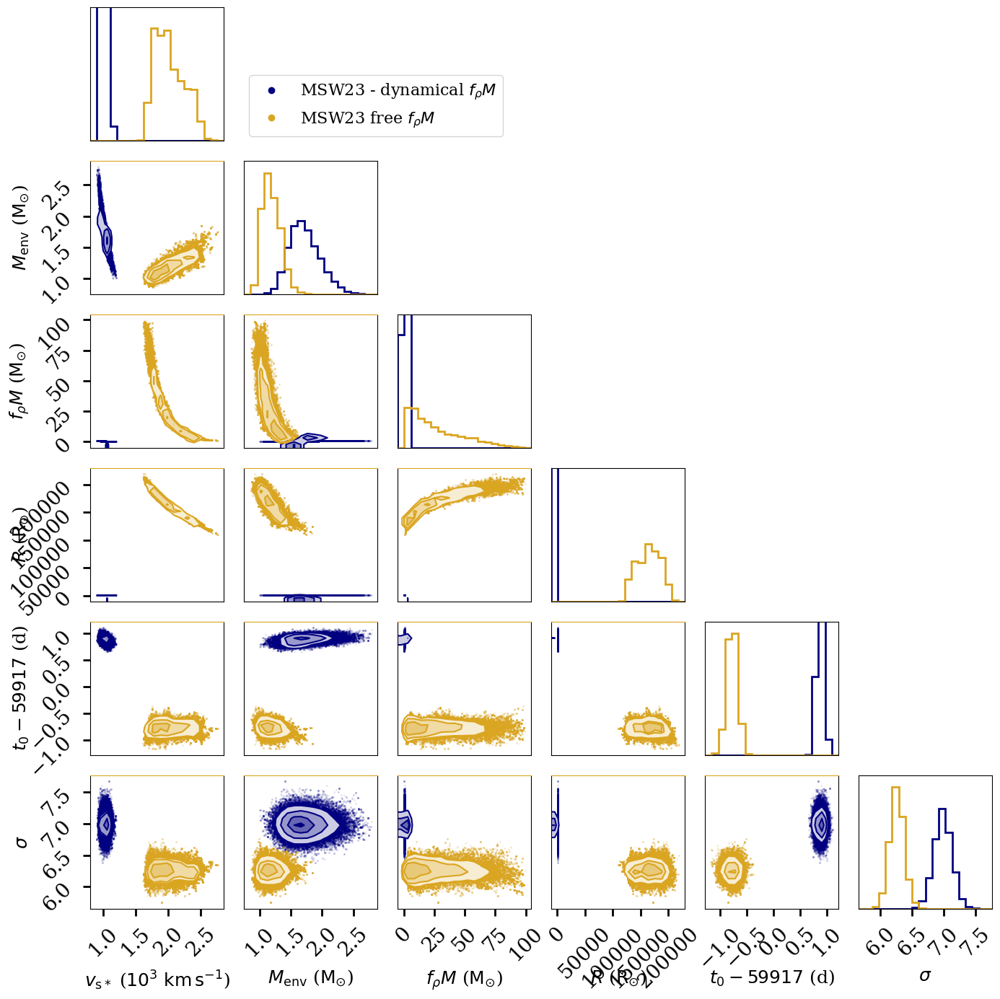

In [46]:

reset_plot_style()

plt.rcParams.update({'xtick.direction': 'out',
                     'ytick.direction': 'out',
                     'xtick.minor.visible': False,
                     'ytick.minor.visible': False,
                     'axes.labelsize': 18,
                     'axes.labelpad': 4,
                    #  "axes.grid":True 
                     })



use_sigma=True
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)
sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_DYNAMICAL.npy')#*units_array
model_sc4 = models.ShockCooling4(lc_masked)
sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain_32w_DYNAMICAL.npy')*units_array
# model_sc3 = models.ShockCooling4(lc_masked)

# textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
# model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = np.mean([sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0), sampler_flatchain_corner_sc3[:,-1-int(use_sigma)].mean(axis=0)])#lc['MJD'].min()

model_sc3 = models.ShockCooling4(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:.1f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc4, axis=0)
min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc3, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc4, axis=0)
max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc3, axis=0)

min_total = np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total = np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
# plt.rcdefaults()

# with plt.rc_context({'axes.labelsize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12,
#                      'lines.linewidth': 2, 'figure.figsize': [10, 10]}):
fig = corner.corner(sampler_flatchain_corner_sc4, labels=axis_labels_corner, color='navy',
                    range=bins_edges,fill_contours=True,dpi=150, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner, color='goldenrod', range=bins_edges,fill_contours=True,
                    fig=fig, label_kwargs={"fontfamily":"serif"},
                    hist_kwargs={"linewidth": 2})

fig.subplots_adjust(hspace=0.15, wspace=0.15)
# plt.rcParams['axes.grid'] = True 
n = sampler_flatchain_corner_sc4.shape[-1]
corner_axes =  np.array(fig.get_axes()).reshape(n, n)#np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        # ax.grid(True)
        children = np.array(ax.get_children())
        children[0].set_color('navy')
        children[11].set_color('goldenrod')
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        
        # Remove x ticks if not bottom row
        if i != n - 1:
            ax.set_xticks([])

        # Remove y ticks if not left column
        if j != 0:
            ax.set_yticks([])
# Remove x-ticks from diagonal axes
for k in range(n):
    if k==n-1:
        ax = corner_axes[k, k]
        ax.set_xlabel("\n"+ax.get_xlabel(), labelpad=10)
        
        # ax.set_ylabel(ax.get_ylabel()+"\n", labelpad=10)
        continue
    ax = corner_axes[k, k]
    ax.set_xticks([])
    ax.set_xticklabels([])
    print(k)
    if k == 0:
        ax.set_ylim(0,ax.get_ylim()[1]+.08*ax.get_ylim()[1])
    if k == 2:
        print(k, ax.get_ylim()[1])
        ax.set_ylim(0,ax.get_ylim()[1]+2*ax.get_ylim()[1])
    if k == 3:
        ax.set_ylim(0,ax.get_ylim()[1]+1.1*ax.get_ylim()[1])
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle=''),
          plt.Line2D([0], [0], color='goldenrod', lw=2, marker='o', linestyle='')]
plt.legend(handles, [f'MSW23 - dynamical $f_{{\\rho}}M$', 'MSW23 free $f_{{\\rho}}M$'], bbox_to_anchor=(-3.6+1, 6.3))

# print(h)
# plt.savefig('outputs/images/paper2025/APPENDIX_corner_plot_sc4andsc3_withsigma.pdf', bbox_inches='tight')
plt.show()

1.0666577816009521

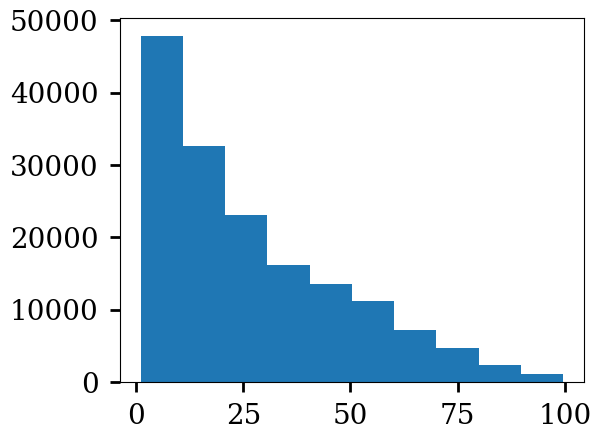

In [51]:
fpm = squeezed_sc3_flatchain[:, 2]
plt.hist(fpm)
plt.tight_layout()
np.min(fpm)

In [52]:
m = models.ShockCooling4(lc_early)
p = np.median(squeezed_sc4_flatchain,axis=0)
m.t_max(p)

59931.54155565919

In [39]:
def first_significant_digit_position(num):
    num_str = str(num).lstrip('-0')  # Remove negative sign and leading zeros
    if '.' in num_str:
        decimal_pos = num_str.index('.')
        num_str = num_str.replace('.', '')
        first_digit_pos = next((i for i, digit in enumerate(num_str) if digit != '0'), -1)
        return first_digit_pos - decimal_pos + 1
    else:
        return next((i for i, digit in enumerate(num_str) if digit != '0'), -1)


In [40]:
def get_percentile(arr, p=.5):

    return np.percentile(arr, p, axis=0)

In [ ]:

# np.median(squeezed_sc3_flatchain, axis=0)

array([7.93521182e+23])

In [136]:
squeezed_sc3_flatchain

array([[7.50578106e-01, 1.97889733e+00, 4.14360046e+00, 7.76887588e+02,
        5.99163906e+04],
       [7.49015601e-01, 1.97761929e+00, 4.26675510e+00, 7.79164163e+02,
        5.99163867e+04],
       [7.49015601e-01, 1.97761929e+00, 4.26675510e+00, 7.79164163e+02,
        5.99163867e+04],
       ...,
       [8.38693678e-01, 2.13152575e+00, 1.40924346e+00, 6.98091426e+02,
        5.99161914e+04],
       [8.38693678e-01, 2.13152575e+00, 1.40924346e+00, 6.98091426e+02,
        5.99161914e+04],
       [8.38693678e-01, 2.13152575e+00, 1.40924346e+00, 6.98091426e+02,
        5.99161914e+04]])

In [11]:
np.median(squeezed_sc3_flatchain, axis=0)

array([7.56677740e-01, 1.41845703e+00, 4.01106167e+00, 9.23567705e+02,
       5.99162188e+04, 6.24923277e+00])

In [68]:
def first_significant_digit_position(num):
    num_str = str(num).lstrip('-0')  # Remove negative sign and leading zeros
    if '.' in num_str:
        decimal_pos = num_str.index('.')
        num_str = num_str.replace('.', '')
        first_digit_pos = next((i for i, digit in enumerate(num_str) if digit != '0'), -1)
        return first_digit_pos - decimal_pos + 1
    else:
        return next((i for i, digit in enumerate(num_str) if digit != '0'), -1)

def get_percentile(arr, p=.5):

    return np.percentile(arr, p, axis=0)
# sc3_flatchain[:, 3] = sc3_flatchain[:, 3]*ten13cm2Rsun
# sc4_flatchain[:, 3] = sc4_flatchain[:, 3]*ten13cm2Rsun
# squeezed_sc3_flatchain_physical_units

squeezed_sc3_flatchain_physical_units = squeezed_sc3_flatchain#*units_array[0,:-1]

squeezed_sc4_flatchain_physical_units = squeezed_sc4_flatchain#*units_array
# squeezed_sc4_flatchain_physical_units
medians_sc3 = get_percentile(squeezed_sc3_flatchain_physical_units, p=50)
err_sc3_upper = get_percentile(squeezed_sc3_flatchain_physical_units, p=84) - medians_sc3
err_sc3_lower = np.abs(get_percentile(squeezed_sc3_flatchain_physical_units, p=16) - medians_sc3)


medians_sc4 = get_percentile(squeezed_sc4_flatchain_physical_units, p=50)
err_sc4_upper = get_percentile(squeezed_sc4_flatchain_physical_units, p=84) - medians_sc4
err_sc4_lower = np.abs(get_percentile(squeezed_sc4_flatchain_physical_units, p=16) - medians_sc4)


for i in range(len(medians_sc4)):

    round_upper_sc4 = first_significant_digit_position(err_sc4_upper[i])
    round_lower_sc4 = first_significant_digit_position(err_sc4_lower[i])
    round_sc4 = min([round_upper_sc4,round_lower_sc4])

    round_upper_sc3 = first_significant_digit_position(err_sc3_upper[i])
    round_lower_sc3 = first_significant_digit_position(err_sc3_lower[i])
    round_sc3 = min([round_upper_sc3,round_lower_sc3])
    
    print(f'${round(medians_sc4[i], round_sc4)}^{{+{round(err_sc4_upper[i], round_sc4)}}}_{{-{round(err_sc4_lower[i], round_sc4)}}}$',
          f'& ${round(medians_sc3[i], round_sc3)}^{{+{round(err_sc3_upper[i], round_sc3)}}}_{{-{round(err_sc3_lower[i], round_sc3)}}}$')
    
    # print($round(medians_sc4[i], round_sc4))
    # pri^\{{{}\}$nt(round(err_sc4_upper[i], round_sc4))
    # print(round(err_sc4_lower[i], round_sc4))










# print(medians_sc4,end='\n')
# print(err_sc3_upper,end='\n')
# print(err_sc3_lower,end='\n')

# print(medians_sc3,end='\n')

# print(err_sc4_upper,end='\n')
# print(err_sc4_lower,end='\n')
# model_shock4.units

$1.8^{+0.4}_{-0.3}$ & $0.7^{+0.1}_{-0.1}$
$1.7^{+0.4}_{-0.3}$ & $1.4^{+0.2}_{-0.2}$
$0.03^{+0.04}_{-0.01}$ & $5.0^{+9.0}_{-4.0}$
$360.0^{+90.0}_{-80.0}$ & $1000.0^{+100.0}_{-200.0}$
$59916.7^{+0.2}_{-0.2}$ & $59916.23^{+0.09}_{-0.1}$
$6.2^{+0.1}_{-0.1}$ & $6.3^{+0.1}_{-0.1}$


## Single model plot

In [ ]:
use_sigma=True
units_array = np.array([ten8p5cmstoten3kms, 1, 1, ten13cmtoRsol, 1, 1]).reshape(1,-1)
sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain.npy')
model_sc4 = models.ShockCooling4(lc_masked)
# sc3_flatchain = np.load('outputs/sc3_inner_prob_flatchain.npy')
# model_sc3 = models.ModifiedShockCooling3(lc_masked)

textsize=16
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

squeezed_sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
squeezed_sc3_flatchain = sc3_flatchain.reshape(nwalkers*nsteps, nparams)

model_shock4 = models.ShockCooling4(lc_early)
model_shock3 = models.ModifiedShockCooling3(lc_early)

sampler_flatchain_corner_sc4 = squeezed_sc4_flatchain.copy()
# sampler_flatchain_corner_sc3 = squeezed_sc3_flatchain.copy()

t0_offset = sampler_flatchain_corner_sc4[:,-1-int(use_sigma)].mean(axis=0)#np.mean([sampler_flatchain_corner_sc4.mean(axis=0)[-1-int(use_sigma)], sampler_flatchain_corner_sc3.mean(axis=0)[-1-int(use_sigma)]])#lc['MJD'].min()
# print(t0_offset)
# aaa
model_sc3 = models.ModifiedShockCooling3(lc_masked)
if use_sigma and model_sc3.input_names[-1] != '\\sigma':
    model_sc3.input_names.append('\\sigma')
    model_sc3.units.append(u.dimensionless_unscaled)
    print('aa')
model_sc3.units[3] = u.Rsun
model_sc3.units[0] = 10**3*u.km/u.s


axis_labels_corner = model_sc3.axis_labels
# axis_labels_corner

for var in ['t_0', 't_\\mathrm{max}']:
    if var in model_shock4.input_names:
        i_t0 = model_shock4.input_names.index(var)

        sampler_flatchain_corner_sc4[:, i_t0] -= np.floor(t0_offset)
        # sampler_flatchain_corner_sc3[:, i_t0] -= np.floor(t0_offset)

        t0_offset_formatted = '{:f}'.format(t0_offset).rstrip('0').rstrip('.')
        axis_labels_corner[i_t0] = f'${var} - {t0_offset_formatted}$ (d)'


min_flatchain_sc4 = np.min(sampler_flatchain_corner_sc4, axis=0)
# min_flatchain_sc3 = np.min(sampler_flatchain_corner_sc3, axis=0)

max_flatchain_sc4 = np.max(sampler_flatchain_corner_sc4, axis=0)
# max_flatchain_sc3 = np.max(sampler_flatchain_corner_sc3, axis=0)

min_total = min_flatchain_sc4#np.min(np.vstack([min_flatchain_sc4,min_flatchain_sc3]), axis=0)
max_total =max_flatchain_sc4#np.max(np.vstack([max_flatchain_sc4,max_flatchain_sc3]), axis=0)

bins_edges = []
for i in range(len(min_total)):
    diff = max_total[i]-min_total[i]
    if i==2:
        bins_edges.append((-.5/10*diff,max_total[i]+.5/10*diff))    
    else:
        bins_edges.append((min_total[i]-.5/10*diff,max_total[i]+.5/10*diff))
        
# bin_edges = [np.linspace(-5, 5, 20), np.linspace(-5, 10, 20)]
hist_kwargs = {'bins':bins_edges}
# plt_style()
plt.rcdefaults()
fig = corner.corner(sampler_flatchain_corner_sc4, labels=axis_labels_corner,
                    label_kwargs={'size': textsize}, color='navy',
                    range=bins_edges,fill_contours=True,dpi=150)

corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])


# fig = corner.corner(sampler_flatchain_corner_sc3, labels=axis_labels_corner,
#                     label_kwargs={'size': textsize}, color='darkred', range=bins_edges,fill_contours=True,
#                     fig=fig)


corner_axes = np.array(fig.get_axes()).reshape(sampler_flatchain_corner_sc4.shape[-1], sampler_flatchain_corner_sc4.shape[-1])
for i in range(len(corner_axes)):
    for j in range(i):
        ax = corner_axes[i, j]
        
        children = np.array(ax.get_children())
        children[0].set_color('navy')
        children[11].set_color('darkred')
        
        
        
        # children[1].set_edgecolor(None)
        # children[2].set_edgecolor(colors[j]) #grid
        # children[3].set_edgecolor(color)
        # children[4].set_edgecolor(color)
        # children[5].set_edgecolor(color)
        # children[6].set_edgecolor(color)
handles = [plt.Line2D([0], [0], color='navy', lw=2, marker='o', linestyle='')]#,
          # plt.Line2D([0], [0], color='darkred', lw=2, marker='o', linestyle='')]
plt.legend(handles, ['MSW23'], bbox_to_anchor=(-2.6, 5.2))

# plt.savefig('paper_images/corner_plot_sc4andsc3_withsigma.pdf')
plt.show()

# Bolometric analysis Paper

In [11]:
import sys
sys.path.insert(0, '../')



import numpy as np
import os

import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
from lightcurve_fitting import lightcurve
from scipy.optimize import curve_fit
import emcee
import importlib 

%matplotlib inline

import paper_plot_style# import set_plot_style
from matplotlib.ticker import MaxNLocator

def reset_plot_style():
    importlib.reload(paper_plot_style)
    paper_plot_style.set_plot_style()

In [12]:

def plt_style():
    plt.rcParams.update({
                        'lines.linewidth':1.0,
                        'lines.linestyle':'-',
                        'lines.color':'black',
                        'font.family':'serif',
                        'font.weight':'normal',
                        'font.size':22.0,
                        'text.color':'black',
                        # 'text.usetex':False,
                        'axes.edgecolor':'black',
                        'axes.linewidth':1.0,
                        'axes.grid':False,
                        'axes.titlesize':'x-large',
                        'axes.labelsize':'x-large',
                        'axes.labelweight':'normal',
                        'axes.labelcolor':'black',
                        'axes.formatter.limits':[-4,4],
                        'xtick.major.size':7,
                        'xtick.minor.size':4,
                        'xtick.major.pad':8,
                        'xtick.minor.pad':8,
                        'xtick.labelsize':'medium',
                        'xtick.minor.width':1.0,
                        'xtick.major.width':1.0,
                        'ytick.major.size':7,
                        'ytick.minor.size':4,
                        'ytick.major.pad':8,
                        'ytick.minor.pad':8,
                        'ytick.labelsize':'medium',
                        'ytick.minor.width':1.0,
                        'ytick.major.width':1.0,
                        'legend.numpoints':1,
                        #'legend.fontsize':'x-large',
                        'legend.shadow':False,
                        'legend.frameon':False})
    
# These are the "Tableau 20" colors as RGB.
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]

# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.
for i in range(len(tableau20)):
    r, g, b = tableau20[i]
    tableau20[i] = (r / 255., g / 255., b / 255.)


Results product from

python extrabol.py ../2022acko_extrabol.dat -m 2p --verbose --plot -wc -dt 2 --settings ../2022acko_extrabol_settings.txt -s 0 -e 500 -t0 59916.793 --nebular-dir nebular --nebular 130

python extrabol.py ../2022acko_extrabol.dat -m 2p --verbose --plot -wc -dt 2 --settings ../2022acko_extrabol_settings.txt -s 0 -e 500 -t0 59916.793 --nebular-dir nebular --nebular 130

In [13]:
products_dir = "products/"
bolodata = pd.read_csv(products_dir + "2022acko_pd_to_bolo_2p.txt", sep=" ")
data_dir = 'data/2022acko/'

filename = os.path.join(data_dir,'2022acko_total.dat')
lc = lightcurve.LC.read(filename, format='ascii')

sc4_flatchain = np.load('outputs/sc4_inner_prob_flatchain_32w_observed.npy')
nsteps = sc4_flatchain.shape[1]
nwalkers = sc4_flatchain.shape[0]
nparams = sc4_flatchain.shape[2]

sc4_flatchain = sc4_flatchain.reshape(nwalkers*nsteps, nparams)
# sc3_flatchain = np.load('outputs/flatchain_sc3mod.npy')
t0_offset = sc4_flatchain[:,-2].mean(axis=0)#np.mean([, sc3_flatchain.mean(axis=0)[-1]])#lc['MJD'].min()


26.0 1.0606922953683813
55


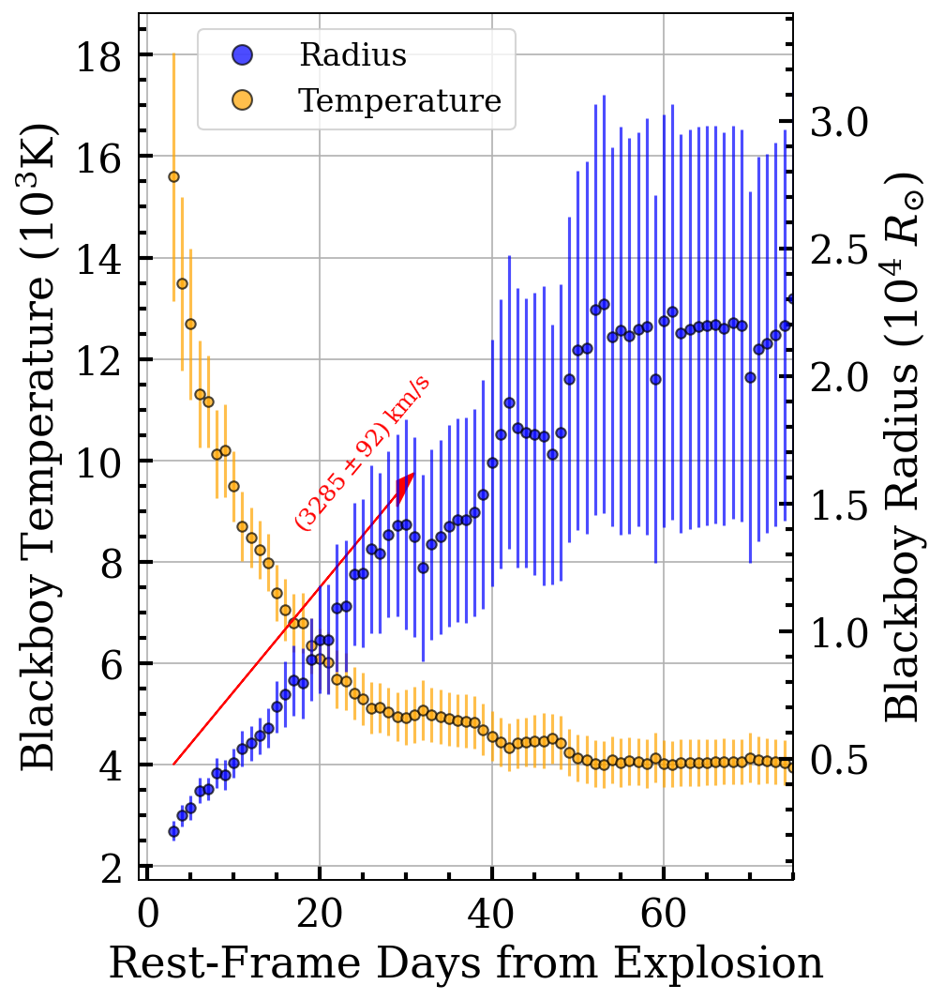

In [14]:
def R_f(mjd, vs, lcoef):
    return vs*mjd + lcoef

# plt_style()
# mpl.rcdefaults()
# plt.rcParams.update({'font.size':20,
#                      'legend.fontsize':16,
#                      'font.family':'serif',
#                      'font.weight':'normal',
#                     })
reset_plot_style()
fig, ax = plt.subplots(figsize=(6,8), dpi=150)

ten13cmtoRsol = 1e13*1.4374e-11
ten8p5cmstoten3kms = 10**.5


radius_sty = {'ls':'',
              'marker':'.',
              'ms':10,
              # 'color':'orange',
             'mec':'black',
             'mfc': 'blue',
             'mew': 1,
             'label':'Radius',
             'alpha':.7}

temp_sty = {'ls':'',
            'marker':'.',
            'ms':10,
            # 'color':'orange',
           'mec':'black',
           'mfc': 'orange',
           'mew':1,
           'label':'Temperature',
           'alpha':.7}


ax.set_xlabel(f'Rest-Frame Days from Explosion')
ax.set_ylabel('Blackboy Temperature ($10^{3}$K)')

ax_radius = ax.twinx()
ax_radius.set_ylabel('Blackboy Radius ($10^4\;R_{\odot}$)')



mjd_tocut = np.array(bolodata['Time (MJD)'])
radius = np.array(bolodata['Radius/1e15 (cm)'])
radius_err = np.array(bolodata['Radius Err.'])
temp = bolodata['Temp./1e3 (K)']
temp_err = bolodata['Temp. Err.']

cut = mjd_tocut<30

mjd = mjd_tocut[cut]
radius = radius[cut]
radius_err = radius_err[cut]

ten15cmtoRsol1e4 = ten13cmtoRsol*1e2/1e4

p0_R = (0.1, 0)
popt, pcov = curve_fit(R_f, mjd, radius, sigma=radius_err+.001,
                p0=p0_R, absolute_sigma = False, method='trf')

p_errs = np.sqrt(np.diag(pcov))

vs = popt[0]
vs_err = p_errs[0]
######################### ARROW ######################### 
x=mjd
y=R_f(mjd, *popt*ten15cmtoRsol1e4)+.2*R_f(mjd, *popt*ten15cmtoRsol1e4)[-1]
# Coordinates for the arrow (start at 0,0 and point to 3,2)
x_start, y_start = x[0], y[0]
x_end, y_end = x[-1], y[-1]

# Draw the arrow
plt.arrow(x_start, y_start, x_end - x_start, y_end - y_start,
          head_width=0.1, head_length=2, fc='red', ec='red')

# Calculate the angle of the arrow in degrees
dx = x_end - x_start
dy = y_end - y_start
angle = 55#np.degrees(np.arctan(dy, dx))

print(dx, dy)
print(angle)
# Add text with the same inclination under the arrow

ten15cmpd2kmps = 1e10/60/60/24
text = f"$({vs*ten15cmpd2kmps:.0f} \pm{vs_err*ten15cmpd2kmps:.0f})\;$km/s"

# plt.text((x_start + x_end) / 2+9, (y_start + y_end) / 2+.7,
#          text, rotation=angle-5, rotation_mode='anchor', 
#          va='center', ha='center', color='red', fontsize=14)#, fontsize=12)

plt.text(25, 1.7,
         text, rotation=angle-5, rotation_mode='anchor', 
         va='center', ha='center', color="red", fontsize=12)#, fontsize=12)


######################## END OF ARROW ######################## 



ax.errorbar(bolodata['Time (MJD)'], bolodata['Temp./1e3 (K)'],bolodata['Temp. Err.'], ecolor=temp_sty['mfc'],**temp_sty)
ax_radius.errorbar(bolodata['Time (MJD)'], bolodata['Radius/1e15 (cm)']*ten15cmtoRsol1e4,bolodata['Radius Err.']*ten15cmtoRsol1e4, ecolor=radius_sty['mfc'],**radius_sty)

radius_hand = radius_sty.copy()
radius_hand['ms'] = 20
temp_hand = temp_sty.copy()
temp_hand['ms'] = 20

radius_marker = mpl.lines.Line2D([],[],**radius_hand)
temp_marker = mpl.lines.Line2D([],[],**temp_hand)

handles = [radius_marker,temp_marker]
labels = [radius_sty['label'], temp_sty['label']]

ax.set_xlim(-1,75)
ax.grid()
plt.legend(handles=handles, labels=labels, bbox_to_anchor=(.6,1.), ncol=1)

# plt.savefig('outputs/images/paper2025/TempRadiusBB.pdf', bbox_inches="tight")

In [15]:
arr = np.array(lc["MJD"])

unique, counts = np.unique(arr, return_counts=True)
duplicates = unique[counts > 1]


In [16]:
def valent_f(mjd, A0, Tpt, W0, P0, M0):
    t1 = -A0/(1+np.exp((mjd-Tpt)/W0)) 
    t2 = P0*mjd
    t3 = M0
    return t1+t2+t3

In [17]:
def nickel_func(t, lum_func):
    gram2Msol = 1.989e-33
    eco = 6.8 * 1e9/gram2Msol
    # eco = 6.8 * 1e9  #erg s^−1 g^−1
    lamb_co = 1/111.4# days−1
    lamb_ni = 1/8.8# days−1
    
    Mnick = (lum_func/eco)*(lamb_co-lamb_ni)/lamb_ni/(np.exp(-lamb_ni*t)-np.exp(-lamb_co*t))
    return Mnick

In [18]:
def loglum_nickelmass_func(t, Mnick):
    gram2Msol = 5.02785e-34
    eco = 6.8 * 1e9/gram2Msol#erg s^−1 g^−1
    lamb_co = 1/111.4# days−1
    lamb_ni = 1/8.8# days−1
    
    lum = Mnick*eco/(lamb_co-lamb_ni)*lamb_ni*(np.exp(-lamb_ni*t)-np.exp(-lamb_co*t))
    return np.log10(lum)
    
loglum_nickelmass_func(300, 0.05)

40.69628017450018

In [19]:
gram2Msol = 5.02785e-34
eco = 6.8 * 1e9/gram2Msol
eco

1.3524667601459868e+43

In [20]:
np.max(bolodata['Time (MJD)'])

355.0

In [21]:
minmjd

59918.933279

In [22]:
import numpy as np

# Example arrays
bolo_times = np.array(bolodata['Time (MJD)']) + minmjd - 3
lc_times = np.array(lc["MJD"])

# For each bolo_time, check if there is an lc_time within ±1 day
mask = np.array([
    np.any(np.abs(lc_times - t) <= 1.0)   # ±1 day condition
    for t in bolo_times
])

# Filter bolo_times
matching_bolo_times = bolo_times[mask]

print("Matching bolo_times:", matching_bolo_times)

Matching bolo_times: [59918.933279 59919.933279 59920.933279 59921.933279 59922.933279
 59923.933279 59924.933279 59925.933279 59926.933279 59927.933279
 59928.933279 59929.933279 59930.933279 59931.933279 59932.933279
 59933.933279 59934.933279 59935.933279 59936.933279 59937.933279
 59938.933279 59939.933279 59940.933279 59941.933279 59942.933279
 59943.933279 59944.933279 59945.933279 59946.933279 59947.933279
 59948.933279 59949.933279 59950.933279 59951.933279 59952.933279
 59953.933279 59954.933279 59955.933279 59956.933279 59957.933279
 59958.933279 59959.933279 59960.933279 59961.933279 59962.933279
 59963.933279 59964.933279 59965.933279 59966.933279 59967.933279
 59968.933279 59969.933279 59970.933279 59971.933279 59972.933279
 59973.933279 59974.933279 59975.933279 59976.933279 59977.933279
 59978.933279 59979.933279 59980.933279 59982.933279 59983.933279
 59984.933279 59985.933279 59986.933279 59987.933279 59988.933279
 59990.933279 59991.933279 59992.933279 59993.933279 59

$A0 = -0.41194 \pm 0.01707$
$Tpt = 117.76851 \pm 0.61761$
$W0 = 5.31269 \pm 0.65603$
$P0 = -0.00489 \pm 0.00007$
$M0 = 41.52436 \pm 0.02011$
$M_{Ni} = 0.0145\pm0.0003 \; M_{\odot}$
$t_1 = 384\pm11 \; d$


/opt/conda/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


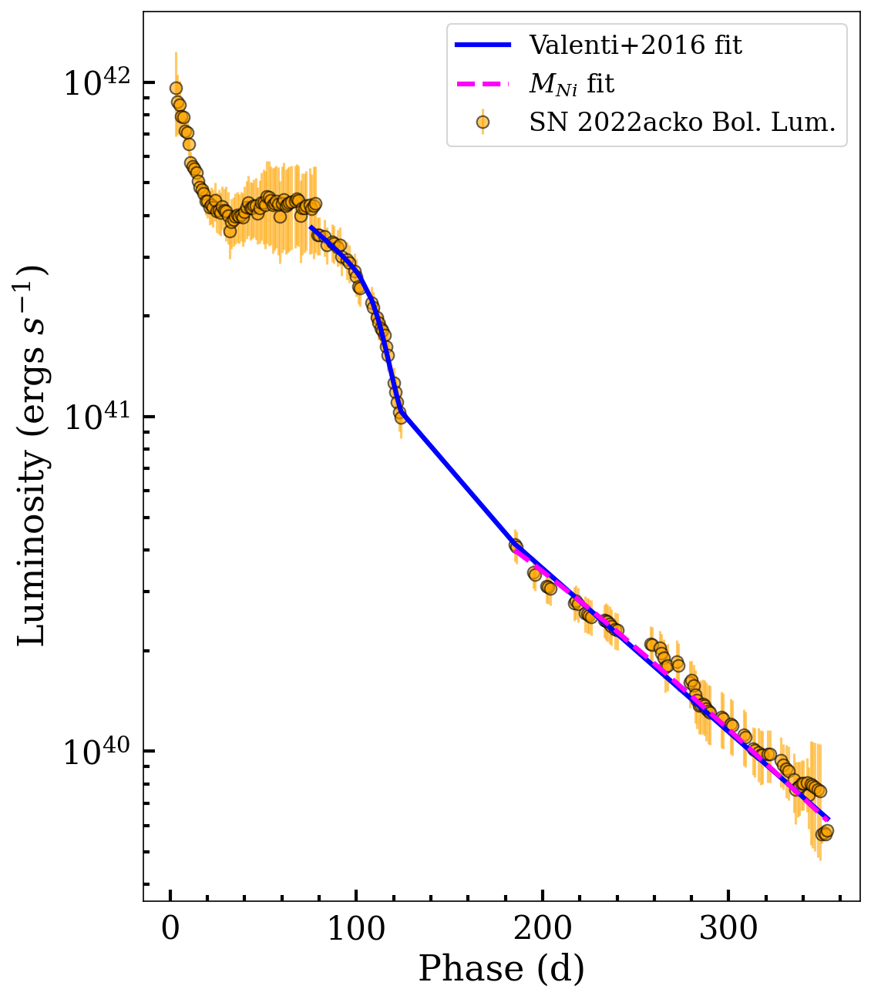

In [23]:
def modified_loglum_nickelmass_func(t, Mnick, t1):
    gram2Msol = 5.02785e-34
    eco = 6.8 * 1e9/gram2Msol#erg s^−1 g^−1
    lamb_co = 1/111.4# days−1
    lamb_ni = 1/8.8# days−1
    
    lum = Mnick*eco/(lamb_co-lamb_ni)*lamb_ni*(np.exp(-lamb_ni*t)-np.exp(-lamb_co*t))*(1-np.exp(-(t1/t)**2))
    return np.log10(lum)

reset_plot_style()
# mpl.rcdefaults()
# plt.rcParams.update({'font.size':20,#Fonts
#                      'legend.fontsize':20,
#                      'font.family':'serif',
#                      'font.weight':'normal',
#                      'axes.labelweight':'normal',
#                      'axes.labelsize':22,
#                      # X-axis
#                      'xtick.direction':'in',                     
#                      'xtick.major.size':7,
#                      'xtick.minor.size':4,
#                      'xtick.major.pad':8,
#                      'xtick.minor.pad':8,
#                      'xtick.major.width':2,
#                      'xtick.minor.width':2,
#                      'xtick.minor.visible':True,
#                      # Y-axis
#                      'ytick.direction':'in', 
#                      'ytick.major.size':7,
#                      'ytick.minor.size':4,
#                      'ytick.major.pad':8,
#                      'ytick.minor.pad':8,
#                      'ytick.major.width':2,
#                      'ytick.minor.width':2,
#                      'ytick.minor.visible':True,
                     
#                     })


fig, ax = plt.subplots(figsize=(8,10), dpi=150)

temp_sty = {'ls':'',
            'marker':'.',
            'ms':15,
            # 'color':'orange',
           'mec':'black',
           'mfc': 'orange',
           'mew':1,
           'label':'SN 2022acko Bol. Lum.',
           'alpha':.6}

ax.set_xlabel('Phase (d)')
ax.set_ylabel('Luminosity (ergs $s^{-1}$)')

# ax_radius = ax.twinx()
# ax_radius.set_ylabel('Radius ($10^{15}$cm)')


lum = 10**bolodata['Log10(Bol. Lum)'][mask]
d_lum = 10**bolodata['Log10(Bol. Err)'][mask]
ax.errorbar(bolodata['Time (MJD)'][mask], lum,d_lum, ecolor=temp_sty['mfc'],**temp_sty, zorder=1)




#valenti estimation and plot
d_loglum = (1/np.log(10)/10**bolodata['Log10(Bol. Lum)']*10**bolodata['Log10(Bol. Err)'])[mask]
dloglum_to_errorbar = d_loglum
loglum = bolodata['Log10(Bol. Lum)'][mask]
mjd = bolodata['Time (MJD)'][mask]
cut = (mjd>75)*(mjd<700)
d_loglum_tofit = d_loglum[cut]
loglum_tofit = loglum[cut]
mjd_tofit = mjd[cut]
p0_valenti = (1000, 50, 10, -0.001, 40)
popt, pcov = curve_fit(valent_f, mjd_tofit, loglum_tofit, sigma=d_loglum_tofit,
                p0=p0_valenti, absolute_sigma = False, method='trf')

p_errs = np.sqrt(np.diag(pcov))
ax.plot(mjd_tofit, 10**valent_f(mjd_tofit, *popt), lw=3, color='blue', label='Valenti+2016 fit')
param_names = ["A0", "Tpt", "W0", "P0", "M0"]
text_valent = "\n".join([
    f"${name} = {val:.5f} \\pm {err:.5f}$"
    for name, val, err in zip(param_names, popt, p_errs)
])
print(text_valent)

# mnick estimation and plot
d_loglum = (1/np.log(10)/10**bolodata['Log10(Bol. Lum)']*10**bolodata['Log10(Bol. Err)'])[mask]
dloglum_to_errorbar = d_loglum
loglum = bolodata['Log10(Bol. Lum)'][mask]
mjd = bolodata['Time (MJD)'][mask]
cut = (mjd>170)*(mjd<700)
d_loglum_tofit = d_loglum[cut]
loglum_tofit = loglum[cut]
mjd_tofit = mjd[cut]
p0_mnick = (0.05, 170)#(1000, 50, 10, -0.001, 40)
popt, pcov = curve_fit(modified_loglum_nickelmass_func, mjd_tofit, loglum_tofit, sigma=d_loglum_tofit,
                p0=p0_mnick, absolute_sigma = False, method='trf')

p_errs = np.sqrt(np.diag(pcov))
# ax.plot(mjd_tofit, 10**modified_loglum_nickelmass_func(mjd_tofit, *popt), lw=4, color='black', ls='--')
ax.plot(mjd_tofit, 10**modified_loglum_nickelmass_func(mjd_tofit, *popt), lw=3, color='fuchsia', label='$M_{Ni}$ fit', ls='--')




text = f"$M_{{Ni}} = {popt[0]:.4f}\pm{p_errs[0]:.4f} \; M_{{\odot}}$"+'\n'\
       f"$t_1 = {popt[1]:.0f}\pm{p_errs[1]:.0f} \; d$"
print(text)
# ax.annotate(text, xy=(.5,.7),xycoords='axes fraction')

# ax_radius.errorbar(bolodata['Time (MJD)'], bolodata['Radius/1e15 (cm)'],bolodata['Radius Err.'], ecolor=radius_sty['mfc'],**radius_sty)


# radius_hand = radius_sty.copy()
# radius_hand['ms'] = 20
temp_hand = temp_sty.copy()
temp_hand['ms'] = 20
ax.set_yscale('log')
# radius_marker = mpl.lines.Line2D([],[],**radius_hand)
temp_marker = mpl.lines.Line2D([],[],**temp_hand)

# handles = [temp_marker]
# labels = [temp_sty['label']]
handles, labels = ax.get_legend_handles_labels()
# reset_plot_style()
plt.legend(handles=handles, labels=labels, ncol=1) #box_to_anchor=(.65,1.1)
plt.savefig('outputs/images/paper2025/BolLight_obs.pdf', bbox_inches="tight")

In [17]:
2.5*100*0.00484

1.21

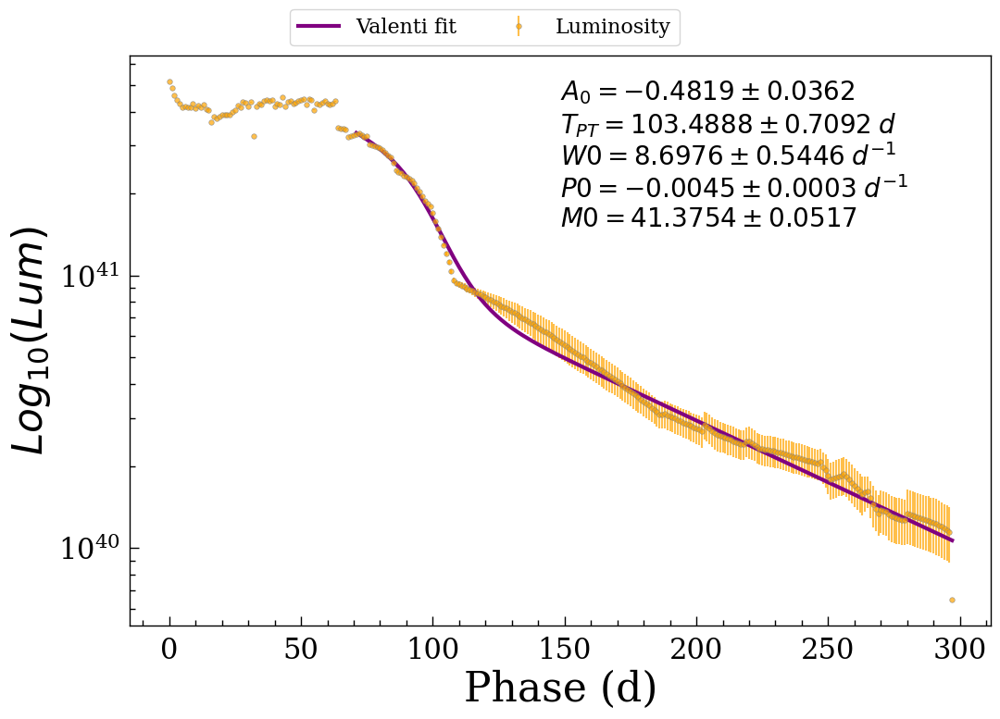

In [130]:
plt_style()
fig, ax = plt.subplots(figsize=(12,8), dpi=100)
mpl.rcdefaults()
plt.rcParams.update({'font.size':20,
                     'legend.fontsize':16,
                     'font.family':'serif',
                     'font.weight':'normal',
                    })

temp_sty = {'ls':'',
            'marker':'.',
            'ms':8,
            # 'color':'orange',
           'mec':'gray',
           'mfc': 'orange',
           'mew': .5,
           'label':'Luminosity',
           'alpha':.7}

ax.set_xlabel('Phase (d)')
ax.set_ylabel('$Log_{10}(Lum)$')

# ax_radius = ax.twinx()
# ax_radius.set_ylabel('Radius ($10^{15}$cm)')


d_loglum = 1/np.log(10)/10**bolodata['Log10(Bol. Lum)']*10**bolodata['Log10(Bol. Err)']
dloglum_to_errorbar = d_loglum
loglum = bolodata['Log10(Bol. Lum)']
mjd = bolodata['Time (MJD)']

cut = (mjd>70)*(mjd<300)

d_loglum_tofit = d_loglum[cut]
loglum_tofit = loglum[cut]
mjd_tofit = mjd[cut]

p0_valenti = (1000, 50, 10, -0.001, 40)
popt, pcov = curve_fit(valent_f, mjd_tofit, loglum_tofit, sigma=d_loglum_tofit,
                p0=p0_valenti, absolute_sigma = False, method='trf')

p_errs = np.sqrt(np.diag(pcov))


ax.errorbar(bolodata['Time (MJD)'], 10**bolodata['Log10(Bol. Lum)'], 10**bolodata['Log10(Bol. Err)'], ecolor=temp_sty['mfc'],**temp_sty)

ax.plot(mjd_tofit, 10**valent_f(mjd_tofit, *popt), lw=3, color='purple', label='Valenti fit')

text = f"$A_0 = {popt[0]:.4f}\pm{p_errs[0]:.4f}$"+'\n'+\
"$T_{PT}$"+f"$ = {popt[1]:.4f}\pm{p_errs[1]:.4f}\;d$ "+'\n'\
+ f"$W0 = {popt[2]:.4f}\pm{p_errs[2]:.4f} \;d^{{-1}}$"+'\n'\
+ f"$P0 = {popt[3]:.4f}\pm{p_errs[3]:.4f} \;d^{{-1}}$"+'\n'+\
f"$M0 = {popt[4]:.4f}\pm{p_errs[4]:.4f}$"

ax.annotate(text, xy=(.5,.7),xycoords='axes fraction')

# ax_radius.errorbar(bolodata['Time (MJD)'], bolodata['Radius/1e15 (cm)'],bolodata['Radius Err.'], ecolor=radius_sty['mfc'],**radius_sty)


# radius_hand = radius_sty.copy()
# radius_hand['ms'] = 20
temp_hand = temp_sty.copy()
temp_hand['ms'] = 20
ax.set_yscale('log')
# ax.axvline(130, ls='--', c='black', alpha=.5)
# radius_marker = mpl.lines.Line2D([],[],**radius_hand)
temp_marker = mpl.lines.Line2D([],[],**temp_hand)

# handles = [temp_marker]
# labels = [temp_sty['label']]
handles, labels = ax.get_legend_handles_labels()

plt.legend(handles=handles, labels=labels, bbox_to_anchor=(.65,1.1), ncol=2)


In [ ]:
text

In [ ]:
def loglum_nickelmass_func(t, Mnick):
    gram2Msol = 5.02785e-34
    eco = 6.8 * 1e9/gram2Msol#erg s^−1 g^−1
    lamb_co = 1/111.4# days−1
    lamb_ni = 1/8.8# days−1
    
    lum = Mnick*eco/(lamb_co-lamb_ni)*lamb_ni*(np.exp(-lamb_ni*t)-np.exp(-lamb_co*t))
    return np.log10(lum)


plt_style()
fig, ax = plt.subplots(figsize=(12,8), dpi=100)


temp_sty = {'ls':'',
            'marker':'.',
            'ms':8,
            # 'color':'orange',
           'mec':'gray',
           'mfc': 'orange',
           'mew': .5,
           'label':'Luminosity',
           'alpha':.7}

ax.set_xlabel('Phase (d)')
ax.set_ylabel('$Log_{10}(Lum)$')

# ax_radius = ax.twinx()
# ax_radius.set_ylabel('Radius ($10^{15}$cm)')


d_loglum = 1/np.log(10)/10**bolodata['Log10(Bol. Lum)']*10**bolodata['Log10(Bol. Err)']
dloglum_to_errorbar = d_loglum
loglum = bolodata['Log10(Bol. Lum)']
mjd = bolodata['Time (MJD)']

cut = (mjd>130)*(mjd<350)

d_loglum_tofit = d_loglum[cut]
loglum_tofit = loglum[cut]
mjd_tofit = mjd[cut]

p0_mnick = (0.05)#(1000, 50, 10, -0.001, 40)
popt, pcov = curve_fit(loglum_nickelmass_func, mjd_tofit, loglum_tofit, sigma=d_loglum_tofit,
                p0=p0_mnick, absolute_sigma = False, method='trf')

p_errs = np.sqrt(np.diag(pcov))


ax.errorbar(bolodata['Time (MJD)'], bolodata['Log10(Bol. Lum)'], dloglum_to_errorbar, ecolor=temp_sty['mfc'],**temp_sty)

ax.plot(mjd_tofit, loglum_nickelmass_func(mjd_tofit, *popt), lw=3, color='blue', label='$M_{Ni}$ fit')

text = f"$M_{{Ni}} = {popt[0]:.4f}\pm{p_errs[0]:.4f} \; M_{{\odot}}$"

ax.annotate(text, xy=(.5,.7),xycoords='axes fraction')

# ax_radius.errorbar(bolodata['Time (MJD)'], bolodata['Radius/1e15 (cm)'],bolodata['Radius Err.'], ecolor=radius_sty['mfc'],**radius_sty)


# radius_hand = radius_sty.copy()
# radius_hand['ms'] = 20
temp_hand = temp_sty.copy()
temp_hand['ms'] = 20
ax.set_yscale('log')
# radius_marker = mpl.lines.Line2D([],[],**radius_hand)
temp_marker = mpl.lines.Line2D([],[],**temp_hand)

# handles = [temp_marker]
# labels = [temp_sty['label']]
handles, labels = ax.get_legend_handles_labels()

plt.legend(handles=handles, labels=labels, bbox_to_anchor=(.65,1.1), ncol=2)


In [ ]:
def nickel_func(t, lum_func, t1=466):
    gram2Msol = 1/1.989e33
    eco = 6.8 * 1e9/gram2Msol
    # eco = 6.8 * 1e9  #erg s^−1 g^−1
    lamb_co = 1/111.4# days−1
    lamb_ni = 1/8.8# days−1
    
    Mnick = (lum_func/eco)*(lamb_co-lamb_ni)/lamb_ni/(np.exp(-lamb_ni*t)-np.exp(-lamb_co*t))/(1-np.exp(-(t1/t)**2))
    return Mnick
    
t = np.linspace(125, 180, 1000)
lums = 10**valent_f(t, *popt)
Mnick = nickel_func(t, lums)

plt.plot(t, Mnick)
# plt.xlim(150,200)
# plt.ylim(0,.01)

# Evolutionary Tracks

In [76]:
import sys
# sys.path.insert(0, '../')
from lightcurve_fitting import lightcurve, models, fitting, bolometric
from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import matplotlib as mpl
import read_mist_models
%matplotlib inline

In [77]:
track_dir = '/tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/'
eepdict = {}
inial_mass = 7
final_mass = 12
step = .5
masses = np.arange(inial_mass*10,final_mass*10+step*10,step*10).astype("int")
names = [track_dir+f'{m*1000:07d}M.track.eep' for m in masses]
for n in names:
    eepdict[n.split('/')[-1]] = read_mist_models.EEP(n)


Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0070000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0075000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0080000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0085000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0090000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0095000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0100000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0105000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0110000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0115000M.track.eep
Reading in: /tf/ProjectGabriel/SUPERNOVAE/MIST/definitely_rotating/0120000M.track.eep


In [79]:
last_radii = []
last_loglum = []
for xn in eepdict:
    eep = eepdict[xn]
    loglum = eep.eeps['log_L']
    logTeff = eep.eeps['log_Teff']
    radius = eep.eeps['log_R']
    age = eep.eeps['star_age']
    last_radii.append(radius[-1])
    last_loglum.append(loglum[-1])
    # plt.plot(radius,loglum)

initial_idx = 0
last_radii = np.array(last_radii[initial_idx:])
last_loglum = np.array(last_loglum[initial_idx:])
masses_toplot = masses[initial_idx:]/10


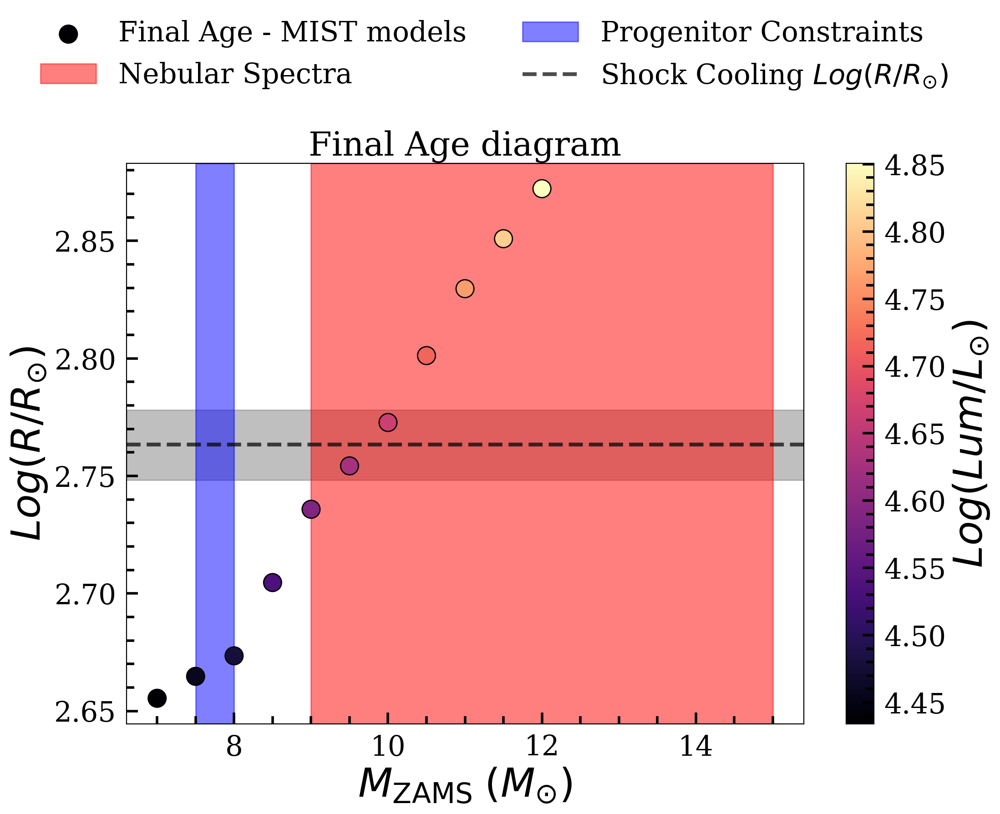

In [82]:
plt.rcdefaults()
plt.rcParams.update({
                    'lines.linewidth':1.0,
                    'font.family':'serif',
                    'font.weight':'normal',
                    'font.size':22.0,
                    'text.color':'black',
                    'axes.edgecolor':'black',
                    'axes.labelsize':'x-large',
                    'axes.labelweight':'normal',
    
                    'xtick.major.size':7+2,
                    'xtick.minor.size':4+2,
                    'xtick.major.pad':8,
                    'xtick.minor.pad':8,
                    'xtick.minor.visible':True,
                    'xtick.labelsize':'medium',
                    'xtick.direction':'in',
                    'xtick.minor.width':2.0,
                    'xtick.major.width':2.0,
    
                    'ytick.major.size':7+2,
                    'ytick.minor.size':4+2,
                    'ytick.major.pad':8,
                    'ytick.minor.pad':8,
                    'ytick.minor.visible':True,
                    'ytick.direction':'in',
                    'ytick.labelsize':'medium',
                    'ytick.minor.width':2.0,
                    'ytick.major.width':2.0,
    
                    'legend.numpoints':1,
                    #'legend.fontsize':'x-large',
                    'legend.shadow':False,
                    'legend.frameon':False})

fig, ax = plt.subplots(figsize=(12,8), dpi=200)

scatter = ax.scatter(masses_toplot, last_radii, c=last_loglum,
                     cmap='magma', ec='black', s=200, label="Final Age - MIST models",
                     zorder=100)

# Add a colorbar
colorbar = plt.colorbar(scatter)
colorbar.set_label('$Log(Lum/L_{\odot})$')
ax.set_xlabel('$M_{\\rm ZAMS}\;(M_{\odot})$')
ax.set_ylabel('$Log(R/R_{\odot})$')
ax.set_title('Final Age diagram')

# ax.scatter(masses[2:]/10, last_radii[2:], c=last_loglum[2:])
logR_2022acko = np.log10(580)
logR_2022acko_max = np.log10(600)
logR_2022acko_min = np.log10(560)

ax.axhspan(logR_2022acko_min, logR_2022acko_max, color='gray', alpha=.5)

ax.axvspan(9, 15, color='red', alpha=.5, label="Nebular Spectra")

ax.axvspan(7.5, 8, color='blue', alpha=.5, label="Progenitor Constraints")

ax.axhline(logR_2022acko, ls='--', c='black', alpha=.7, lw=3, label='Shock Cooling $Log(R/R_{{\odot}})$')


#ax.set_ylim(logR_2022acko-.1, np.max(last_radii)+.1)
ax.legend(ncols=2, bbox_to_anchor=(1.25, 1.3))
plt.savefig('outputs/images/paper2025/LogRxLogT_newestimate.pdf', bbox_inches='tight')

## Radius evolution

In [58]:
ten13cmtoRsol = 1e13*1.4374e-11
14374/ten13cmtoRsol

100.0

In [59]:
700/ten13cmtoRsol

4.869903993321274

(array([7., 6., 6., 6., 6., 7., 7., 3., 1., 1.]),
 array([17499838.21525983, 17500617.2436968 , 17501396.27213377,
        17502175.30057075, 17502954.32900771, 17503733.35744468,
        17504512.38588165, 17505291.41431862, 17506070.4427556 ,
        17506849.47119257, 17507628.49962954]),
 <BarContainer object of 10 artists>)

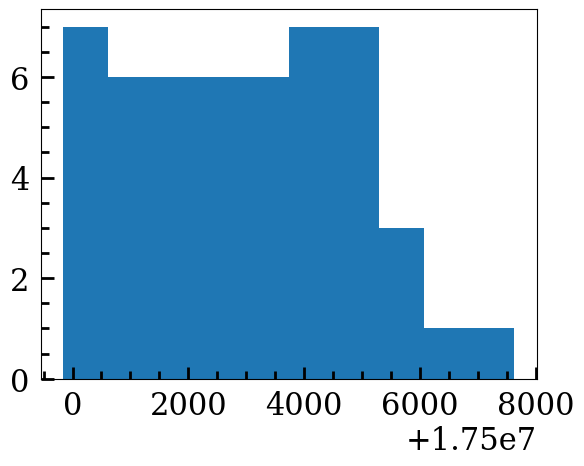

In [ ]:
plt.hist(age[-50:])
np.max(age[-50:])

/tmp/ipykernel_2044562/2886553861.py:103: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


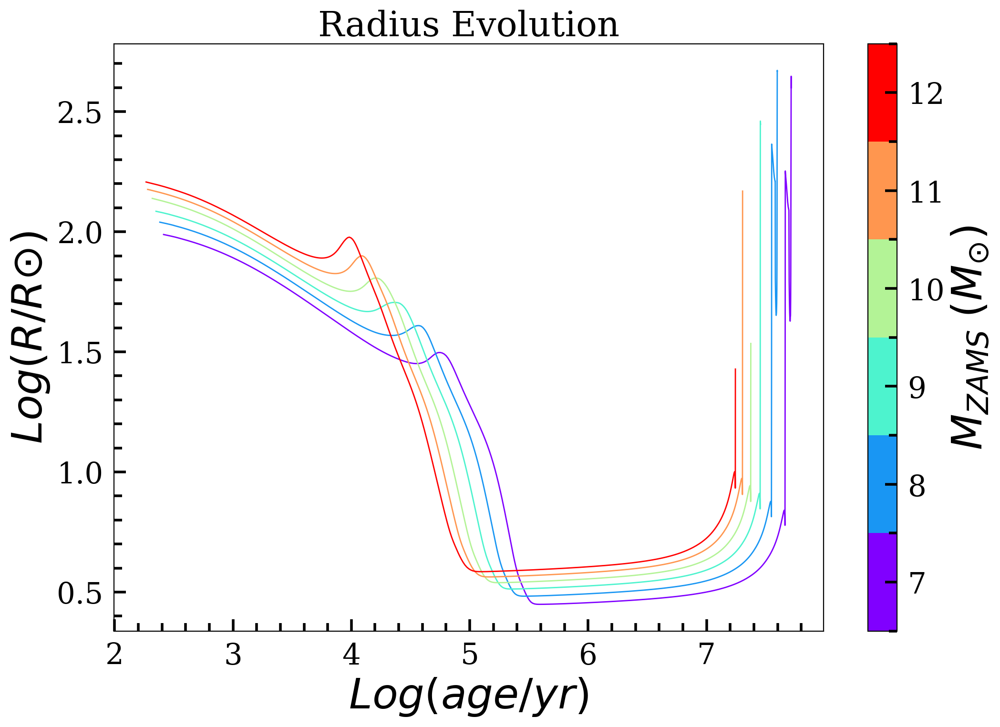

In [91]:
plt.rcdefaults()
plt.rcParams.update({
                    'lines.linewidth':1.0,
                    'font.family':'serif',
                    'font.weight':'normal',
                    'font.size':22.0,
                    'text.color':'black',
                    'axes.edgecolor':'black',
                    'axes.labelsize':'x-large',
                    'axes.labelweight':'normal',
    
                    'xtick.major.size':7+2,
                    'xtick.minor.size':4+2,
                    'xtick.major.pad':8,
                    'xtick.minor.pad':8,
                    'xtick.minor.visible':True,
                    'xtick.labelsize':'medium',
                    'xtick.direction':'in',
                    'xtick.minor.width':2.0,
                    'xtick.major.width':2.0,
    
                    'ytick.major.size':7+2,
                    'ytick.minor.size':4+2,
                    'ytick.major.pad':8,
                    'ytick.minor.pad':8,
                    'ytick.minor.visible':True,
                    'ytick.direction':'in',
                    'ytick.labelsize':'medium',
                    'ytick.minor.width':2.0,
                    'ytick.major.width':2.0,
    
                    'legend.numpoints':1,
                    #'legend.fontsize':'x-large',
                    'legend.shadow':False,
                    'legend.frameon':False})

fig, ax = plt.subplots(figsize=(12,8), dpi=200)

ax.set_xlabel('$Log(age/yr)$')
ax.set_ylabel('$Log(R/R{\odot})$')
ax.set_title('Radius Evolution')

# ax.scatter(masses[2:]/10, last_radii[2:], c=last_loglum[2:])
# logR_2022acko = np.log10(420)
# ax.axhline(logR_2022acko, ls='--', c='black', alpha=.7, lw=3, label='2022acko $Log(R/R_{\odot})$')
# ax.set_ylim(logR_2022acko-.1, np.max(last_radii)+.1)
# ax.legend()


inplot_masses = []
i=0
for i in range(len(masses)):
    if i>1 & i%2==0:
        inplot_masses.append(int(masses[i]/10))
    i+=1
continuous_cmap = plt.get_cmap('rainbow')

# Discretize the colormap
# discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, n_bins)))
from matplotlib.colors import ListedColormap
from matplotlib.colors import BoundaryNorm

cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, len(inplot_masses))))  # 5 distinct colors
norm = BoundaryNorm(np.arange(len(inplot_masses) + 1) - 0.5 +inplot_masses[0], cmap.N)  # Define boundaries for discrete values


last_radii = []
last_loglum = []
i=0
j=0
for xn in eepdict:
    if i>1 & i%2==0:
        eep = eepdict[xn]
        loglum = eep.eeps['log_L']#[-500:]
        logTeff = eep.eeps['log_Teff']#[-500:]
        radius = eep.eeps['log_R']#[-500:]
        age = eep.eeps['star_age']#[-500:]
        ax.plot(np.log10(age), radius, lw=1, color=cmap(j))
        # print()
        j+=1
        # ax.annotate(f'${masses[i]//10} M_{{\odot}}$', xy=(logTeff[0],loglum[0]))
    i+=1

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Empty array since we aren't using a specific mappable object
cbar = plt.colorbar(sm, ticks=inplot_masses, ax=plt.gca())  # Explicitly associate colorbar with the current axes
cbar.set_label('$M_{ZAMS}\;(M_{\odot})$')

logtef_vandyk_2022acko = np.log10(3552)
loglum_vandyk_2022acko = 4.304

def boltzman_law(R, T):
    mtoRsun = 6.957e-8
    WtoLsun = 3.827e-26
    sigma = 5.670400e-8 * WtoLsun/mtoRsun**2# W m−2 K−4
    L =4*np.pi*sigma*R**2*T**4
    return L

# Lplot = boltzman_law()

# ax.scatter(logtef_vandyk_2022acko, loglum_vandyk_2022acko, marker='s', fc='red', s=60, ec='black', label='2022acko-VanDyk+23')
# ax.invert_xaxis()
ax.legend()
# plt.savefig('paper_images/LogRxLogT.pdf')


## H-R diagram

/tmp/ipykernel_2044562/3845430226.py:103: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


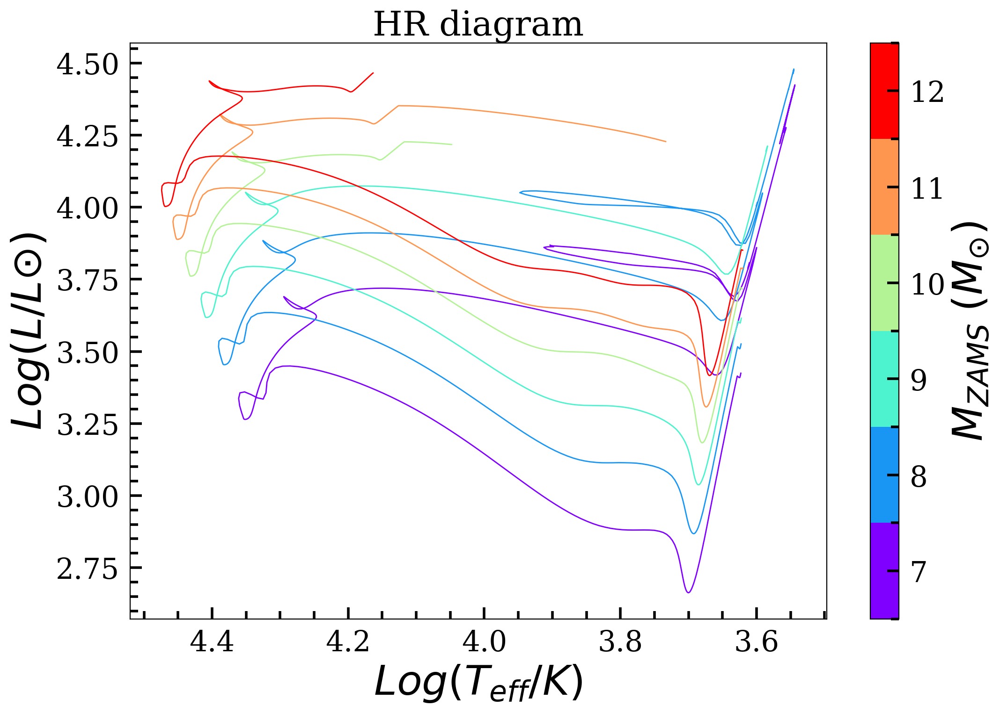

In [90]:
plt.rcdefaults()
plt.rcParams.update({
                    'lines.linewidth':1.0,
                    'font.family':'serif',
                    'font.weight':'normal',
                    'font.size':22.0,
                    'text.color':'black',
                    'axes.edgecolor':'black',
                    'axes.labelsize':'x-large',
                    'axes.labelweight':'normal',
    
                    'xtick.major.size':7+2,
                    'xtick.minor.size':4+2,
                    'xtick.major.pad':8,
                    'xtick.minor.pad':8,
                    'xtick.minor.visible':True,
                    'xtick.labelsize':'medium',
                    'xtick.direction':'in',
                    'xtick.minor.width':2.0,
                    'xtick.major.width':2.0,
    
                    'ytick.major.size':7+2,
                    'ytick.minor.size':4+2,
                    'ytick.major.pad':8,
                    'ytick.minor.pad':8,
                    'ytick.minor.visible':True,
                    'ytick.direction':'in',
                    'ytick.labelsize':'medium',
                    'ytick.minor.width':2.0,
                    'ytick.major.width':2.0,
    
                    'legend.numpoints':1,
                    #'legend.fontsize':'x-large',
                    'legend.shadow':False,
                    'legend.frameon':False})

fig, ax = plt.subplots(figsize=(12,8), dpi=200)

ax.set_xlabel('$Log(T_{eff}/K)$')
ax.set_ylabel('$Log(L/L{\odot})$')
ax.set_title('HR diagram')

# ax.scatter(masses[2:]/10, last_radii[2:], c=last_loglum[2:])
# logR_2022acko = np.log10(420)
# ax.axhline(logR_2022acko, ls='--', c='black', alpha=.7, lw=3, label='2022acko $Log(R/R_{\odot})$')
# ax.set_ylim(logR_2022acko-.1, np.max(last_radii)+.1)
# ax.legend()


inplot_masses = []
i=0
for i in range(len(masses)):
    if i>1 & i%2==0:
        inplot_masses.append(int(masses[i]/10))
    i+=1
continuous_cmap = plt.get_cmap('rainbow')

# Discretize the colormap
# discrete_cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, n_bins)))
from matplotlib.colors import ListedColormap
from matplotlib.colors import BoundaryNorm

cmap = ListedColormap(continuous_cmap(np.linspace(0, 1, len(inplot_masses))))  # 5 distinct colors
norm = BoundaryNorm(np.arange(len(inplot_masses) + 1) - 0.5 +inplot_masses[0], cmap.N)  # Define boundaries for discrete values


last_radii = []
last_loglum = []
i=0
j=0
for xn in eepdict:
    if i>1 & i%2==0:
        eep = eepdict[xn]
        loglum = eep.eeps['log_L']#[-500:]
        logTeff = eep.eeps['log_Teff']#[-500:]
        radius = eep.eeps['log_R']#[-500:]
        age = eep.eeps['star_age']#[-500:]
        ax.plot(logTeff, loglum, lw=1, color=cmap(j))
        # print()
        j+=1
        # ax.annotate(f'${masses[i]//10} M_{{\odot}}$', xy=(logTeff[0],loglum[0]))
    i+=1

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Empty array since we aren't using a specific mappable object
cbar = plt.colorbar(sm, ticks=inplot_masses, ax=plt.gca())  # Explicitly associate colorbar with the current axes
cbar.set_label('$M_{ZAMS}\;(M_{\odot})$')

logtef_vandyk_2022acko = np.log10(3552)
loglum_vandyk_2022acko = 4.304

def boltzman_law(R, T):
    mtoRsun = 6.957e-8
    WtoLsun = 3.827e-26
    sigma = 5.670400e-8 * WtoLsun/mtoRsun**2# W m−2 K−4
    L =4*np.pi*sigma*R**2*T**4
    return L

# Lplot = boltzman_law()

# ax.scatter(logtef_vandyk_2022acko, loglum_vandyk_2022acko, marker='s', fc='red', s=60, ec='black', label='2022acko-VanDyk+23')
ax.invert_xaxis()
ax.legend()
# plt.savefig('paper_images/LogRxLogT.pdf')


# Luminosity estimation 
## Boltzman $\sim RT^4$

In [1]:
import numpy as np
def boltzman_law(R, T):
    mtoRsun = 1.4378e-9
    WtoLsun = 2.604845e-27
    sigma = 5.670400e-8 * WtoLsun/mtoRsun**2# W m−2 K−4
    L =4*np.pi*sigma*R**2*T**4
    return L

In [2]:
R = 580# Rsun
T = 3500
L = boltzman_law(R,T) # Lsun
np.log10(L) #Lsun

4.656336651797249

# BPASS tests

In [25]:
import sys
# sys.path.insert(0, '../')
from lightcurve_fitting import lightcurve, models, fitting, bolometric
from pkg_resources import resource_filename
from IPython.display import display, Math
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import matplotlib as mpl
import read_mist_models
%matplotlib inline
import pandas as pd

In [17]:
model_names

[]

In [18]:
# Observed value and 3σ bounds
f814_abs_mag = 26.24 - 30.81  # => -4.57
f814_err = 0.07
f814_3sigma_bounds = (f814_abs_mag - 3*f814_err, f814_abs_mag + 3*f814_err)

# Model directory and file paths
bpas_models_dir = "/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels/NEWBINMODS/NEWBINMODS/z008/"
model_names = [os.path.join(bpas_models_dir, f) for f in os.listdir(bpas_models_dir)]

print(f"Found {len(model_names)} models.")

# Storage for matching models
matching_models = []

for fname in model_names:
    try:
        data = np.genfromtxt(fname)
        if data.ndim != 2 or data.shape[1] <= 72:
            continue  # malformed or incomplete file

        last_val = data[-1, 72]

        if f814_3sigma_bounds[0] <= last_val <= f814_3sigma_bounds[1]:
            matching_models.append((fname, last_val))

    except Exception as e:
        print(f"Error processing {fname}: {e}")

# Output results
print(f"\nMatching models within 3σ of F814W abs mag (-4.57 ± 0.21):")
for fname, val in matching_models:
    print(f"{os.path.basename(fname)} → F814W = {val:.2f}")

Found 12663 models.

Matching models within 3σ of F814W abs mag (-4.57 ± 0.21):
sneplot-z008-20-0.3-1 → F814W = -4.45
sneplot-z008-20-0.5-2.6 → F814W = -4.75
sneplot-z008-16-0.1-2 → F814W = -4.37
sneplot-z008-35-0.4-2.6 → F814W = -4.73
sneplot-z008-40-0.3-3.4 → F814W = -4.77
sneplot-z008-20-0.2-1.6 → F814W = -4.48
sneplot-z008-22-0.1-2.6 → F814W = -4.52
sneplot-z008-40-0.2-3.2 → F814W = -4.54
sneplot-z008-25-0.4-0.8 → F814W = -4.36
sneplot-z008-18-0.3-1.6 → F814W = -4.74
sneplot-z008-100-0.1-0.6 → F814W = -4.71
sneplot-z008-22-0.3-2.4 → F814W = -4.53
sneplot-z008-25-0.3-1.6 → F814W = -4.38
sneplot-z008-16-0.3-2 → F814W = -4.39
sneplot-z008-21-0.6-2.4 → F814W = -4.71
sneplot-z008-25-0.4-1.6 → F814W = -4.43
sneplot-z008-18-0.5-1.2 → F814W = -4.69
sneplot-z008-8.5-0.5-1.6 → F814W = -4.65
sneplot-z008-12-0.4-1.4 → F814W = -4.70
sneplot-z008-20-0.1-1.8 → F814W = -4.49
sneplot-z008-24-0.3-0.6 → F814W = -4.43
sneplot-z008-19-0.3-1.4 → F814W = -4.53
sneplot-z008-23-0.4-0 → F814W = -4.68
sneplo

In [21]:
matching_models[0]

('/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels/NEWBINMODS/NEWBINMODS/z008/sneplot-z008-20-0.3-1',
 -4.452273)

In [64]:
lc

NameError: name 'lc' is not defined

In [ ]:
rows = []

for filename, val in matching_models:
    try:
        data = np.genfromtxt(filename)
        if data.ndim != 2 or data.shape[1] <= 37:
            continue  # skip incomplete files

        M1_final = data[-1, 5]
        M2_final = data[-1, 37]

        base = os.path.basename(filename).replace("sneplot-", "")
        z_str, M1_str, q_str, logP_str = base.split("-")

        row = {
            "filename": filename,
            # "z": float(z_str),
            "M1": float(M1_str),
            "M2": float(M1_str) * float(q_str),
            "q": float(q_str),
            "logP": float(logP_str),
            "F814W": val,
            "M1_final": M1_final,
            "M2_final": M2_final,
        }
        rows.append(row)

    except Exception as e:
        print(f"Error reading {filename}: {e}")


,filename,M1,M2,q,logP,F814W,M1_final,M2_final
296,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,14.0,2.8,0.2,1.2,-4.779940,3.67892,2.802799
471,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,18.0,3.6,0.2,1.8,-4.779184,5.55692,3.600627
265,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,17.0,15.3,0.9,0.0,-4.779148,13.10982,15.313290
417,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,22.0,15.4,0.7,0.8,-4.778854,6.54462,16.051980
804,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,20.0,14.0,0.7,1.8,-4.778648,6.44193,14.312460


In [34]:

# Build dataframe
df = pd.DataFrame(rows)
df = df.sort_values(by="F814W")
df = df.copy()[(df["M1"] < 50)*(df["M1"] > 5)]
df.head()

,filename,M1,M2,q,logP,F814W,M1_final,M2_final
296,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,14.0,2.8,0.2,1.2,-4.779940,3.67892,2.802799
471,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,18.0,3.6,0.2,1.8,-4.779184,5.55692,3.600627
265,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,17.0,15.3,0.9,0.0,-4.779148,13.10982,15.313290
417,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,22.0,15.4,0.7,0.8,-4.778854,6.54462,16.051980
804,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,20.0,14.0,0.7,1.8,-4.778648,6.44193,14.312460


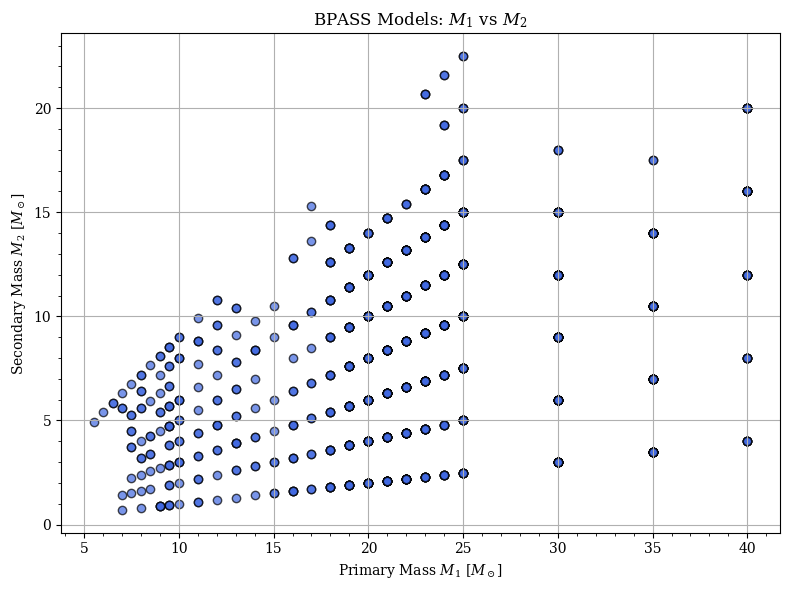

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(df["M1"], df["M2"], c='royalblue', edgecolor='k', alpha=0.7)

plt.xlabel("Primary Mass $M_1$ [$M_\\odot$]")
plt.ylabel("Secondary Mass $M_2$ [$M_\\odot$]")
plt.title("BPASS Models: $M_1$ vs $M_2$")
plt.grid(True)
plt.tight_layout()
plt.show()

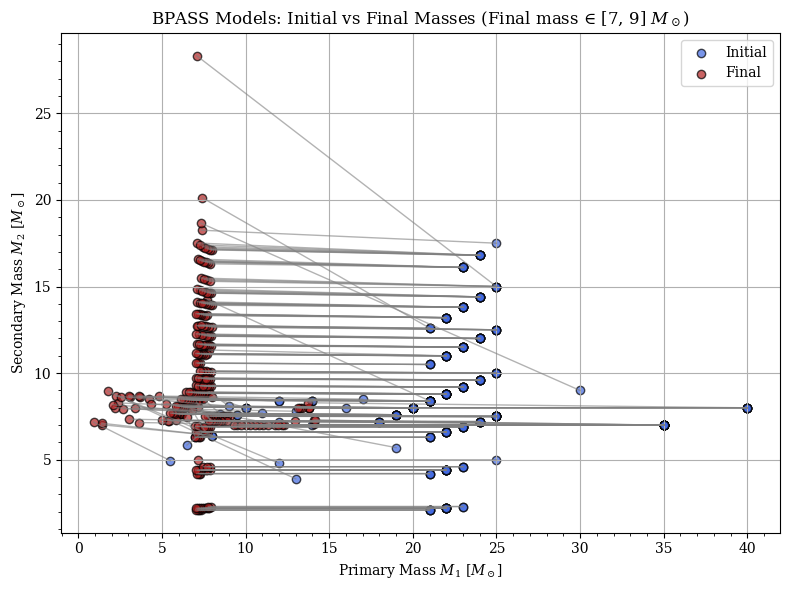

In [38]:
import matplotlib.pyplot as plt

# Filter models
df_filtered = df[(df["M1_final"].between(7, 8)) | (df["M2_final"].between(7, 9))]

plt.figure(figsize=(8,6))

# Plot connections
for _, row in df_filtered.iterrows():
    plt.plot([row["M1"], row["M1_final"]],
             [row["M2"], row["M2_final"]],
             color='gray', linewidth=1, alpha=0.6)

# Plot initial and final mass points
plt.scatter(df_filtered["M1"], df_filtered["M2"], c='royalblue', edgecolor='k', alpha=0.7, label='Initial')
plt.scatter(df_filtered["M1_final"], df_filtered["M2_final"], c='firebrick', edgecolor='k', alpha=0.7, label='Final')

plt.xlabel("Primary Mass $M_1$ [$M_\\odot$]")
plt.ylabel("Secondary Mass $M_2$ [$M_\\odot$]")
plt.title("BPASS Models: Initial vs Final Masses (Final mass ∈ [7, 9] $M_\\odot$)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

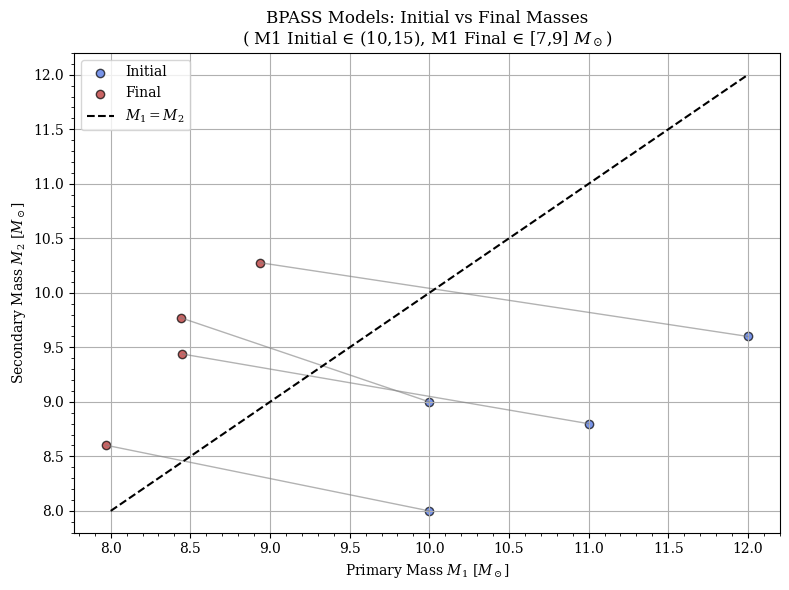

In [61]:
plt.figure(figsize=(8,6))
# Filter models
df_filtered = df[(df["M1"].between(10, 15)) & (df["M1_final"].between(7, 9))]
# Plot connections
for _, row in df_filtered.iterrows():
    plt.plot([row["M1"], row["M1_final"]],
             [row["M2"], row["M2_final"]],
             color='gray', linewidth=1, alpha=0.6)

# Scatter plots
plt.scatter(df_filtered["M1"], df_filtered["M2"], c='royalblue', edgecolor='k', alpha=0.7, label='Initial')
plt.scatter(df_filtered["M1_final"], df_filtered["M2_final"], c='firebrick', edgecolor='k', alpha=0.7, label='Final')

# Diagonal line
lims = [min(df_filtered["M1"].min(), df_filtered["M2"].min()),
        max(df_filtered["M1"].max(), df_filtered["M2"].max())]
plt.plot(lims, lims, 'k--', lw=1.5, label="$M_1 = M_2$")

# Labels and layout
plt.xlabel("Primary Mass $M_1$ [$M_\\odot$]")
plt.ylabel("Secondary Mass $M_2$ [$M_\\odot$]")
plt.title("BPASS Models: Initial vs Final Masses\n( M1 Initial ∈ (10,15), M1 Final ∈ [7,9] $M_\\odot$)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [45]:
f160_abs_mag

-6.389999999999997

In [63]:
df_filtered

,filename,M1,M2,q,logP,F814W,M1_final,M2_final,H band
387,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,10.0,9.0,0.9,0.8,-4.750532,8.43961,9.771459,-5.054741
806,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,11.0,8.8,0.8,0.6,-4.655554,8.45027,9.438829,-5.001230
342,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,10.0,8.0,0.8,0.6,-4.600318,7.97120,8.602406,-4.957433
404,/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels...,12.0,9.6,0.8,0.6,-4.575429,8.93755,10.276450,-4.929762


In [62]:
# Create copies to avoid SettingWithCopyWarning
df_filtered = df_filtered.copy()

# Initialize empty lists to hold the values
col59_last_vals = []
col79_last_vals = []

for filename in df_filtered["filename"]:
    try:
        data = np.genfromtxt(filename)
        if data.ndim != 2 or data.shape[1] < 80:
            col59_last_vals.append(np.nan)
            col79_last_vals.append(np.nan)
            continue

        col59_last_vals.append(data[-1, 59])
        # col79_last_vals.append(data[-1, 7])

    except Exception as e:
        print(f"Error reading {filename}: {e}")
        col59_last_vals.append(np.nan)
        # col79_last_vals.append(np.nan)

# Add to DataFrame
df_filtered["H band"] = col59_last_vals
# df_filtered["col79_last"] = col79_last_vals

In [ ]:
f814_abs_mag = 26.24 - 30.81
# f160_abs_mag = 24.42 - 30.81

f814_err = 0.07
# f160_err = 0.03

f814_abs_mag,f160_abs_mag

bpas_models_dir = "/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels/NEWBINMODS/NEWBINMODS/z008/"
model_names = [bpas_models_dir + f for f in os.listdir(bpas_models_dir)]
data = np.genfromtxt(model_names[0])
data.shape

(-4.57, -6.389999999999997)

In [7]:
bpas_models_dir = "/tf/astrodados2/BPASS-2.3/bpass-v2.2-newmodels/NEWBINMODS/NEWBINMODS/z008/"
model_names = [bpas_models_dir + f for f in os.listdir(bpas_models_dir)]
data = np.genfromtxt(model_names[0])
data.shape

(157, 96)

In [12]:
data[:,72]

array([-6.92022 , -6.856966, -6.800817, -6.753932, -6.815382, -6.909251,
       -7.024292, -7.164159, -7.295671, -7.40442 , -7.533402, -7.688822,
       -7.702838, -7.868159, -8.066727, -8.26444 , -8.214692, -8.144595,
       -8.074736, -8.022554, -7.947669, -7.864125, -7.74342 , -7.61391 ,
       -7.452645, -7.410907, -7.287226, -7.152216, -7.022843, -6.902386,
       -6.767008, -6.628987, -6.514885, -6.400933, -6.286994, -6.185384,
       -6.081494, -5.975221, -5.879268, -5.804391, -5.728739, -5.657016,
       -5.596883, -5.528458, -5.472519, -5.434823, -5.391534, -5.335252,
       -5.304959, -5.305254, -5.305031, -5.304768, -5.304527, -5.304318,
       -5.304119, -5.303884, -5.303588, -5.303418, -5.30327 , -5.3031  ,
       -5.302888, -5.302587, -5.302374, -5.302179, -5.301932, -5.301654,
       -5.301349, -5.301092, -5.300842, -5.300535, -5.300309, -5.300078,
       -5.299846, -5.299661, -5.299375, -5.299098, -5.299033, -5.298944,
       -5.298592, -5.297577, -5.294988, -5.290638, 

# Apodization tests

In [ ]:
def smooth_transition(t, f1, f2, nebular_time, AS=10): #AS -> apodization scaler
    fermi_weight = 1/(1+np.exp((t-nebular_time)/AS))
    print(fermi_weight[0])
    apodized_f1 = f1*fermi_weight
    apodized_f2 = f2*(1-fermi_weight)
    return apodized_f1+apodized_f2

In [ ]:
f1 = lambda x: 1e19*(-1+2*x)
f2 = lambda x: 1e19*(1-2*(-2-x))
t = np.linspace(0,3,100)
f1_t = f1(t)
f2_t = f2(t)

nebular_time = 1.5
AS = .2
apodized_f1f2 = smooth_transition(t, f1_t, f2_t, nebular_time=nebular_time, AS=AS)

plt.plot(t, f1_t, ls='--', c='r')
plt.plot(t, f2_t, ls='--', c='r')
plt.plot(t, apodized_f1f2, ls='-', c='black')
plt.axvline(nebular_time-AS, ls='--', alpha=.5)
plt.axvline(nebular_time+AS, ls='--', alpha=.5)

In [ ]:
f1 = lambda x: np.exp(x)#1e19*(-1+2*x)
f2 = lambda x, s, z: np.exp((z*x)**s)#1e19*(1-2*(-2+x))
f3 = lambda x, s,z:z*np.cosh(x)**s
t = np.linspace(0,2,100)
# f1_t = f1(t)
# f2_t = f2(t)

nebular_time = 1.5
AS = .2
# apodized_f1f2 = smooth_transition(t, f1_t, f2_t, nebular_time=nebular_time, AS=AS)

# plt.plot(t, f1_t, ls='--', c='r')
plt.plot(t, f3(t,s=1,z=2), ls='--', c='black', lw=2)
for s in np.linspace(1,3,5):
    plt.plot(t, f3(t,s,z=2), ls='--', c='r')
# plt.plot(t, apodized_f1f2, ls='-', c='black')
# plt.yscale("log")
# plt.ylim(0,1)
# plt.axvline(nebular_time-AS, ls='--', alpha=.5)
# plt.axvline(nebular_time+AS, ls='--', alpha=.5)

# Nebular Spectra fitting

In [ ]:
import sys
sys.path.insert(0, '../')



import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
from lightcurve_fitting import lightcurve
from scipy.optimize import curve_fit
import emcee
from astropy.io import fits
from astropy.table import Table
%matplotlib inline

import pysynphot as psp

In [ ]:
spectrum_file = '2022acko_S1_LRISr_20240810_tellcorr.fits'
spectrum_data = fits.open(spectrum_file)
spectrum_data = Table(spectrum_data[1].data)

In [ ]:
mpl.rcdefaults()
plt.rcParams.update({'font.size':20,#Fonts
                     'legend.fontsize':20,
                     'font.family':'serif',
                     'font.weight':'normal',
                     'axes.labelweight':'normal',
                     'axes.labelsize':18,
                     # X-axis
                     'xtick.direction':'in',                     
                     'xtick.major.size':7,
                     'xtick.minor.size':4,
                     'xtick.major.pad':8,
                     'xtick.minor.pad':8,
                     'xtick.major.width':2,
                     'xtick.minor.width':2,
                     'xtick.minor.visible':True,
                     # Y-axis
                     'ytick.direction':'in', 
                     'ytick.major.size':7,
                     'ytick.minor.size':4,
                     'ytick.major.pad':8,
                     'ytick.minor.pad':8,
                     'ytick.major.width':2,
                     'ytick.minor.width':2,
                     'ytick.minor.visible':True,
                     
                    })

mask = np.array(spectrum_data.copy()['mask']==1)
wl = spectrum_data.copy()['wave'][mask]
flux = spectrum_data.copy()['flux'][mask]
ivar = spectrum_data.copy()['ivar'][mask]
sigma = spectrum_data.copy()['sigma'][mask]


hst_filt_file = 'lightcurve_fitting/filters/CTIO_DECam.i.dat'#'HST_ACS_HRC.F555W.dat'
f555w_table = Table.read(jwst_filt_file, format='ascii', names=('wl', 'T'))
f555w_wl = f555w_table['wl']
f555w_T = f555w_table['T']


fig, ax = plt.subplots(figsize=(12,6), dpi=200)


ylabel_txt = 'Flux Density $\\rm [10^{-16}\; ergs\; s^{-1}\; cm^{-1}\; \AA^{-1}]$'
ax.set_ylabel(ylabel_txt)
xlabel_txt = 'Rest-frame Wavelength $(\AA)$'
ax.set_xlabel(xlabel_txt)

# ax.set_xlim(min(wl), max(wl))



# (flux[1:] - flux[:-1])/np.mean(wl[1:] - wl[:-1])
ax.plot(wl, flux, c='gray', label='SN 2022acko + 613 d')
ax.plot(wl, sigma, c='red', ls='--', label='sigma')
# plt.plot(f555w_wl,f555w_T)
ax.legend()

# ax.plot(wl, sigma)
# plt.xlim(6000,10000)

In [46]:
np.log(0.012), np.log(3*1e41/(3.846*1e33))

log_Lpl = np.log(3*1e41/(3.846*1e33))
Log_Mni = np.log(0.012)

logmni_loglum = lambda loglum: 1.55*loglum+-14.51
logmni_loglum(log_Lpl)

13.657002047453526

In [12]:
data = pd.read_csv("valenti16_tpt_distribution.csv", header=None)

In [16]:
np.sum(data[0]*data[1]/np.sum(data[1]))

112.05761726060025

In [18]:
# Load the CSV file (assumes columns: value, frequency)
df = pd.read_csv("valenti16_tpt_distribution.csv", header=None, names=["value", "frequency"])

# Weighted mean
weighted_mean = np.average(df["value"], weights=df["frequency"])

# Weighted standard deviation
weighted_var = np.average((df["value"] - weighted_mean) ** 2, weights=df["frequency"])
weighted_std = np.sqrt(weighted_var)

print(f"Weighted mean: {weighted_mean:.4f}")
print(f"Weighted standard deviation: {weighted_std:.4f}")

Weighted mean: 112.0576
Weighted standard deviation: 15.3383


In [54]:
y, x

(0      1.005403
 1      5.037067
 2      5.986934
 3     10.026745
 4      3.070738
 5      3.017516
 6      4.040265
 7      2.032136
 8      4.058685
 9      3.024069
 10     1.027543
 Name: frequency, dtype: float64,
 0     0.186780
 1     0.083505
 2     0.054975
 3     0.037231
 4     0.025017
 5     0.017101
 6     0.007868
 7     0.005213
 8     0.003556
 9     0.002399
 10    0.001615
 Name: value, dtype: float64)

In [60]:
np.min(x), np.max(x)

(0.0016153990476176, 0.1867799900025429)

Weighted mean: 0.0356
Weighted standard deviation: 0.0350


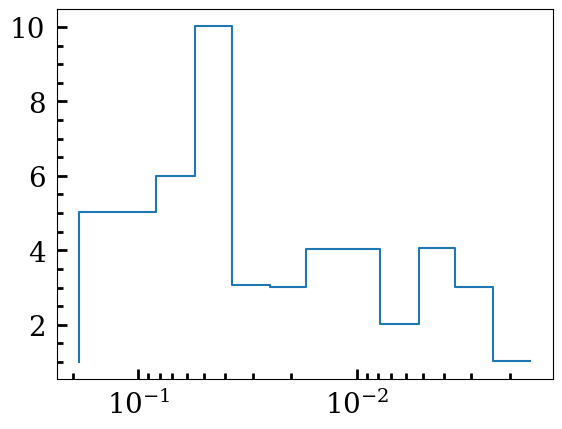

In [59]:
df = pd.read_csv("valenti16_56ni_distribution.csv", header=None, names=["value", "frequency"])
x = df["value"]
y = df["frequency"]
plt.step(x, y, )
plt.xscale('log')
plt.gca().invert_xaxis()# plt.xlim(1e-1, 1e-4)

weighted_mean = np.average(df["value"], weights=df["frequency"])

# Weighted standard deviation
weighted_var = np.average((df["value"] - weighted_mean) ** 2, weights=df["frequency"])
weighted_std = np.sqrt(weighted_var)

print(f"Weighted mean: {weighted_mean:.4f}")
print(f"Weighted standard deviation: {weighted_std:.4f}")